In [1]:
# system
from pathlib import Path
from tqdm import tqdm
import pickle

# analysis
import numpy as np
import pandas as pd
import pynapple as nap
from scipy import stats
import glob 
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score
import warnings
import os

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm
import patsy
from scipy.stats import pearsonr
from matplotlib.collections import LineCollection

from umap import UMAP
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA
import pickle
import os
from collections import defaultdict

# Here we repeat the imports and instantiate ONE, so this cell can also be run stand-alone
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.ndimage

from iblutil.numerical import bincount2D
from iblatlas.atlas import BrainRegions
from one.api import ONE
from brainbox.io.one import SpikeSortingLoader, SessionLoader
from ibl_style.style import figure_style

# set the IBL style for figures
# from ibl_style.style import figure_style
# figure_style()
from reproducible_ephys_functions import get_insertions
from functions import idxs_from_files
from one.api import ONE
one= ONE()

In [2]:
prefix = '/home/ines/repositories/'
prefix = '/Users/ineslaranjeira/Documents/Repositories/'


# Load data

In [3]:
insertions = get_insertions(level=0, one=one, freeze='freeze_2024_03')
repro_ephys_insertions = pd.DataFrame.from_dict(insertions)

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/one/webclient.py:144: RuntimeWarning: Failed to connect, returning cached response
  warnings.warn('Failed to connect, returning cached response', RuntimeWarning)


In [4]:
repro_eid = repro_ephys_insertions['probe_insertion']

In [5]:
import brainwidemap
# this dataframe holds a summary of all the sessions
# and for us importantly, the eids and pids
bwm_df = brainwidemap.bwm_query()  # each row of this dataframe is a recording

n_sessions = bwm_df["eid"].unique().shape[0]
n_insertions = bwm_df["pid"].unique().shape[0]
print(
    f"{n_sessions} sessions with {n_insertions} individual neuropixel recordings"
)
# bwm_df.head()

Loading bwm_query results from fixtures/2023_12_bwm_release.csv
459 sessions with 699 individual neuropixel recordings


In [6]:
bwm_pid = bwm_df['pid'].unique()

## Getting units from the brainwide map

In [7]:
units_df = brainwidemap.bwm_units(one)
n_units = units_df.shape[0]
print(f"{n_units} units present in the table")
# units_df.head()

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/one/webclient.py:144: RuntimeWarning: Failed to connect, returning cached response
  warnings.warn('Failed to connect, returning cached response', RuntimeWarning)


Loading bwm_query results from fixtures/2023_12_bwm_release.csv


EndpointConnectionError: Could not connect to the endpoint URL: "https://ibl-brain-wide-map-private.s3.amazonaws.com/aggregates/2024_Q2_IBL_et_al_BWM/trials.pqt"

## LDA axis

In [8]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')

# lda = pd.read_pickle(data_path+'mouse_LDA_3_bins_cut')
# lda = pd.read_pickle(data_path+'mouse_LDA_quadrants')
# lda = pd.read_pickle(data_path+'reaction_PLS_5_bins')
lda_eid = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session']
lda_pid = bwm_df.loc[bwm_df['eid'].isin(lda_eid), 'pid']

In [ ]:
use_eid = lda_pid
# use_eid = repro_eid
# use_eid = bwm_pid

In [ ]:
len(use_eid)

382

In [ ]:
repro_units = units_df.loc[units_df['pid'].isin(list(use_eid))]

## Querying and loading the data

Then we will query the brain region ACA. ACA has many sub-regions, and we need to get the list of neurons belinging to any of the sub-regions.

In [310]:
BRAIN_REGIONS = ['PPC', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions

regions = BrainRegions()
aca_leaf_nodes = regions.descendants(regions.acronym2id(BRAIN_REGIONS))
# print(f"List of regions to query: \n {aca_leaf_nodes['acronym']}")
BRAIN_REGIONS = repro_units['Beryl'].unique()  # All available in the session query

# Individual sessions

In [311]:
save_states_path = prefix + 'representation_learning_variability/paper-individuality/data/neuron_files/'
save_states_path = '/Users/ineslaranjeira/Google Drive/O meu disco/CCU/PhD Project/paper-individuality/data/neuron_files/'

filepaths = [os.path.join(save_states_path, filename) for filename in os.listdir(save_states_path)]
print(len(filepaths))

419


In [312]:
def get_psth(df, area, event_bins, pre_bins=20, post_bins=50):
    all_trials = []
    for event in event_bins:
        # Define window
        start = event - pre_bins
        end = event + post_bins
        
        # Ensure we don't go out of bounds
        if start >= 0 and end < len(df):
            # Extract data for all columns ending in '_spike_std'
            window = df.loc[start:end-1, [f'{area}_spike_mean']]
            all_trials.append(window.values)
            
    # Convert to 3D array: (Trials, Time, Areas)
    return np.array(all_trials)


def get_psth(df, col_name, events, pre=.5, post=1):
    all_trials = []
    for event in events:
        # Define window
        start = event - pre
        end = event + post
        # Extract data for all columns ending in '_spike_std'
        window = df.loc[(df['Bin'] >= start) & (df['Bin'] < end), col_name]
        if len(window) == int((pre + post) * 60):  # Assuming 60 Hz sampling rate
            all_trials.append(window.values)
            
    return np.array(all_trials)

# Larger binning

In [118]:
filepaths = [os.path.join(save_states_path, filename) for filename in os.listdir(save_states_path)][:1]
count_intersect = []
summary_df = pd.DataFrame()
for filepath in filepaths:
    # try:
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
            
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]

        # 1. Define the binning factor (e.g., 5 means 5 bins become 1 new bin)
        bin_factor = 5 
        new_df['Coarse_Bin'] = new_df['Bin'] // bin_factor

        # 3. Aggregate all numeric columns by the new bin
        # We sum the spike counts, but mean the 'most_likely_states' or other labels
        numeric_cols = [c for c in new_df.columns if '_spike_count' in c]
        other_cols = ['most_likely_states', 'broader_label'] # Add any non-spike columns you need

        agg_dict = {col: 'sum' for col in numeric_cols}
        agg_dict.update({col: 'first' for col in other_cols}) # Keeps the label of the first bin

        # 4. Perform the re-binning
        new_df = new_df.groupby(['Coarse_Bin', 'goCueTrigger_times']).agg(agg_dict).reset_index()

        # Now proceed with your existing area processing code...
        spike_columns = [col for col in new_df.columns if '_spike_count' in col]
        areas = np.unique([col.split('_neuron_')[0] for col in spike_columns])

        for area in areas:
            area_columns = [col for col in new_df.columns if area in col and '_spike_count' in col]
            new_df[f'{area}_spike_std'] = new_df[area_columns].std(axis=1)
            new_df[f'{area}_spike_mean'] = new_df[area_columns].mean(axis=1)


### Mean and std across neurons

In [ ]:
filepaths = [os.path.join(save_states_path, filename) for filename in os.listdir(save_states_path)][:1]
count_intersect = []
summary_df = pd.DataFrame()
for filepath in filepaths:
    # try:
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
            
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]

        spike_columns = [col for col in state_with_spikes.columns if '_spike_count' in col]
        areas = [col.split('_neuron_')[0] for col in spike_columns]
        new_df[col]

        for area in areas:
            area_columns = [col for col in state_with_spikes.columns if area in col]

            new_df[f'{area}_spike_std'] = new_df[area_columns].std(axis=1)
            new_df[f'{area}_spike_mean'] = new_df[area_columns].mean(axis=1)

        # summary_df = pd.concat([summary_df, new_df], ignore_index=True)
        
    # except Exception as e:
    #     print(f"Error processing {filepath}: {e}")

### Mean and std across trials only

In [ ]:
filepaths = [os.path.join(save_states_path, filename) for filename in os.listdir(save_states_path)]
count_intersect = []
summary_df = pd.DataFrame()
for filepath in filepaths:
    try:
        session_df = pd.DataFrame()
        per_neuron = pd.DataFrame()
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
            
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]
        area_names = np.unique([col.split('_neuron_')[0] for col in spike_columns])

        spike_columns = [col for col in state_with_spikes.columns if '_spike_count' in col]
        events = np.array(new_df['goCueTrigger_times'].unique())
        
        for col in spike_columns:
            psth_data = get_psth(new_df, col, events, pre=.5, post=1)
            neuron_std = psth_data.std(axis=0)**2    
            per_neuron[f'{col}_std'] = np.ravel(neuron_std)

        for area in area_names:
            area_columns = [col for col in per_neuron.columns if area in col]
            session_df[f'{area}_spike_std'] = per_neuron[area_columns].std(axis=1)
            session_df[f'{area}_spike_mean'] = per_neuron[area_columns].mean(axis=1)

        session_df['session'] = session_name
        summary_df = pd.concat([summary_df, session_df], ignore_index=True)
        
    except Exception as e:
        print(f"Error processing {filepath}: {e}")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/ineslaranjeira/Documents/Repositories/representation_learning_variability/paper-individuality/data/states_files/'

## Std after z-scoring

In [205]:
summary_df = pd.DataFrame()
counter = 0
for filepath in filepaths:
    try:
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
        state_with_spikes = state_with_spikes.loc[(state_with_spikes['Bin']> state_with_spikes['Bin'].min()+600) & 
                                                  (state_with_spikes['Bin']< state_with_spikes['Bin'].min()+900)]
        pid = list(state_with_spikes['session_pid'])[0]
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]
        
        spike_columns = [col for col in new_df.columns if '_spike_count' in col]
        area_names = np.unique([col.split('_neuron_')[0] for col in spike_columns])
        events = np.array(new_df['goCueTrigger_times'].unique())

        # 1. Z-score all neurons
        for col in spike_columns:
            col_mean = new_df[col].mean()
            col_std = new_df[col].std()
            new_df[col] = (new_df[col] - col_mean) / (col_std + 1e-6) # 1e-6 to avoid div by zero
            
        # 1. Compute PSTH per area
        # We store them in a temporary structure
        all_session_data = pd.DataFrame()
        area_data = []
        for area in area_names:
            area_cols = [c for c in spike_columns if area in c]
            # Get PSTH for ALL neurons in this area at once (Trials, Time, Neurons)
            # Assuming get_psth returns: (n_trials, n_time_bins)
            area_psths = [get_psth(new_df, col, events, pre=.5, post=1) for col in area_cols]
            area_psths = np.stack(area_psths, axis=-1) # (Trials, Time, Neurons)
            # 2. Calculate Synchrony (Variance across neurons for each time bin)
            # Result is (Trials, Time)
            trial_variances = area_psths.std(axis=0) 
            # 3. Average across trials to get (Time) for this session
            mean_session_sync = trial_variances.mean(axis=1)
            
            area_data.append(mean_session_sync)

        # Convert to DataFrame where each row is an area and columns are timesteps
        all_session_data = pd.DataFrame(area_data, 
                            columns=[f'time_{i}' for i in range(len(mean_session_sync))])
        all_session_data['area'] = area_names
        all_session_data['pid'] = pid
        all_session_data['session'] = session_name

        summary_df = pd.concat([summary_df, all_session_data], ignore_index=True)
        counter = counter + 1
        print(pid, counter)      
    except Exception as e:
        print(f"Error: {e}")


d06f4b61-42c1-4a8d-a2a5-c1cf8f7d0e47 1
3b729602-20d5-4be8-a10e-24bde8fc3092 2
86553ccc-2e51-4cfb-a8e6-80da6860c8d9 3
5bfcf68f-4e0b-46f8-a9e3-8e919d5ddd1c 4
7d999a68-0215-4e45-8e6c-879c6ca2b771 5
0685d767-80a2-49b6-a51a-0e9b1dd7a14d 6
c07d13ed-e387-4457-8e33-1d16aed3fd92 7
55001cb4-e10f-4657-9760-1228b590a69c 8
e05af01e-8721-4ec7-8d0f-dc022b3bebc3 9
6d24683c-da42-4610-baf0-7ceee7014394 10
93a76e52-fed0-494f-8852-2b978f56a8e7 11
89606895-287e-4559-8536-9830b047af34 12
f9d8aacd-b2a0-49f2-bd71-c2f5aadcfdd1 13
84fd7fa3-6c2d-4233-b265-46a427d3d68d 14
b7612153-372f-415a-9770-7101fbbbdc59 15
c42574be-0456-437f-8329-afc5a63b7e78 16
afe87fbb-3a17-461f-b333-e22903f1d70d 17
72c095b0-c7ab-4e22-a4aa-4163102de553 18
0ffa052a-fe3f-46c2-999d-43bd56b7826e 19
dac5defe-62b8-4cc0-96cb-b9f923957c7f 20
e8f9fba4-d151-4b00-bee7-447f0f3e752c 21
c64201ea-262e-45fe-8f41-5a074780cd59 22
a6fe3779-2b77-4b66-a625-a6078720e412 23
a63a7248-9393-478b-9478-64f421ef5eb8 24
c17772a9-21b5-49df-ab31-3017addea12e 25
7dcd74a9-

/tmp/ipykernel_65183/4264676628.py:48: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  summary_df = pd.concat([summary_df, all_session_data], ignore_index=True)


eab03c6e-bf98-48d2-8a0c-1887f34dd554 68
19c9caea-2df8-4097-92f8-0a2bad055948 69
5810514e-2a86-4a34-b7bd-1e4b0b601295 70
2e720cee-05cc-440e-a24b-13794b1ac01d 71
fd6d686b-eae1-44cb-adbb-159c69c85827 72
04c9890f-2276-4c20-854f-305ff5c9b6cf 73
eb04cc7c-7c10-4e7f-8593-9c3b9b6986f5 74
c536b0a9-b710-43c3-ba2c-5a0cccf98ec2 75
8b31b4bd-003e-4816-a3bf-2df4cc3558f8 76
b78b3c42-eee5-47c6-9717-743b78c0b721 77
94fcff55-2da2-4366-a2c7-2f58c05b54dc 78
26118c10-35dd-4ab1-9f0f-b9a89a1da070 79
8d0a5caf-2be2-48c1-bf1a-f538bacd46b4 80
9793c99d-f918-4931-8bba-fdb978bd8e0a 81
501ab543-9d02-4085-956d-22b9b3eeb543 82
0925fb1b-cf83-4f55-bfb7-aa52f993a404 83
f4ff3ff8-19b7-40c7-bf6f-8b577b811ed1 84
e4632651-5ba7-48a7-86db-5298b45a5bac 85
caf2170c-5463-46ce-8cd0-66f2e1e3376d 86
c0c3c95d-43c3-4e30-9ce7-0519d0473911 87
8f4fd564-7e34-4113-a6e4-ae40faa64f7a 88
c2ebf259-9777-4a8f-b1de-5302776961d2 89
31d8dfb1-71fd-4c53-9229-7cd48bee07e4 90
0393f34c-a2bd-4c01-99c9-f6b4ec6e786d 91
ec2fbc3e-cb2b-48cb-a521-3a6ca15e244c 92


In [206]:
save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
summary_df.to_pickle(save_path+'psths_zscored_std')

In [394]:
import sys
# If you're on NumPy 1.x, loading a pickle from NumPy 2.x:
sys.modules['numpy._core'] = np.core
sys.modules['numpy._core.numeric'] = np.core.numeric

save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
summary_df = pd.read_pickle(save_path+'psths_zscored_std')

In [396]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')
lda = lda.rename(columns={0: 'lda_1'})

# lda = pd.read_pickle(data_path+'mouse_LDA_3_bins_cut')
# lda = pd.read_pickle(data_path+'mouse_LDA_quadrants')
# lda = pd.read_pickle(data_path+'reaction_PLS_5_bins')
lda_eid = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session']
lda_pid = bwm_df.loc[bwm_df['eid'].isin(lda_eid), 'pid']

## Filter data per brain region

In [397]:
regions = BrainRegions()
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']

summary_df = summary_df.dropna(subset=['area']).copy()

# Acronyms → Allen IDs → Beryl IDs → Beryl acronyms
allen_ids = regions.acronym2id(summary_df['area'].values)
beryl_ids = regions.remap(allen_ids, source_map='Allen', target_map='Beryl')
summary_df['beryl_acronym'] = regions.id2acronym(beryl_ids)

filtered = summary_df[summary_df['beryl_acronym'].isin(BRAIN_REGIONS)]

In [398]:
lda_eid = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session']
lda_eid = lda_eid.sample(frac=0.5)  # randomly select half of the sessions
lda_pid = bwm_df.loc[bwm_df['eid'].isin(lda_eid), 'pid']
subsampled_lda = lda.loc[lda['session'].isin(lda_eid)]

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2478194192.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2478194192.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean


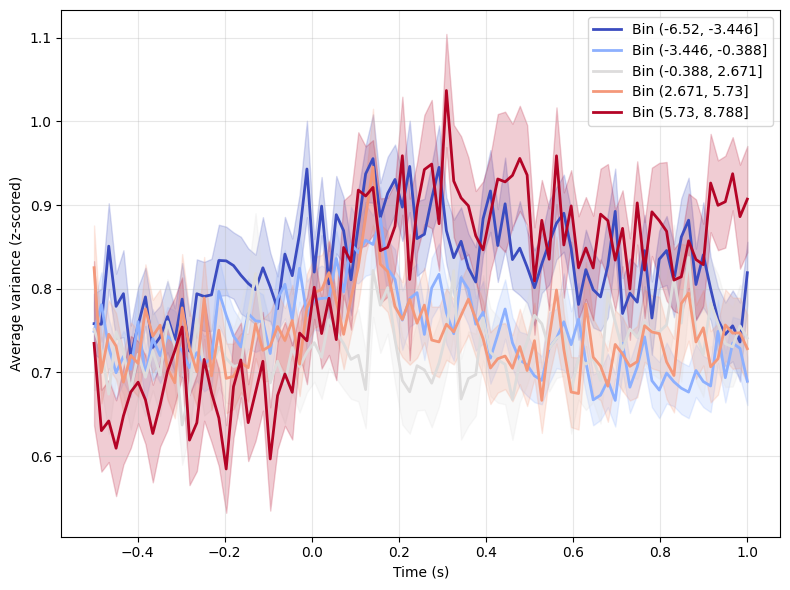

Number of sessions per bin:
binned1
(-6.52, -3.446]      59
(-3.446, -0.388]    121
(-0.388, 2.671]      60
(2.671, 5.73]        71
(5.73, 8.788]        20
Name: session, dtype: int64


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2478194192.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(merged_df.groupby('binned1')['session'].count().sort_index())


In [399]:
# BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions

# filtered = summary_df.loc[summary_df['area'].isin(BRAIN_REGIONS)]
merged_df = filtered.merge(subsampled_lda[['binned1', 'session']], on='session')
merged_df = filtered.merge(lda[['binned1', 'session']], on='session')
# merged_df = summary_df.merge(subsampled_lda[['binned1', 'session']], on='session')
# merged_df = summary_df.merge(lda[['binned1', 'session']], on='session')

# Assuming your timestep data is in columns (if not, we may need to reshape)
# Get the column names that represent timesteps (excluding metadata columns)
timestep_cols = [col for col in merged_df.columns if col not in ['session', 'binned1', 'area', 'beryl_acronym', 'pid']]

# Group by binned1 and calculate mean and standard error across sessions for each timestep
averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean

# Sort bins by their values
sorted_bins = sorted(averaged_by_bin.index)

# Create gradient color palette
colors = plt.cm.viridis(np.linspace(0, 1, len(sorted_bins)))
colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))

# Create the plot
plt.figure(figsize=(8, 6))
time_in_seconds = np.linspace(-0.5, 1.0, len(timestep_cols))

# Plot each bin as a separate line with error bands
for i, bin_value in enumerate(sorted_bins):
    mean_values = averaged_by_bin.loc[bin_value]
    error_values = stderr_by_bin.loc[bin_value]
    
    # Plot the main line
    plt.plot(time_in_seconds, mean_values, 
             label=f'Bin {bin_value}', 
             linewidth=2,
             color=colors[i])

    # Add error bands (mean ± standard error)
    plt.fill_between(time_in_seconds,
                     mean_values - error_values,
                     mean_values + error_values,
                     alpha=0.2,
                     color=colors[i])
# # Create the plot
# plt.figure(figsize=(8, 6))
# x_values = range(len(timestep_cols))

# # Plot each bin as a separate line with error bands
# for i, bin_value in enumerate(sorted_bins):
#     mean_values = averaged_by_bin.loc[bin_value]
#     error_values = stderr_by_bin.loc[bin_value]
    
#     # Plot the main line
#     plt.plot(x_values, mean_values, 
#              label=f'Bin {bin_value}', 
#              linewidth=2,
#              color=colors[i])
    
    # # Add error bands (mean ± standard error)
    # plt.fill_between(x_values,
    #                  mean_values - error_values,
    #                  mean_values + error_values,
    #                  alpha=0.2,
    #                  color=colors[i])
# plt.ylim([0.6, 1])
plt.xlabel('Time (s)')
plt.ylabel('Average variance (z-scored)')
# plt.title('Average Time Series by Binned1 Groups (with Standard Error)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
# Optional: Display summary statistics
print("Number of sessions per bin:")
print(merged_df.groupby('binned1')['session'].count().sort_index())

## Plot PSTH per brain region

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2474613115.py:21: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averaged_by_bin = region_df.groupby('binned1')[timestep_cols].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2474613115.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stderr_by_bin = region_df.groupby('binned1')[timestep_cols].sem()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2474613115.py:27: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to re

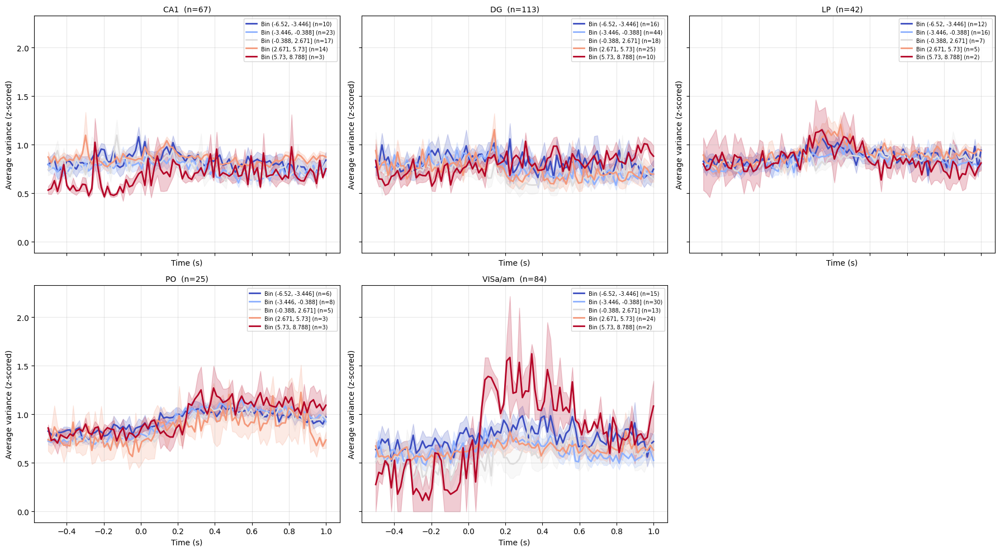

In [80]:
merged_df = filtered.merge(lda[['binned1', 'session']], on='session')
merged_df.loc[merged_df['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
merged_df.loc[merged_df['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

timestep_cols = [col for col in merged_df.columns if col not in ['session', 'binned1', 'area', 'beryl_acronym', 'pid']]

regions = merged_df['beryl_acronym'].unique()
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 5 * nrows), sharex=True, sharey=True)
axes = axes.flatten()

time_in_seconds = np.linspace(-0.5, 1.0, len(timestep_cols))

for idx, region in enumerate(sorted(regions)):
    ax = axes[idx]
    region_df = merged_df[merged_df['beryl_acronym'] == region]
    
    averaged_by_bin = region_df.groupby('binned1')[timestep_cols].mean()
    stderr_by_bin = region_df.groupby('binned1')[timestep_cols].sem()
    sorted_bins = sorted(averaged_by_bin.index)
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))
    
    # Count samples per bin for this region
    counts = region_df.groupby('binned1')['session'].count().sort_index()
    count_str = ', '.join([f'B{b}:{c}' for b, c in counts.items()])
    n_total = len(region_df)
    
    for i, bin_value in enumerate(sorted_bins):
        mean_values = averaged_by_bin.loc[bin_value]
        error_values = stderr_by_bin.loc[bin_value]
        n_bin = counts.loc[bin_value]
        ax.plot(time_in_seconds, mean_values, label=f'Bin {bin_value} (n={n_bin})',
                linewidth=2, color=colors[i])
        ax.fill_between(time_in_seconds,
                        mean_values - error_values,
                        mean_values + error_values,
                        alpha=0.2, color=colors[i])

    ax.set_title(f'{region}  (n={n_total})', fontsize=10)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Average variance (z-scored)')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=7)

# Hide unused subplots
for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

# Baseline std

In [81]:
# Extract baseline (timesteps 20-30) and average
baseline_cols = [f'time_{i}' for i in range(20, 31)]  # time_20 to time_30
post_cols = [f'time_{i}' for i in range(40, 61)]  # time_20 to time_30
summary_df['baseline'] = summary_df[baseline_cols].mean(axis=1)
summary_df['post'] = summary_df[post_cols].mean(axis=1)
summary_df['diff'] =  summary_df[post_cols].mean(axis=1) -  summary_df[baseline_cols].mean(axis=1)

## Shuffle control

/tmp/ipykernel_65183/1194757563.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')['baseline'].mean()
/tmp/ipykernel_65183/1194757563.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')['baseline'].mean()
/tmp/ipykernel_65183/1194757563.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.gro

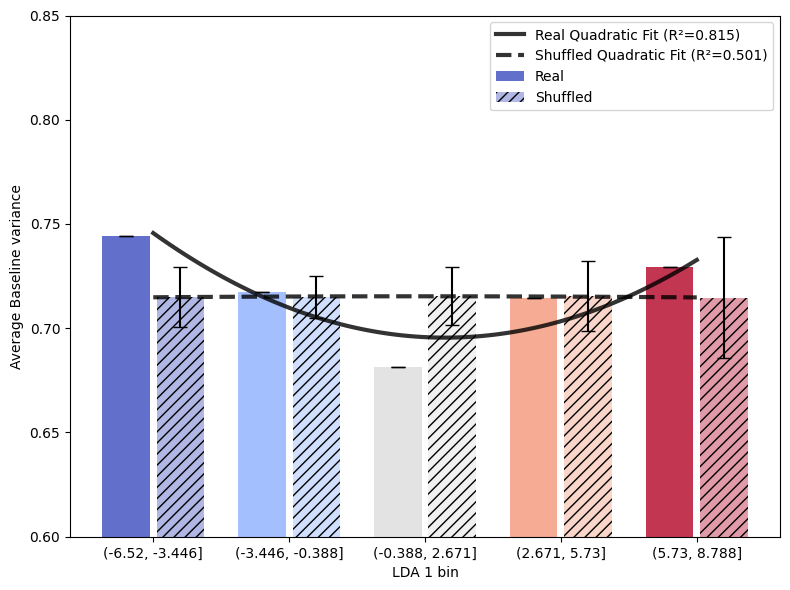

Real data quadratic fit:
y = 0.0109x² + -0.0467x + 0.7456
R² = 0.8152

Shuffled control quadratic fit:
y = -0.0001x² + 0.0005x + 0.7148
R² = 0.5012

U-shape test (positive coefficient for x²):
Real data: U-shape (coeff = 0.0109)
Shuffled: Inverted U-shape (coeff = -0.0001)


In [238]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

# Set parameters
n_shuffles = 1000
results_real = []
results_shuffled = []

# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

for i in range(n_shuffles):
    # Subsample sessions (same fraction as before, or adjust as needed)
    sampled_sessions = np.random.choice(available_sessions, 
                                       size=min(len(lda_eid), len(available_sessions)), 
                                       replace=False)
    
    # Get the subsampled data
    subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
    merged_subsample = summary_df.merge(subsample_lda[['binned1', 'session']], on='session')
    
    # Real data: calculate mean baseline per binned1 category
    real_means = merged_subsample.groupby('binned1')['baseline'].mean()
    results_real.append(real_means)
    
    # Shuffled control: shuffle binned1 labels at SESSION level
    # Get unique session-binned1 mapping
    session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
    
    # Shuffle the binned1 values while keeping sessions intact
    shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
    session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))
    
    # Apply shuffled mapping
    merged_shuffled = merged_subsample.copy()
    merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
    
    shuffled_means = merged_shuffled.groupby('binned1')['baseline'].mean()
    results_shuffled.append(shuffled_means)

# Convert to DataFrames and calculate averages
real_df = pd.DataFrame(results_real)
shuffled_df = pd.DataFrame(results_shuffled)

avg_real = real_df.mean().sort_index()
avg_shuffled = shuffled_df.mean().sort_index()

# Prepare data for quadratic fitting
binned1_categories = avg_real.index
x_numeric = np.arange(len(binned1_categories))  # Convert categories to numeric

# Fit quadratic polynomials
real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)

# Generate smooth curves for plotting
x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
real_fit = np.polyval(real_coeffs, x_smooth)
shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)

# Calculate R-squared values
real_predicted = np.polyval(real_coeffs, x_numeric)
shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
real_r2 = r2_score(avg_real.values, real_predicted)
shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)

# Reshape data for plotting with hue
plot_data = []

# Add real data
for binned1_cat in real_df.columns:
    for value in real_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            'baseline': value,
            'condition': 'Real'
        })

# Add shuffled data
for binned1_cat in shuffled_df.columns:
    for value in shuffled_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            'baseline': value,
            'condition': 'Shuffled'
        })

plot_df = pd.DataFrame(plot_data)

# Create the plot with simple coloring
plt.figure(figsize=(8, 6))

# Create separate plots for real and shuffled with different alphas
ax = plt.gca()

# Get viridis colors for each binned1 category
n_categories = len(binned1_categories)
viridis_colors = plt.cm.viridis(np.linspace(0, 1, n_categories))
viridis_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

# Plot real data (solid bars)
real_data = plot_df[plot_df['condition'] == 'Real']
for i, cat in enumerate(binned1_categories):
    cat_data = real_data[real_data['binned1'] == cat]['baseline']
    x_pos = i - 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.8, 
           width=0.35,
           label='Real' if i == 0 else "",
           capsize=5)

# Plot shuffled data (hatched bars)
shuffled_data = plot_df[plot_df['condition'] == 'Shuffled']
for i, cat in enumerate(binned1_categories):
    cat_data = shuffled_data[shuffled_data['binned1'] == cat]['baseline']
    x_pos = i + 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.4, 
           width=0.35,
           hatch='///',
           label='Shuffled' if i == 0 else "",
           capsize=5)

# Add quadratic fit lines
plt.plot(x_smooth, real_fit, 'black', linewidth=3, alpha=0.8, 
         label=f'Real Quadratic Fit (R²={real_r2:.3f})')
plt.plot(x_smooth, shuffled_fit, 'black', linewidth=3, alpha=0.8, linestyle='--',
         label=f'Shuffled Quadratic Fit (R²={shuffled_r2:.3f})')

plt.xlabel('LDA 1 bin')
plt.ylabel('Average Baseline variance')
plt.xticks(range(len(binned1_categories)), binned1_categories)
plt.legend()
plt.ylim([0.6, .85])
plt.tight_layout()
plt.show()

# Print quadratic equations and statistics
print("Real data quadratic fit:")
print(f"y = {real_coeffs[0]:.4f}x² + {real_coeffs[1]:.4f}x + {real_coeffs[2]:.4f}")
print(f"R² = {real_r2:.4f}")

print(f"\nShuffled control quadratic fit:")
print(f"y = {shuffled_coeffs[0]:.4f}x² + {shuffled_coeffs[1]:.4f}x + {shuffled_coeffs[2]:.4f}")
print(f"R² = {shuffled_r2:.4f}")

# Test for u-shape: positive second derivative means u-shape
print(f"\nU-shape test (positive coefficient for x²):")
print(f"Real data: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {real_coeffs[0]:.4f})")
print(f"Shuffled: {'U-shape' if shuffled_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {shuffled_coeffs[0]:.4f})")

## Per brain region

In [401]:
filtered.loc[filtered['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
filtered.loc[filtered['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

# Extract baseline (timesteps 20-30) and average
baseline_cols = [f'time_{i}' for i in range(20, 31)]  # time_20 to time_30
post_cols = [f'time_{i}' for i in range(40, 61)]  # time_20 to time_30
filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
filtered['post'] = filtered[post_cols].mean(axis=1)
filtered['diff'] =  filtered[post_cols].mean(axis=1) -  filtered[baseline_cols].mean(axis=1)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['post'] = filtered[post_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain 

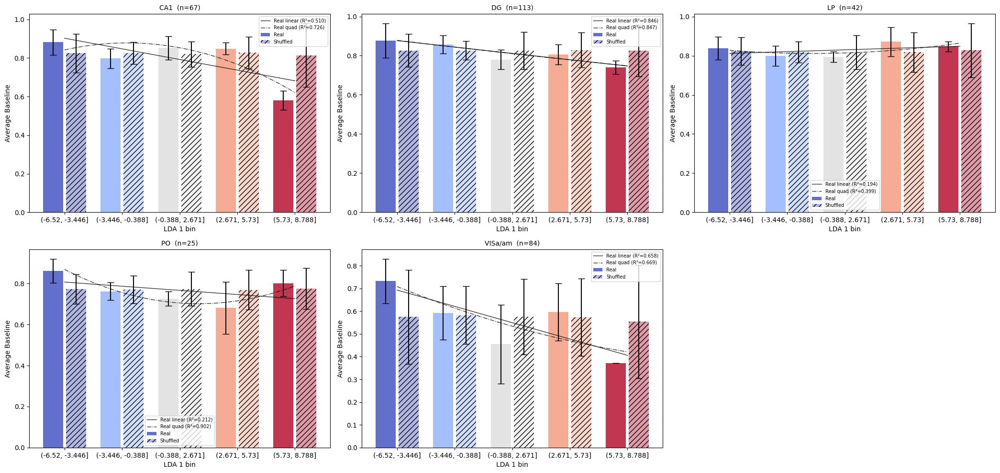

In [402]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

use_var = 'baseline'
n_shuffles = 1000
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
axes = axes.flatten()

for reg_idx, region in enumerate(regions):
    ax = axes[reg_idx]
    region_summary = filtered[filtered['beryl_acronym'] == region]

    results_real = []
    results_shuffled = []

    for i in range(n_shuffles):
        sampled_sessions = np.random.choice(available_sessions,
                                            size=int(len(available_sessions)/2),
                                            replace=False)
        subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
        merged_subsample = region_summary.merge(subsample_lda[['binned1', 'session']], on='session')

        if merged_subsample.empty:
            continue

        real_means = merged_subsample.groupby('binned1')[use_var].mean()
        results_real.append(real_means)

        session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
        shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
        session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))

        merged_shuffled = merged_subsample.copy()
        merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
        shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
        results_shuffled.append(shuffled_means)

    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    binned1_categories = avg_real.index
    x_numeric = np.arange(len(binned1_categories))

    # Quadratic fits
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    # Linear fits
    real_coeffs_lin = np.polyfit(x_numeric, avg_real.values, 1)
    shuffled_coeffs_lin = np.polyfit(x_numeric, avg_shuffled.values, 1)

    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)
    real_fit_lin = np.polyval(real_coeffs_lin, x_smooth)
    shuffled_fit_lin = np.polyval(shuffled_coeffs_lin, x_smooth)

    real_r2 = r2_score(avg_real.values, np.polyval(real_coeffs, x_numeric))
    shuffled_r2 = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs, x_numeric))
    real_r2_lin = r2_score(avg_real.values, np.polyval(real_coeffs_lin, x_numeric))
    shuffled_r2_lin = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs_lin, x_numeric))

    n_categories = len(binned1_categories)
    cmap_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Sample counts per bin
    merged_all = region_summary.merge(lda[['binned1', 'session']], on='session')
    counts = merged_all.groupby('binned1')['session'].count().sort_index()
    n_total = len(merged_all)

    # Bar plots
    for i, cat in enumerate(binned1_categories):
        # Real
        cat_data = real_df[cat].dropna()
        ax.bar(i - 0.2, cat_data.mean(), yerr=cat_data.std(),
               color=cmap_colors[i], alpha=0.8, width=0.35,
               label='Real' if i == 0 else "", capsize=5)
        # Shuffled
        cat_data_s = shuffled_df[cat].dropna()
        ax.bar(i + 0.2, cat_data_s.mean(), yerr=cat_data_s.std(),
               color=cmap_colors[i], alpha=0.4, width=0.35, hatch='///',
               label='Shuffled' if i == 0 else "", capsize=5)
        
    ax.plot(x_smooth, real_fit_lin, 'black', linewidth=1, alpha=0.8,
            label=f'Real linear (R²={real_r2_lin:.3f})')
    ax.plot(x_smooth, real_fit, 'black', linewidth=1, alpha=0.8, linestyle='-.',
            label=f'Real quad (R²={real_r2:.3f})')
    # ax.plot(x_smooth, shuffled_fit_lin, 'gray', linewidth=1, alpha=0.8, linestyle='--',
    #         label=f'Shuf linear (R²={shuffled_r2_lin:.3f})')
    # ax.plot(x_smooth, shuffled_fit, 'gray', linewidth=1, alpha=0.8, linestyle=':',
    #         label=f'Shuf quad (R²={shuffled_r2:.3f})')

    count_str = ', '.join([f'B{b}:{c}' for b, c in counts.items()])
    ax.set_title(f'{region}  (n={n_total})', fontsize=10)
    # ax.set_title(f'{region}  (n={n_total})\n{count_str}', fontsize=10)
    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel(f'Average {use_var.capitalize()}')
    ax.set_xticks(range(len(binned1_categories)))
    ax.set_xticklabels(binned1_categories)
    ax.legend(fontsize=7)

for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

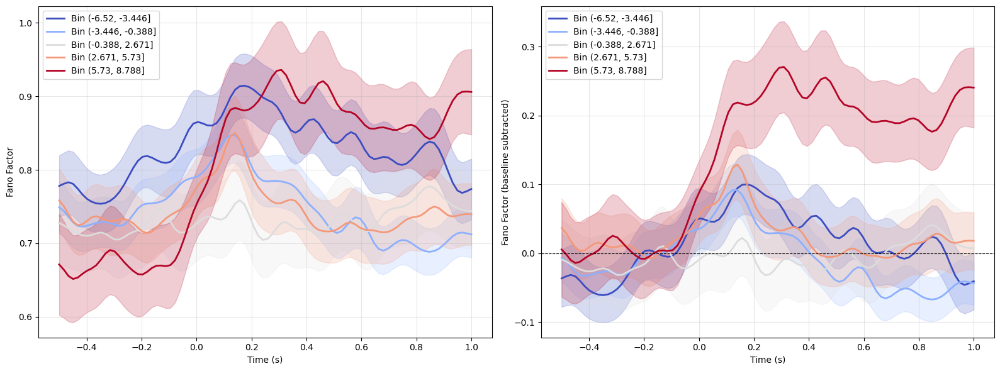

In [ ]:
from scipy.ndimage import gaussian_filter1d

sigma = 2

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Baseline window mask
baseline_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= -0.1)

for i, bin_value in enumerate(sorted_bins):
    mean_values = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
    error_values = gaussian_filter1d(stderr_by_bin.loc[bin_value].values, sigma=sigma)

    # Original
    axes[0].plot(time_in_seconds, mean_values,
                 label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    axes[0].fill_between(time_in_seconds,
                         mean_values - error_values,
                         mean_values + error_values,
                         alpha=0.2, color=colors[i])

    # Baseline-subtracted
    baseline = np.mean(mean_values[baseline_mask])
    axes[1].plot(time_in_seconds, mean_values - baseline,
                 label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    axes[1].fill_between(time_in_seconds,
                         (mean_values - baseline) - error_values,
                         (mean_values - baseline) + error_values,
                         alpha=0.2, color=colors[i])

for ax in axes:
    ax.set_xlabel('Time (s)')
    ax.legend()
    ax.grid(True, alpha=0.3)

axes[0].set_ylabel('Trial variance')
axes[1].set_ylabel('Trial variance (baseline subtracted)')
axes[1].axhline(0, color='k', linewidth=0.8, linestyle='--')

fig.tight_layout()
plt.show()

## Various bin sizes

In [241]:
min(len(lda_eid), len(available_sessions))

245


Processing 3 bins...


/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (3 bins):
y = 0.0414x² + -0.0960x + 0.7433
R² = 1.0000
Shuffled control quadratic fit (3 bins):
y = 0.0015x² + -0.0017x + 0.7149
R² = 1.0000
U-shape test (3 bins):
Real data: U-shape (coeff = 0.0414)
Shuffled: U-shape (coeff = 0.0015)

Processing 5 bins...


/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (5 bins):
y = 0.0113x² + -0.0473x + 0.7444
R² = 0.8507
Shuffled control quadratic fit (5 bins):
y = 0.0006x² + -0.0028x + 0.7167
R² = 0.9903
U-shape test (5 bins):
Real data: U-shape (coeff = 0.0113)
Shuffled: U-shape (coeff = 0.0006)

Processing 7 bins...


/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/3874196342.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (7 bins):
y = 0.0081x² + -0.0519x + 0.7733
R² = 0.9034
Shuffled control quadratic fit (7 bins):
y = -0.0001x² + 0.0011x + 0.7137
R² = 0.5150
U-shape test (7 bins):
Real data: U-shape (coeff = 0.0081)
Shuffled: Inverted U-shape (coeff = -0.0001)


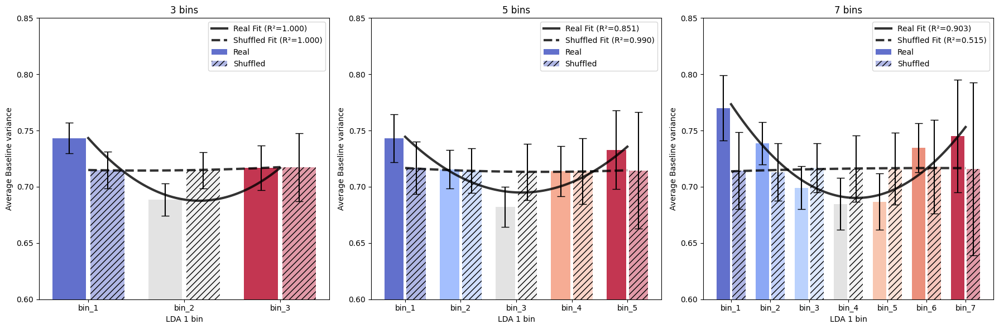


SUMMARY COMPARISON ACROSS BIN NUMBERS

3 bins:
  Real R² = 1.0000, Quadratic coeff = 0.0414
  Shuffled R² = 1.0000, Quadratic coeff = 0.0015
  Real shape: U-shape

5 bins:
  Real R² = 0.8507, Quadratic coeff = 0.0113
  Shuffled R² = 0.9903, Quadratic coeff = 0.0006
  Real shape: U-shape

7 bins:
  Real R² = 0.9034, Quadratic coeff = 0.0081
  Shuffled R² = 0.5150, Quadratic coeff = -0.0001
  Real shape: U-shape


In [244]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

# Set parameters
n_shuffles = 500
use_var = 'baseline'
bin_numbers = [3, 5, 7]

# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

# Create subplots for each bin number
fig, axes = plt.subplots(1, len(bin_numbers), figsize=(6 * len(bin_numbers), 6))
if len(bin_numbers) == 1:
    axes = [axes]

all_results = {}
sample_size = 100
for bin_idx, n_bins in enumerate(bin_numbers):
    print(f"\nProcessing {n_bins} bins...")
    
    # Create bins for this iteration
    lda_with_bins = lda.copy()
    lda_with_bins[f'binned_{n_bins}'] = pd.cut(lda_with_bins[0], 
                                               bins=n_bins, 
                                               labels=[f'bin_{i+1}' for i in range(n_bins)])
    
    results_real = []
    results_shuffled = []
    
    for i in range(n_shuffles):
        # Subsample sessions
        sampled_sessions = np.random.choice(available_sessions, 
                                           size=sample_size, 
                                           replace=False)
        
        # Get the subsampled data
        subsample_lda = lda_with_bins.loc[lda_with_bins['session'].isin(sampled_sessions)]
        merged_subsample = summary_df.merge(subsample_lda[[f'binned_{n_bins}', 'session']], on='session')
        
        # Real data: calculate mean baseline per binned category
        real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
        results_real.append(real_means)
        
        # Shuffled control: shuffle binned labels at SESSION level
        session_binned = merged_subsample[['session', f'binned_{n_bins}']].drop_duplicates()
        
        # Shuffle the binned values while keeping sessions intact
        shuffled_binned = np.random.permutation(session_binned[f'binned_{n_bins}'].values)
        session_shuffle_map = dict(zip(session_binned['session'], shuffled_binned))
        
        # Apply shuffled mapping
        merged_shuffled = merged_subsample.copy()
        merged_shuffled[f'binned_{n_bins}'] = merged_shuffled['session'].map(session_shuffle_map)
        
        shuffled_means = merged_shuffled.groupby(f'binned_{n_bins}')[use_var].mean()
        results_shuffled.append(shuffled_means)

    # Convert to DataFrames and calculate averages
    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    # Store results for summary
    all_results[n_bins] = {
        'real_df': real_df,
        'shuffled_df': shuffled_df,
        'avg_real': avg_real,
        'avg_shuffled': avg_shuffled
    }

    # Prepare data for quadratic fitting
    binned_categories = avg_real.index
    x_numeric = np.arange(len(binned_categories))  # Convert categories to numeric

    # Fit quadratic polynomials
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)

    # Generate smooth curves for plotting
    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)

    # Calculate R-squared values
    real_predicted = np.polyval(real_coeffs, x_numeric)
    shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
    real_r2 = r2_score(avg_real.values, real_predicted)
    shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)

    # Plot for this bin number
    ax = axes[bin_idx]
    
    # Get colors for each category
    n_categories = len(binned_categories)
    colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Plot real data (solid bars)
    for i, cat in enumerate(binned_categories):
        cat_data = real_df[cat]
        x_pos = i - 0.2  # Offset for side-by-side bars
        ax.bar(x_pos, cat_data.mean(), 
               yerr=cat_data.std(),
               color=colors[i], 
               alpha=0.8, 
               width=0.35,
               label='Real' if i == 0 else "",
               capsize=5)

    # Plot shuffled data (hatched bars)
    for i, cat in enumerate(binned_categories):
        cat_data = shuffled_df[cat]
        x_pos = i + 0.2  # Offset for side-by-side bars
        ax.bar(x_pos, cat_data.mean(), 
               yerr=cat_data.std(),
               color=colors[i], 
               alpha=0.4, 
               width=0.35,
               hatch='///',
               label='Shuffled' if i == 0 else "",
               capsize=5)

    # Add quadratic fit lines
    ax.plot(x_smooth, real_fit, 'black', linewidth=3, alpha=0.8, 
            label=f'Real Fit (R²={real_r2:.3f})')
    ax.plot(x_smooth, shuffled_fit, 'black', linewidth=3, alpha=0.8, linestyle='--',
            label=f'Shuffled Fit (R²={shuffled_r2:.3f})')

    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel('Average Baseline variance')
    ax.set_xticks(range(len(binned_categories)))
    ax.set_xticklabels(binned_categories)
    ax.legend()
    ax.set_ylim([0.6, .85])
    ax.set_title(f'{n_bins} bins')

    # Print results for this bin number
    print(f"Real data quadratic fit ({n_bins} bins):")
    print(f"y = {real_coeffs[0]:.4f}x² + {real_coeffs[1]:.4f}x + {real_coeffs[2]:.4f}")
    print(f"R² = {real_r2:.4f}")

    print(f"Shuffled control quadratic fit ({n_bins} bins):")
    print(f"y = {shuffled_coeffs[0]:.4f}x² + {shuffled_coeffs[1]:.4f}x + {shuffled_coeffs[2]:.4f}")
    print(f"R² = {shuffled_r2:.4f}")

    print(f"U-shape test ({n_bins} bins):")
    print(f"Real data: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {real_coeffs[0]:.4f})")
    print(f"Shuffled: {'U-shape' if shuffled_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {shuffled_coeffs[0]:.4f})")

plt.tight_layout()
plt.show()

# Summary comparison across bin numbers
print("\n" + "="*50)
print("SUMMARY COMPARISON ACROSS BIN NUMBERS")
print("="*50)

for n_bins in bin_numbers:
    real_df = all_results[n_bins]['real_df']
    shuffled_df = all_results[n_bins]['shuffled_df']
    avg_real = all_results[n_bins]['avg_real']
    avg_shuffled = all_results[n_bins]['avg_shuffled']
    
    # Recalculate coefficients for summary
    x_numeric = np.arange(len(avg_real))
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    
    real_predicted = np.polyval(real_coeffs, x_numeric)
    shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
    real_r2 = r2_score(avg_real.values, real_predicted)
    shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)
    
    print(f"\n{n_bins} bins:")
    print(f"  Real R² = {real_r2:.4f}, Quadratic coeff = {real_coeffs[0]:.4f}")
    print(f"  Shuffled R² = {shuffled_r2:.4f}, Quadratic coeff = {shuffled_coeffs[0]:.4f}")
    print(f"  Real shape: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'}")

## Fano factor

In [372]:
summary_df = pd.DataFrame()

for filepath in filepaths:
    try:
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
        state_with_spikes = state_with_spikes.loc[(state_with_spikes['Bin']> state_with_spikes['Bin'].min()+600) & 
                                                  (state_with_spikes['Bin']< state_with_spikes['Bin'].min()+900)]
        pid = list(state_with_spikes['session_pid'])[0]
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]
        
        spike_columns = [col for col in new_df.columns if '_spike_count' in col]
        area_names = np.unique([col.split('_neuron_')[0] for col in spike_columns])
        events = np.array(new_df['goCueTrigger_times'].unique())

        # 1. Compute PSTH per area
        # We store them in a temporary structure
        all_session_data = pd.DataFrame()
        area_data = []
        for area in area_names:
            area_cols = [c for c in spike_columns if area in c]
            # Get PSTH for ALL neurons in this area at once (Trials, Time, Neurons)
            # Assuming get_psth returns: (n_trials, n_time_bins)
            area_psths = [get_psth(new_df, col, events, pre=.5, post=1) for col in area_cols]
            area_psths = np.stack(area_psths, axis=-1) 
            # 2. Compute Statistics ACROSS TRIALS (axis=0)
            # mean_across_trials: (n_time_bins, n_neurons)
            mean_across_trials = area_psths.mean(axis=0)
            # var_across_trials: (n_time_bins, n_neurons)
            var_across_trials = area_psths.var(axis=0)
            # 3. Calculate Fano Factor: Variance / Mean
            # Add small epsilon to avoid division by zero
            fano_factor_matrix = var_across_trials / (mean_across_trials + 1e-6)
            # 4. Average across neurons to get (n_time_bins) for this session
            mean_session_ff = fano_factor_matrix.mean(axis=1)
            
            area_data.append(mean_session_ff)

        # Convert to DataFrame where each row is an area and columns are timesteps
        all_session_data = pd.DataFrame(area_data, 
                            columns=[f'time_{i}' for i in range(len(mean_session_sync))])
        all_session_data['area'] = area_names
        all_session_data['pid'] = pid
        all_session_data['session'] = session_name

        summary_df = pd.concat([summary_df, all_session_data], ignore_index=True)
        
        print(pid)      
    except Exception as e:
        print(f"Error: {e}")


KeyboardInterrupt: 

In [ ]:
# save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
# summary_df.to_pickle(save_path+'psths_fanofactor')

In [500]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')
lda = lda.rename(columns={0: 'lda_1'})

In [507]:
import sys
# If you're on NumPy 1.x, loading a pickle from NumPy 2.x:
sys.modules['numpy._core'] = np.core
sys.modules['numpy._core.numeric'] = np.core.numeric

save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
summary_df = pd.read_pickle(save_path+'psths_fanofactor')

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4235854582.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4235854582.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean


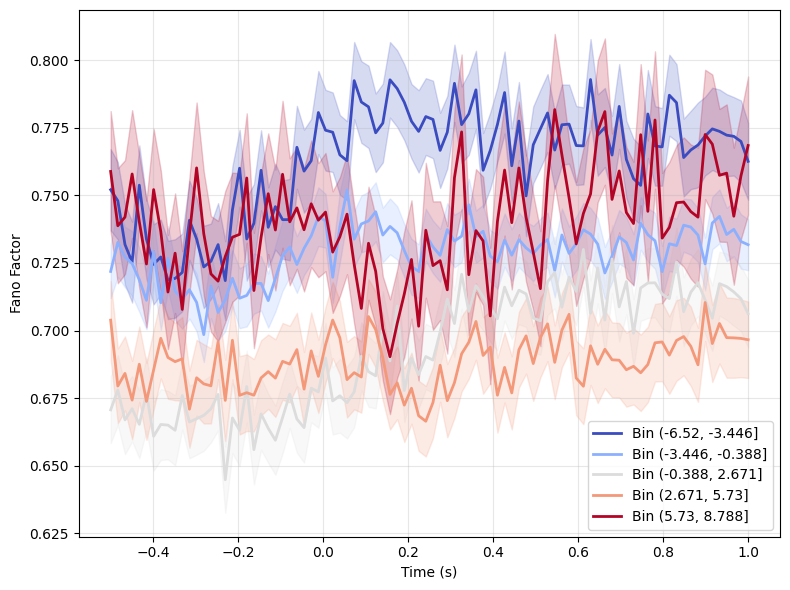

Number of sessions per bin:
binned1
(-6.52, -3.446]      556
(-3.446, -0.388]    1073
(-0.388, 2.671]      645
(2.671, 5.73]        502
(5.73, 8.788]        219
Name: session, dtype: int64


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4235854582.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(merged_df.groupby('binned1')['session'].count().sort_index())


In [508]:
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions

filtered = summary_df.loc[summary_df['area'].isin(BRAIN_REGIONS)]
# filtered = summary_df.copy()
merged_df = filtered.merge(lda[['binned1', 'session']], on='session')
merged_df = summary_df.merge(lda[['binned1', 'session']], on='session')

# Assuming your timestep data is in columns (if not, we may need to reshape)
# Get the column names that represent timesteps (excluding metadata columns)
timestep_cols = [col for col in merged_df.columns if col not in ['session', 'binned1', 'area', 'pid']]

# Group by binned1 and calculate mean and standard error across sessions for each timestep
averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean

# Sort bins by their values
sorted_bins = sorted(averaged_by_bin.index)

# Create gradient color palette
colors = plt.cm.viridis(np.linspace(0, 1, len(sorted_bins)))
colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))

# Create the plot
plt.figure(figsize=(8, 6))
x_values = range(len(timestep_cols))

time_in_seconds = np.linspace(-0.5, 1.0, len(timestep_cols))

# Plot each bin as a separate line with error bands
for i, bin_value in enumerate(sorted_bins):
    mean_values = averaged_by_bin.loc[bin_value]
    error_values = stderr_by_bin.loc[bin_value]
    
    # Plot the main line
    plt.plot(time_in_seconds, mean_values, 
             label=f'Bin {bin_value}', 
             linewidth=2,
             color=colors[i])
    
    # Add error bands (mean ± standard error)
    plt.fill_between(time_in_seconds,
                     mean_values - error_values,
                     mean_values + error_values,
                     alpha=0.2,
                     color=colors[i])
    
plt.xlabel('Time (s)')
plt.ylabel('Fano Factor')
# plt.title('Average Time Series by Binned1 Groups (with Standard Error)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
# Optional: Display summary statistics
print("Number of sessions per bin:")
print(merged_df.groupby('binned1')['session'].count().sort_index())

### Smoothed and derivative

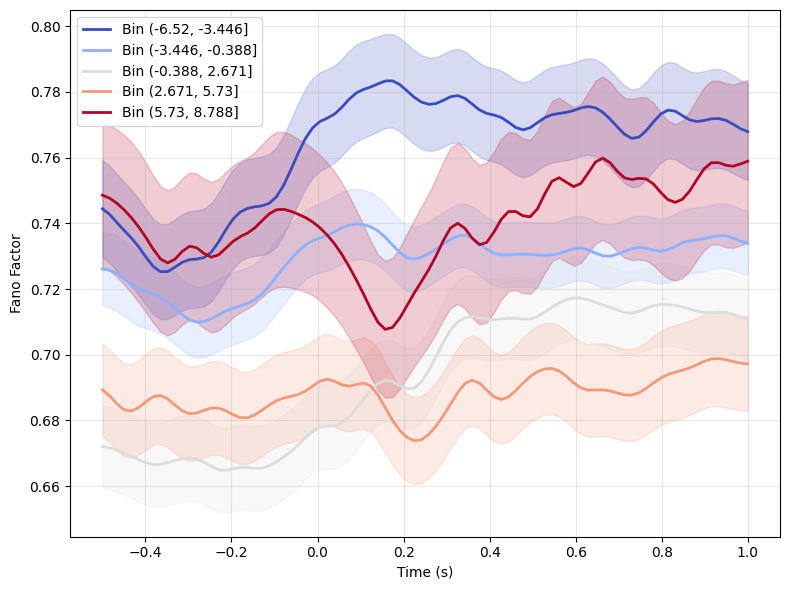

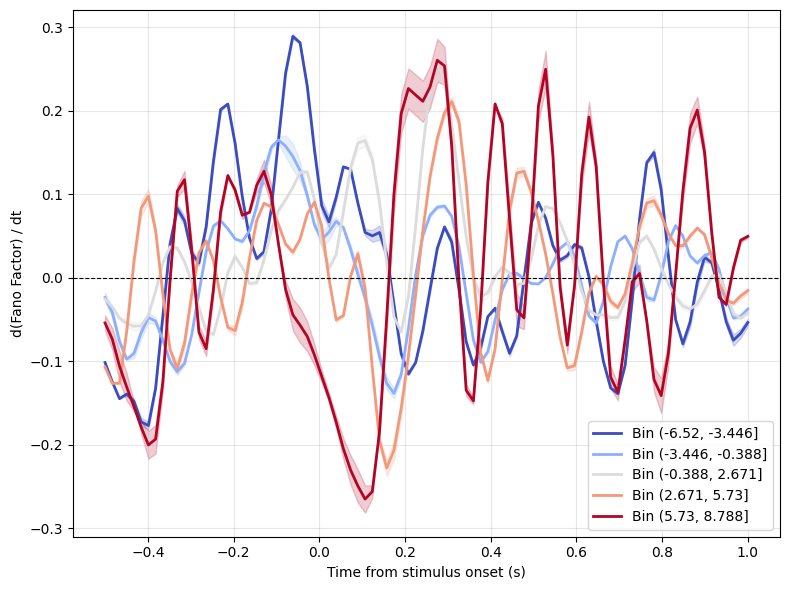

In [510]:
from scipy.ndimage import gaussian_filter1d

sigma = 2  # adjust for more/less smoothing

fig, ax = plt.subplots(figsize=(8, 6))

for i, bin_value in enumerate(sorted_bins):
    mean_values = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
    error_values = gaussian_filter1d(stderr_by_bin.loc[bin_value].values, sigma=sigma)

    ax.plot(time_in_seconds, mean_values,
            label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    ax.fill_between(time_in_seconds,
                    mean_values - error_values,
                    mean_values + error_values,
                    alpha=0.2, color=colors[i])

ax.set_xlabel('Time (s)')
ax.set_ylabel('Fano Factor')
ax.legend()
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()

dt = time_in_seconds[1] - time_in_seconds[0]
fig, ax = plt.subplots(figsize=(8, 6))

for i, bin_value in enumerate(sorted_bins):
    smoothed_mean = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
    smoothed_upper = gaussian_filter1d((averaged_by_bin.loc[bin_value] + stderr_by_bin.loc[bin_value]).values, sigma=sigma)
    smoothed_lower = gaussian_filter1d((averaged_by_bin.loc[bin_value] - stderr_by_bin.loc[bin_value]).values, sigma=sigma)

    deriv_mean = np.gradient(smoothed_mean, dt)
    deriv_upper = np.gradient(smoothed_upper, dt)
    deriv_lower = np.gradient(smoothed_lower, dt)

    ax.plot(time_in_seconds, deriv_mean,
            label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    ax.fill_between(time_in_seconds, deriv_lower, deriv_upper,
                    alpha=0.2, color=colors[i])

ax.axhline(0, color='k', linewidth=0.8, linestyle='--')
ax.set_xlabel('Time from stimulus onset (s)')
ax.set_ylabel('d(Fano Factor) / dt')
ax.legend()
ax.grid(True, alpha=0.3)
fig.tight_layout()
plt.show()

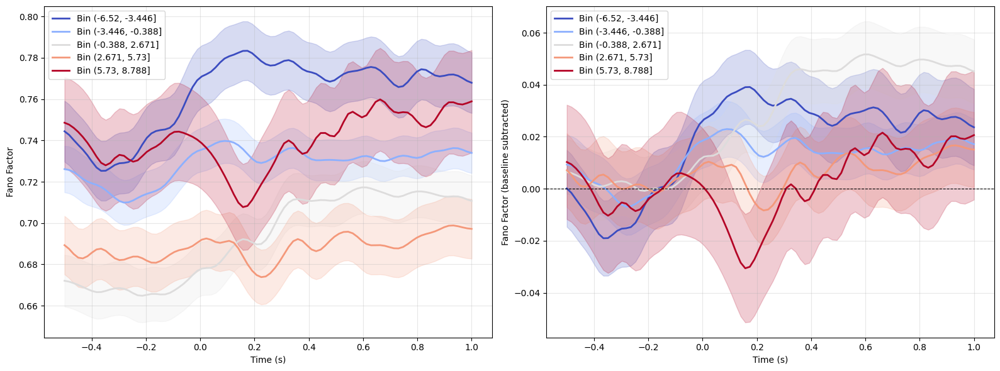

In [511]:
from scipy.ndimage import gaussian_filter1d

sigma = 2

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Baseline window mask
baseline_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= -0.1)

for i, bin_value in enumerate(sorted_bins):
    mean_values = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
    error_values = gaussian_filter1d(stderr_by_bin.loc[bin_value].values, sigma=sigma)

    # Original
    axes[0].plot(time_in_seconds, mean_values,
                 label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    axes[0].fill_between(time_in_seconds,
                         mean_values - error_values,
                         mean_values + error_values,
                         alpha=0.2, color=colors[i])

    # Baseline-subtracted
    baseline = np.mean(mean_values[baseline_mask])
    axes[1].plot(time_in_seconds, mean_values - baseline,
                 label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    axes[1].fill_between(time_in_seconds,
                         (mean_values - baseline) - error_values,
                         (mean_values - baseline) + error_values,
                         alpha=0.2, color=colors[i])

for ax in axes:
    ax.set_xlabel('Time (s)')
    ax.legend()
    ax.grid(True, alpha=0.3)

axes[0].set_ylabel('Fano Factor')
axes[1].set_ylabel('Fano Factor (baseline subtracted)')
axes[1].axhline(0, color='k', linewidth=0.8, linestyle='--')

fig.tight_layout()
plt.show()

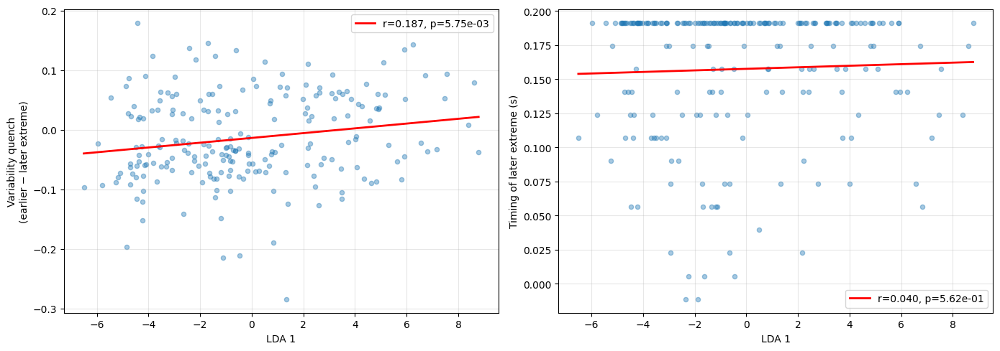

N sessions: 217


In [512]:
from scipy.stats import linregress

sigma = 3
t_mask = (time_in_seconds >= -0.1) & (time_in_seconds <= 0.2)
t_window = time_in_seconds[t_mask]

# Average timesteps per session first
session_avg = merged_df.groupby('session')[timestep_cols].mean()

quench_list = []

for session, row in session_avg.iterrows():
    ts = gaussian_filter1d(row.values.astype(float), sigma=sigma)
    ts_win = ts[t_mask]

    i_max = np.argmax(ts_win)
    i_min = np.argmin(ts_win)
    t_max, t_min = t_window[i_max], t_window[i_min]
    v_max, v_min = ts_win[i_max], ts_win[i_min]

    if t_max < t_min:
        earlier_val, later_val = v_max, v_min
        later_time = t_min
    else:
        earlier_val, later_val = v_min, v_max
        later_time = t_max

    quench_list.append({
        'session': session,
        'quench': earlier_val - later_val,
        'later_time': later_time,
    })

quench_df = pd.DataFrame(quench_list)
quench_df = quench_df.merge(lda[['session', 'lda_1']], on='session')

# --- Regression plots ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

x_fit = np.linspace(quench_df['lda_1'].min(), quench_df['lda_1'].max(), 100)

# 1) Quench vs lda_1
x, y = quench_df['lda_1'].values, quench_df['quench'].values
slope, intercept, r, p, se = linregress(x, y)
axes[0].scatter(x, y, alpha=0.4, s=20)
axes[0].plot(x_fit, slope * x_fit + intercept, 'r', linewidth=2,
             label=f'r={r:.3f}, p={p:.2e}')
axes[0].set_xlabel('LDA 1')
axes[0].set_ylabel('Variability quench\n(earlier − later extreme)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 2) Timing of later extreme vs lda_1
x, y = quench_df['lda_1'].values, quench_df['later_time'].values
slope, intercept, r, p, se = linregress(x, y)
axes[1].scatter(x, y, alpha=0.4, s=20)
axes[1].plot(x_fit, slope * x_fit + intercept, 'r', linewidth=2,
             label=f'r={r:.3f}, p={p:.2e}')
axes[1].set_xlabel('LDA 1')
axes[1].set_ylabel('Timing of later extreme (s)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

fig.tight_layout()
plt.show()

print(f"N sessions: {len(quench_df)}")

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge

MODEL 1: Variability quench ~ lda_1 + area | (1|session)
              Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     quench  
No. Observations:     2995        Method:                 REML    
No. Groups:           217         Scale:                  0.0397  
Min. group size:      2           Log-Likelihood:         166.8959
Max. group size:      32          Converged:              No      
Mean group size:      13.8                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.155    0.116  1.331 0.183 -0.073  0.382
C(area)[T.ACAd2/3]      -0.203    0.232 -0.876 0.381 -0.658  0.252
C(area)[T.ACAd5]        -0.476    0.183 -2.592 0.010 -0.835 -0.116
C(area)[T.ACAd6a]       -0.122    0.134 -0.906 0.365 -0.384  0.141
C(area)[T.ACAv2/3]  

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge


MODEL 2: Later extreme timing ~ lda_1 + area | (1|session)
              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    later_time
No. Observations:     2995       Method:                REML      
No. Groups:           217        Scale:                 0.0066    
Min. group size:      2          Log-Likelihood:        2454.2320 
Max. group size:      32         Converged:             No        
Mean group size:      13.8                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.056    0.047  1.185 0.236 -0.036  0.148
C(area)[T.ACAd2/3]       0.086    0.094  0.917 0.359 -0.098  0.271
C(area)[T.ACAd5]         0.104    0.074  1.398 0.162 -0.042  0.250
C(area)[T.ACAd6a]        0.088    0.054  1.613 0.107 -0.019  0.194
C(area)[T.ACAv2/3

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/736356314.py:78: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  fig.tight_layout()


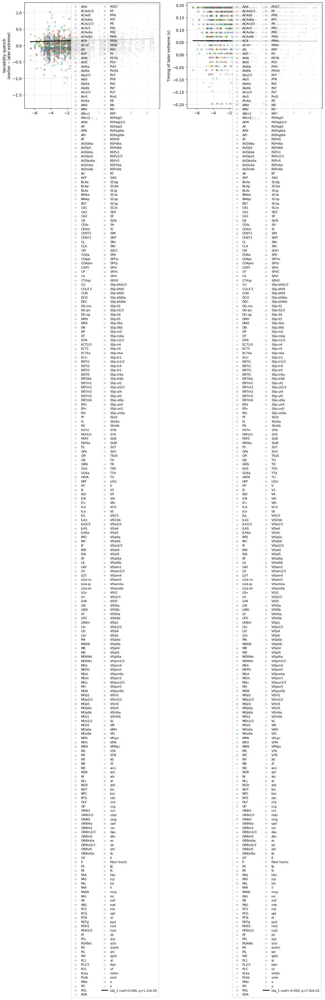

In [486]:
import statsmodels.formula.api as smf

sigma = 3
t_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= 0.2)
t_window = time_in_seconds[t_mask]

# Compute quench per session × area (no averaging across areas)
quench_list = []

for idx, row in merged_df.iterrows():
    ts = gaussian_filter1d(row[timestep_cols].values.astype(float), sigma=sigma)
    ts_win = ts[t_mask]

    i_max = np.argmax(ts_win)
    i_min = np.argmin(ts_win)
    t_max, t_min = t_window[i_max], t_window[i_min]
    v_max, v_min = ts_win[i_max], ts_win[i_min]

    if t_max < t_min:
        earlier_val, later_val = v_max, v_min
        later_time = t_min
    else:
        earlier_val, later_val = v_min, v_max
        later_time = t_max

    quench_list.append({
        'session': row['session'],
        'area': row['area'],
        'quench': earlier_val - later_val,
        'later_time': later_time,
    })

quench_df = pd.DataFrame(quench_list)
quench_df = quench_df.merge(lda[['session', 'lda_1']], on='session')

# --- Linear Mixed Models: random intercept per session ---
# 1) Quench ~ lda_1 + area
md_quench = smf.mixedlm("quench ~ lda_1 + C(area)", quench_df, groups=quench_df["session"])
mdf_quench = md_quench.fit()
print("=" * 60)
print("MODEL 1: Variability quench ~ lda_1 + area | (1|session)")
print("=" * 60)
print(mdf_quench.summary())

# 2) Timing ~ lda_1 + area
md_timing = smf.mixedlm("later_time ~ lda_1 + C(area)", quench_df, groups=quench_df["session"])
mdf_timing = md_timing.fit()
print("\n" + "=" * 60)
print("MODEL 2: Later extreme timing ~ lda_1 + area | (1|session)")
print("=" * 60)
print(mdf_timing.summary())

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, dv, model, ylabel in zip(
    axes,
    ['quench', 'later_time'],
    [mdf_quench, mdf_timing],
    ['Variability quench\n(earlier − later extreme)', 'Timing of later extreme (s)']
):
    for area, grp in quench_df.groupby('area'):
        ax.scatter(grp['lda_1'], grp[dv], alpha=0.3, s=15, label=area)

    # Overall lda_1 effect line (at reference area level)
    x_fit = np.linspace(quench_df['lda_1'].min(), quench_df['lda_1'].max(), 100)
    intercept = model.fe_params['Intercept']
    slope = model.fe_params['lda_1']
    p_val = model.pvalues['lda_1']
    ax.plot(x_fit, intercept + slope * x_fit, 'k', linewidth=2,
            label=f'lda_1 coef={slope:.3f}, p={p_val:.2e}')

    ax.set_xlabel('LDA 1')
    ax.set_ylabel(ylabel)
    ax.legend(fontsize=8, ncol=2)
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()

TypeError: agg function failed [how->mean,dtype->object]

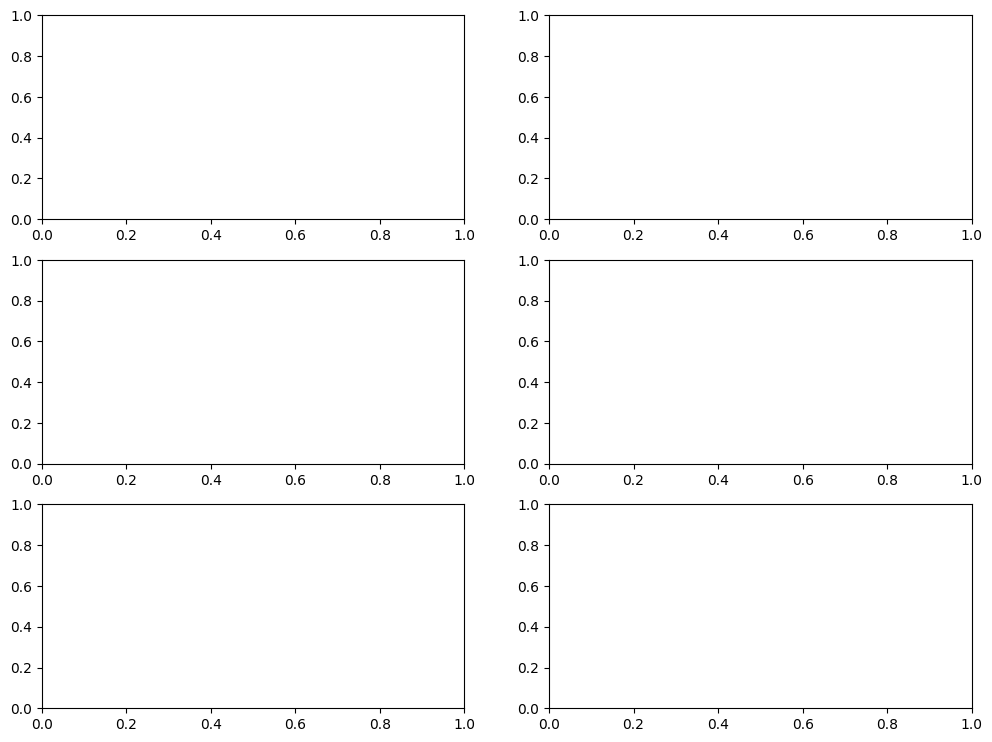

In [505]:
from scipy.ndimage import gaussian_filter1d

sigma = 2
bin_counts = [3, 5, 7]

# summary_df = filtered.copy()
# Merge lda_1 (raw score) instead of pre-binned column
merged_df = summary_df.merge(lda[['lda_1', 'session']], on='session')
# merged_df = filtered.merge(lda[['lda_1', 'session']], on='session')
timestep_cols = [col for col in merged_df.columns if col not in ['session', 'lda_1', 'area', 'pid']]
baseline_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= -0.1)

fig, axes = plt.subplots(len(bin_counts), 2, figsize=(12, 3 * len(bin_counts)))

for row, n_bins in enumerate(bin_counts):
    # Bin lda_1 into n_bins
    merged_df['binned'] = pd.cut(merged_df['lda_1'], bins=n_bins, labels=False) + 1

    averaged_by_bin = merged_df.groupby('binned')[timestep_cols].mean()
    stderr_by_bin = merged_df.groupby('binned')[timestep_cols].sem()
    sorted_bins = sorted(averaged_by_bin.index)

    colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))

    for i, bin_value in enumerate(sorted_bins):
        mean_values = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
        error_values = gaussian_filter1d(stderr_by_bin.loc[bin_value].values, sigma=sigma)

        # Original
        axes[row, 0].plot(time_in_seconds, mean_values,
                          label=f'Bin {bin_value}', linewidth=2, color=colors[i])
        axes[row, 0].fill_between(time_in_seconds,
                                  mean_values - error_values,
                                  mean_values + error_values,
                                  alpha=0.2, color=colors[i])

        # Baseline-subtracted
        baseline = np.mean(mean_values[baseline_mask])
        axes[row, 1].plot(time_in_seconds, mean_values - baseline,
                          label=f'Bin {bin_value}', linewidth=2, color=colors[i])
        axes[row, 1].fill_between(time_in_seconds,
                                  (mean_values - baseline) - error_values,
                                  (mean_values - baseline) + error_values,
                                  alpha=0.2, color=colors[i])

    for col in range(2):
        axes[row, col].set_xlabel('Time (s)')
        axes[row, col].legend()
        axes[row, col].grid(True, alpha=0.3)

    axes[row, 0].set_ylabel(f'Fano Factor\n({n_bins} bins)')
    axes[row, 1].set_ylabel(f'Baseline sub.\n({n_bins} bins)')
    axes[row, 1].axhline(0, color='k', linewidth=0.8, linestyle='--')

    # Print counts per bin
    print(f"\n{n_bins} bins — sessions per bin:")
    print(merged_df.groupby('binned')['session'].count().sort_index())

merged_df.drop(columns='binned', inplace=True)
fig.tight_layout()
plt.show()

## Per brain region

In [502]:
regions = BrainRegions()
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']

summary_df = summary_df.dropna(subset=['area']).copy()

# Acronyms → Allen IDs → Beryl IDs → Beryl acronyms
allen_ids = regions.acronym2id(summary_df['area'].values)
beryl_ids = regions.remap(allen_ids, source_map='Allen', target_map='Beryl')
summary_df['beryl_acronym'] = regions.id2acronym(beryl_ids)

filtered = summary_df[summary_df['beryl_acronym'].isin(BRAIN_REGIONS)]

In [503]:
filtered.loc[filtered['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
filtered.loc[filtered['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

# Extract baseline (timesteps 20-30) and average
baseline_cols = [f'time_{i}' for i in range(20, 31)]  # time_20 to time_30
post_cols = [f'time_{i}' for i in range(40, 61)]  # time_20 to time_30
filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
filtered['post'] = filtered[post_cols].mean(axis=1)
filtered['diff'] =  filtered[post_cols].mean(axis=1) -  filtered[baseline_cols].mean(axis=1)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['post'] = filtered[post_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/3020351532.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averaged_by_bin = region_df.groupby('binned1')[timestep_cols].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/3020351532.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stderr_by_bin = region_df.groupby('binned1')[timestep_cols].sem()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/3020351532.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to re

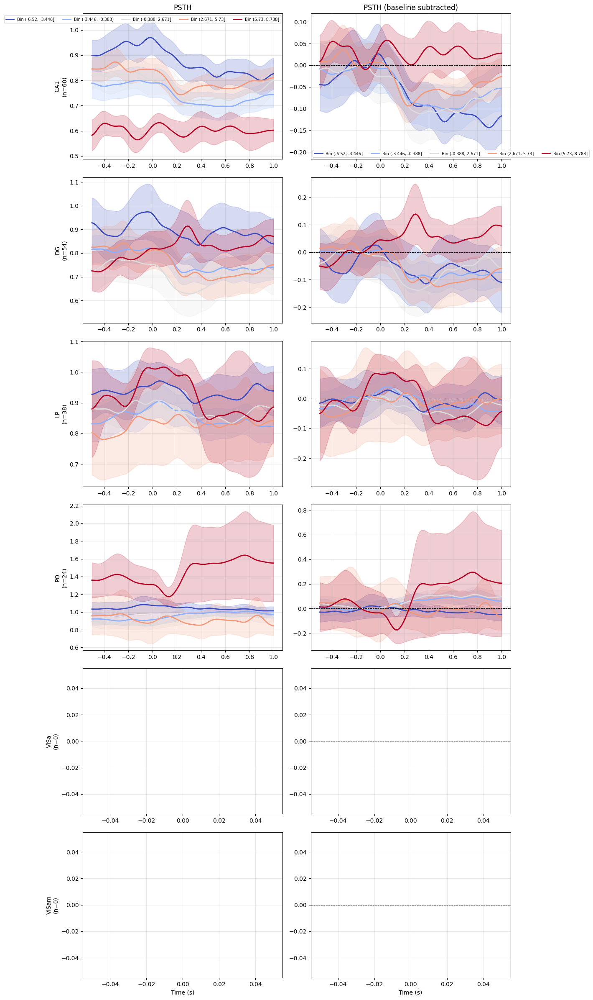

In [496]:
from scipy.ndimage import gaussian_filter1d

sigma = 3
baseline_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= -0.1)

merged_filt = filtered.merge(lda[['session', 'lda_1', 'binned1']], on='session')

n_regions = len(BRAIN_REGIONS)
fig, axes = plt.subplots(n_regions, 2, figsize=(14, 4 * n_regions))

for row, region in enumerate(sorted(BRAIN_REGIONS)):
    region_df = merged_filt[merged_filt['beryl_acronym'] == region]

    averaged_by_bin = region_df.groupby('binned1')[timestep_cols].mean()
    stderr_by_bin = region_df.groupby('binned1')[timestep_cols].sem()
    sorted_bins = sorted(averaged_by_bin.index)
    colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))

    for i, bin_value in enumerate(sorted_bins):
        mean_values = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
        error_values = gaussian_filter1d(stderr_by_bin.loc[bin_value].values, sigma=sigma)

        # Raw
        axes[row, 0].plot(time_in_seconds, mean_values,
                          label=f'Bin {bin_value}', linewidth=2, color=colors[i])
        axes[row, 0].fill_between(time_in_seconds,
                                  mean_values - error_values,
                                  mean_values + error_values,
                                  alpha=0.2, color=colors[i])

        # Baseline-subtracted
        baseline = np.mean(mean_values[baseline_mask])
        axes[row, 1].plot(time_in_seconds, mean_values - baseline,
                          label=f'Bin {bin_value}', linewidth=2, color=colors[i])
        axes[row, 1].fill_between(time_in_seconds,
                                  (mean_values - baseline) - error_values,
                                  (mean_values - baseline) + error_values,
                                  alpha=0.2, color=colors[i])

    n_sess = region_df['session'].nunique()
    axes[row, 0].set_ylabel(f'{region}\n(n={n_sess})')
    axes[row, 1].axhline(0, color='k', linewidth=0.8, linestyle='--')

    for col in range(2):
        axes[row, col].grid(True, alpha=0.3)
        if row == 0:
            axes[row, col].legend(fontsize=7, ncol=len(sorted_bins))

axes[0, 0].set_title('PSTH')
axes[0, 1].set_title('PSTH (baseline subtracted)')
for col in range(2):
    axes[-1, col].set_xlabel('Time (s)')

fig.tight_layout()
plt.show()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain 

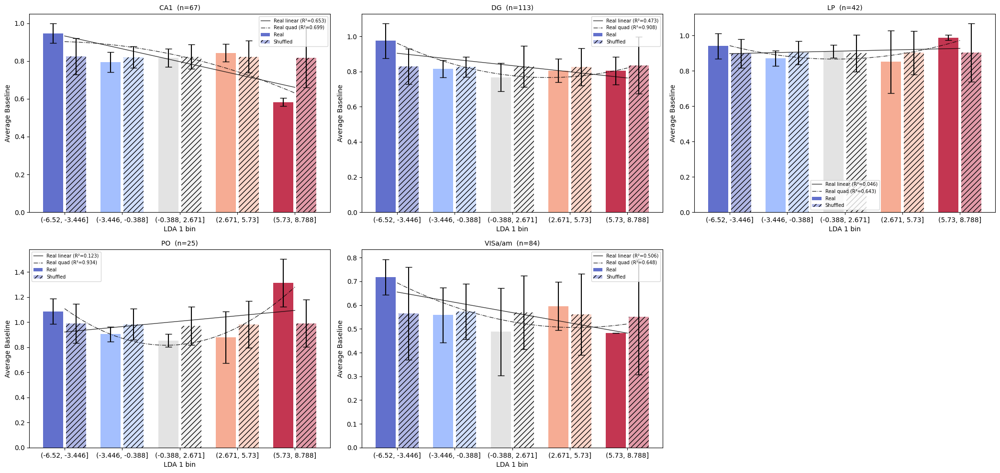

In [359]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

use_var = 'baseline'
n_shuffles = 1000
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
axes = axes.flatten()

for reg_idx, region in enumerate(regions):
    ax = axes[reg_idx]
    region_summary = filtered[filtered['beryl_acronym'] == region]

    results_real = []
    results_shuffled = []

    for i in range(n_shuffles):
        sampled_sessions = np.random.choice(available_sessions,
                                            size=int(len(available_sessions)/2),
                                            replace=False)
        subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
        merged_subsample = region_summary.merge(subsample_lda[['binned1', 'session']], on='session')

        if merged_subsample.empty:
            continue

        real_means = merged_subsample.groupby('binned1')[use_var].mean()
        results_real.append(real_means)

        session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
        shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
        session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))

        merged_shuffled = merged_subsample.copy()
        merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
        shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
        results_shuffled.append(shuffled_means)

    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    binned1_categories = avg_real.index
    x_numeric = np.arange(len(binned1_categories))

    # Quadratic fits
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    # Linear fits
    real_coeffs_lin = np.polyfit(x_numeric, avg_real.values, 1)
    shuffled_coeffs_lin = np.polyfit(x_numeric, avg_shuffled.values, 1)

    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)
    real_fit_lin = np.polyval(real_coeffs_lin, x_smooth)
    shuffled_fit_lin = np.polyval(shuffled_coeffs_lin, x_smooth)

    real_r2 = r2_score(avg_real.values, np.polyval(real_coeffs, x_numeric))
    shuffled_r2 = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs, x_numeric))
    real_r2_lin = r2_score(avg_real.values, np.polyval(real_coeffs_lin, x_numeric))
    shuffled_r2_lin = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs_lin, x_numeric))

    n_categories = len(binned1_categories)
    cmap_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Sample counts per bin
    merged_all = region_summary.merge(lda[['binned1', 'session']], on='session')
    counts = merged_all.groupby('binned1')['session'].count().sort_index()
    n_total = len(merged_all)

    # Bar plots
    for i, cat in enumerate(binned1_categories):
        # Real
        cat_data = real_df[cat].dropna()
        ax.bar(i - 0.2, cat_data.mean(), yerr=cat_data.std(),
               color=cmap_colors[i], alpha=0.8, width=0.35,
               label='Real' if i == 0 else "", capsize=5)
        # Shuffled
        cat_data_s = shuffled_df[cat].dropna()
        ax.bar(i + 0.2, cat_data_s.mean(), yerr=cat_data_s.std(),
               color=cmap_colors[i], alpha=0.4, width=0.35, hatch='///',
               label='Shuffled' if i == 0 else "", capsize=5)
        
    ax.plot(x_smooth, real_fit_lin, 'black', linewidth=1, alpha=0.8,
            label=f'Real linear (R²={real_r2_lin:.3f})')
    ax.plot(x_smooth, real_fit, 'black', linewidth=1, alpha=0.8, linestyle='-.',
            label=f'Real quad (R²={real_r2:.3f})')
    # ax.plot(x_smooth, shuffled_fit_lin, 'gray', linewidth=1, alpha=0.8, linestyle='--',
    #         label=f'Shuf linear (R²={shuffled_r2_lin:.3f})')
    # ax.plot(x_smooth, shuffled_fit, 'gray', linewidth=1, alpha=0.8, linestyle=':',
    #         label=f'Shuf quad (R²={shuffled_r2:.3f})')

    count_str = ', '.join([f'B{b}:{c}' for b, c in counts.items()])
    ax.set_title(f'{region}  (n={n_total})', fontsize=10)
    # ax.set_title(f'{region}  (n={n_total})\n{count_str}', fontsize=10)
    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel(f'Average {use_var.capitalize()}')
    ax.set_xticks(range(len(binned1_categories)))
    ax.set_xticklabels(binned1_categories)
    ax.legend(fontsize=7)

for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

# Model comparison between linear and quadratic

In [360]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')
lda = lda.rename(columns={0: 'lda_1'})

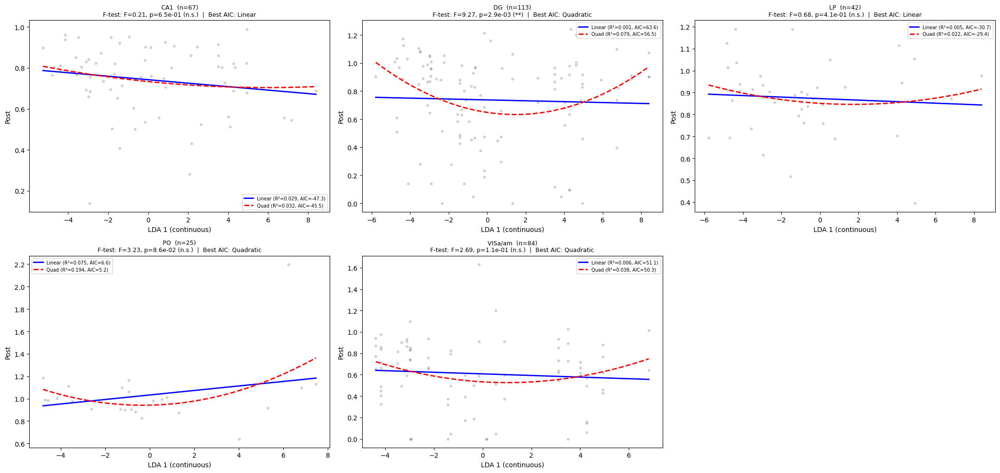

,region,n,adj_r2_linear,adj_r2_quadratic,aic_linear,aic_quadratic,aic_winner,bic_winner,f_stat,f_pval,f_test_sig
1,DG,113,-0.007670,0.062166,63.609173,56.470560,Quadratic,Quadratic,9.265613,0.002921,True
3,PO,25,0.035289,0.120676,6.619746,5.191563,Quadratic,Quadratic,3.233432,0.085887,False
4,VISa/am,84,-0.006096,0.014171,51.070178,50.330068,Quadratic,Linear,2.685816,0.105124,False
2,LP,42,-0.019481,-0.027715,-30.712451,-29.437958,Linear,Linear,0.679537,0.414759,False
0,CA1,67,0.013830,0.001645,-47.332459,-45.548460,Linear,Linear,0.206663,0.650934,False


In [363]:
import statsmodels.api as sm
from scipy import stats

use_var = 'post'
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
axes = axes.flatten()

comparison_results = []

for reg_idx, region in enumerate(regions):
    ax = axes[reg_idx]
    region_summary = filtered[filtered['beryl_acronym'] == region]

    # Merge with continuous lda_1
    merged = region_summary.merge(lda[['lda_1', 'session']], on='session')

    if merged.empty or len(merged) < 5:
        ax.set_visible(False)
        continue

    x = merged['lda_1'].values
    y = merged[use_var].values

    # --- Fit linear model ---
    X_lin = sm.add_constant(x)
    model_lin = sm.OLS(y, X_lin).fit()

    # --- Fit quadratic model ---
    X_quad = sm.add_constant(np.column_stack([x, x**2]))
    model_quad = sm.OLS(y, X_quad).fit()

    # --- F-test for nested models (linear vs quadratic) ---
    rss_lin = model_lin.ssr
    rss_quad = model_quad.ssr
    df_lin = model_lin.df_resid
    df_quad = model_quad.df_resid
    p_extra = df_lin - df_quad  # number of extra parameters (should be 1)
    f_stat = ((rss_lin - rss_quad) / p_extra) / (rss_quad / df_quad)
    f_pval = 1 - stats.f.cdf(f_stat, p_extra, df_quad)

    # Store results
    comparison_results.append({
        'region': region,
        'n': len(merged),
        'r2_linear': model_lin.rsquared,
        'r2_quadratic': model_quad.rsquared,
        'adj_r2_linear': model_lin.rsquared_adj,
        'adj_r2_quadratic': model_quad.rsquared_adj,
        'aic_linear': model_lin.aic,
        'aic_quadratic': model_quad.aic,
        'bic_linear': model_lin.bic,
        'bic_quadratic': model_quad.bic,
        'f_stat': f_stat,
        'f_pval': f_pval,
        'linear_slope_pval': model_lin.pvalues[1],
        'quad_term_pval': model_quad.pvalues[2],
    })

    # --- Plot ---
    ax.scatter(x, y, alpha=0.3, s=10, color='gray', zorder=1)

    x_smooth = np.linspace(x.min(), x.max(), 200)
    y_lin = model_lin.predict(sm.add_constant(x_smooth))
    y_quad = model_quad.predict(sm.add_constant(np.column_stack([x_smooth, x_smooth**2])))

    ax.plot(x_smooth, y_lin, 'blue', linewidth=2,
            label=f'Linear (R²={model_lin.rsquared:.3f}, AIC={model_lin.aic:.1f})')
    ax.plot(x_smooth, y_quad, 'red', linewidth=2, linestyle='--',
            label=f'Quad (R²={model_quad.rsquared:.3f}, AIC={model_quad.aic:.1f})')

    winner = 'Quadratic' if model_quad.aic < model_lin.aic else 'Linear'
    sig_str = '***' if f_pval < 0.001 else '**' if f_pval < 0.01 else '*' if f_pval < 0.05 else 'n.s.'

    ax.set_title(f'{region}  (n={len(merged)})\n'
                 f'F-test: F={f_stat:.2f}, p={f_pval:.1e} ({sig_str})  |  Best AIC: {winner}',
                 fontsize=9)
    ax.set_xlabel('LDA 1 (continuous)')
    ax.set_ylabel(f'{use_var.capitalize()}')
    ax.legend(fontsize=7)

for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

# --- Summary table ---
comp_df = pd.DataFrame(comparison_results)
comp_df['aic_winner'] = np.where(comp_df['aic_quadratic'] < comp_df['aic_linear'], 'Quadratic', 'Linear')
comp_df['bic_winner'] = np.where(comp_df['bic_quadratic'] < comp_df['bic_linear'], 'Quadratic', 'Linear')
comp_df['f_test_sig'] = comp_df['f_pval'] < 0.05
comp_df = comp_df.sort_values('f_pval')
display(comp_df[['region', 'n', 'adj_r2_linear', 'adj_r2_quadratic',
                  'aic_linear', 'aic_quadratic', 'aic_winner',
                  'bic_winner', 'f_stat', 'f_pval', 'f_test_sig']])

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge

MODEL 1: Variability quench ~ lda_1 + beryl_acronym | (1|session)
                Mixed Linear Model Regression Results
Model:                  MixedLM      Dependent Variable:      quench  
No. Observations:       331          Method:                  REML    
No. Groups:             84           Scale:                   0.0780  
Min. group size:        1            Log-Likelihood:          -72.0387
Max. group size:        15           Converged:               No      
Mean group size:        3.9                                           
----------------------------------------------------------------------
                            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------
Intercept                    0.108    0.036  2.968 0.003  0.037  0.179
C(beryl_acronym)[T.DG]       0.027    0.044  0.617 0.537 -0.059  0.113
C(beryl_acronym)[T.LP]      -0.107    0.056 -1.915 0.055 -0.217  0.003
C(beryl_acronym)[T.PO]      

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)



MODEL 2: Later extreme timing ~ lda_1 + beryl_acronym | (1|session)
                Mixed Linear Model Regression Results
Model:                  MixedLM     Dependent Variable:     later_time
No. Observations:       331         Method:                 REML      
No. Groups:             84          Scale:                  0.0128    
Min. group size:        1           Log-Likelihood:         230.0414  
Max. group size:        15          Converged:              Yes       
Mean group size:        3.9                                           
----------------------------------------------------------------------
                            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------
Intercept                    0.219    0.014 15.625 0.000  0.191  0.246
C(beryl_acronym)[T.DG]      -0.038    0.018 -2.147 0.032 -0.072 -0.003
C(beryl_acronym)[T.LP]      -0.036    0.022 -1.611 0.107 -0.080  0.008
C(beryl_acronym)[T.PO]   

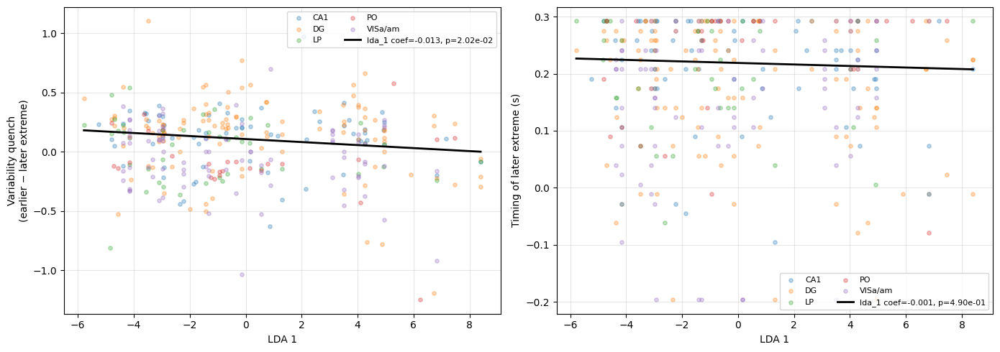


N observations: 331, N sessions: 84
Observations per region:
beryl_acronym
CA1         67
DG         113
LP          42
PO          25
VISa/am     84
Name: count, dtype: int64


In [491]:
import statsmodels.formula.api as smf

sigma = 2
t_mask = (time_in_seconds >= -0.2) & (time_in_seconds <= 0.3)
t_window = time_in_seconds[t_mask]

# Use filtered df with beryl_acronym
merged_filt = filtered.merge(lda[['session', 'lda_1']], on='session')

quench_list = []

for idx, row in merged_filt.iterrows():
    ts = gaussian_filter1d(row[timestep_cols].values.astype(float), sigma=sigma)
    ts_win = ts[t_mask]

    i_max = np.argmax(ts_win)
    i_min = np.argmin(ts_win)
    t_max, t_min = t_window[i_max], t_window[i_min]
    v_max, v_min = ts_win[i_max], ts_win[i_min]

    if t_max < t_min:
        earlier_val, later_val = v_max, v_min
        later_time = t_min
    else:
        earlier_val, later_val = v_min, v_max
        later_time = t_max

    quench_list.append({
        'session': row['session'],
        'beryl_acronym': row['beryl_acronym'],
        'quench': earlier_val - later_val,
        'later_time': later_time,
    })

quench_df = pd.DataFrame(quench_list)
quench_df = quench_df.merge(lda[['session', 'lda_1']], on='session')

# --- Linear Mixed Models: region as fixed effect, session as random intercept ---
md_quench = smf.mixedlm("quench ~ lda_1 + C(beryl_acronym)", quench_df, groups=quench_df["session"])
mdf_quench = md_quench.fit()
print("=" * 60)
print("MODEL 1: Variability quench ~ lda_1 + beryl_acronym | (1|session)")
print("=" * 60)
print(mdf_quench.summary())

md_timing = smf.mixedlm("later_time ~ lda_1 + C(beryl_acronym)", quench_df, groups=quench_df["session"])
mdf_timing = md_timing.fit()
print("\n" + "=" * 60)
print("MODEL 2: Later extreme timing ~ lda_1 + beryl_acronym | (1|session)")
print("=" * 60)
print(mdf_timing.summary())

# --- Visualization ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, dv, model, ylabel in zip(
    axes,
    ['quench', 'later_time'],
    [mdf_quench, mdf_timing],
    ['Variability quench\n(earlier − later extreme)', 'Timing of later extreme (s)']
):
    for region, grp in quench_df.groupby('beryl_acronym'):
        ax.scatter(grp['lda_1'], grp[dv], alpha=0.3, s=15, label=region)

    x_fit = np.linspace(quench_df['lda_1'].min(), quench_df['lda_1'].max(), 100)
    intercept = model.fe_params['Intercept']
    slope = model.fe_params['lda_1']
    p_val = model.pvalues['lda_1']
    ax.plot(x_fit, intercept + slope * x_fit, 'k', linewidth=2,
            label=f'lda_1 coef={slope:.3f}, p={p_val:.2e}')

    ax.set_xlabel('LDA 1')
    ax.set_ylabel(ylabel)
    ax.legend(fontsize=8, ncol=2)
    ax.grid(True, alpha=0.3)

fig.tight_layout()
plt.show()

print(f"\nN observations: {len(quench_df)}, N sessions: {quench_df['session'].nunique()}")
print("Observations per region:")
print(quench_df['beryl_acronym'].value_counts().sort_index())

In [492]:
from scipy import stats as sp_stats

# Standardize lda_1 for better convergence
quench_df['lda_1_z'] = sp_stats.zscore(quench_df['lda_1'])
quench_df['quench_z'] = sp_stats.zscore(quench_df['quench'])
quench_df['later_time_z'] = sp_stats.zscore(quench_df['later_time'])

# Model with z-scored predictors + more iterations
md_quench = smf.mixedlm("quench_z ~ lda_1_z + C(beryl_acronym)", quench_df,
                          groups=quench_df["session"])
mdf_quench = md_quench.fit(method='lbfgs', maxiter=1000)
print(mdf_quench.summary())

md_timing = smf.mixedlm("later_time_z ~ lda_1_z + C(beryl_acronym)", quench_df,
                          groups=quench_df["session"])
mdf_timing = md_timing.fit(method='lbfgs', maxiter=1000)
print(mdf_timing.summary())

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2055: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2246: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positiv

                        Mixed Linear Model Regression Results
Model:                        MixedLM           Dependent Variable:           quench_z
No. Observations:             331               Method:                       REML    
No. Groups:                   84                Scale:                        0.5837  
Min. group size:              1                 Log-Likelihood:               inf     
Max. group size:              15                Converged:                    Yes     
Mean group size:              3.9                                                     
--------------------------------------------------------------------------------------
                            Coef.    Std.Err.    z    P>|z|     [0.025       0.975]   
--------------------------------------------------------------------------------------
Intercept                   -0.000 8859080.649 -0.000 1.000 -17363479.008 17363479.008
C(beryl_acronym)[T.DG]       0.178       0.137  1.295 0.195        -

/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2246: UserWarning: The random effects covariance matrix is singular.
  warnings.warn(_warn_cov_sing)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2706: RuntimeWarning: invalid value encountered in sqrt
  sdf[0:self.k_fe, 1] = np.sqrt(np.diag(self.cov_params()[0:self.k_fe]))


### PLS to predict LDA 1 from FF psth

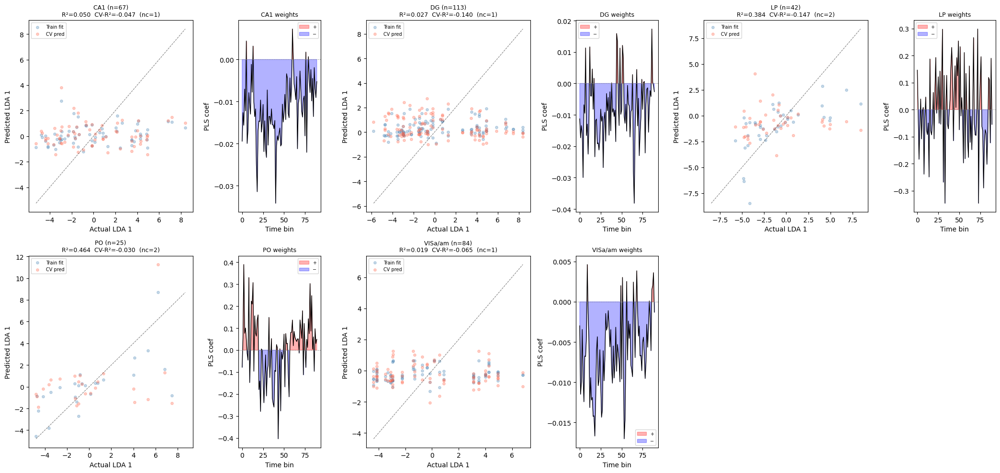

,region,n,best_n_components,r2_full,r2_cv
3,PO,25,2,0.464058,-0.030143
0,CA1,67,1,0.049833,-0.047300
4,VISa/am,84,1,0.018510,-0.065423
1,DG,113,1,0.026701,-0.139831
2,LP,42,2,0.383892,-0.147382


In [327]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
import warnings

time_cols = [f'time_{i}' for i in range(90)]
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

n_cv_folds = 5
max_components = 10  # search up to this many PLS components

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(7 * ncols, 5 * nrows),
                         gridspec_kw={'width_ratios': [2, 1] * ncols})

pls_results = []

for reg_idx, region in enumerate(regions):
    ax_pred = axes.flatten()[(reg_idx % ncols) * 2 + (reg_idx // ncols) * ncols * 2]
    ax_wt   = axes.flatten()[(reg_idx % ncols) * 2 + 1 + (reg_idx // ncols) * ncols * 2]

    region_summary = filtered[filtered['beryl_acronym'] == region]
    merged = region_summary.merge(lda[['lda_1', 'session']], on='session')

    if merged.empty or len(merged) < max_components + 2:
        ax_pred.set_visible(False)
        ax_wt.set_visible(False)
        continue

    X = merged[time_cols].values
    y = merged['lda_1'].values

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Select n_components via CV ---
    kf = KFold(n_splits=n_cv_folds, shuffle=True, random_state=42)
    best_nc, best_r2_cv = 1, -np.inf

    cv_scores = []
    for nc in range(1, min(max_components + 1, X_scaled.shape[1], X_scaled.shape[0] // n_cv_folds)):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            y_cv = cross_val_predict(PLSRegression(n_components=nc, scale=False),
                                     X_scaled, y, cv=kf)
        r2_cv = r2_score(y, y_cv)
        cv_scores.append((nc, r2_cv))
        if r2_cv > best_r2_cv:
            best_r2_cv = r2_cv
            best_nc = nc

    # --- Fit final model with best n_components ---
    pls = PLSRegression(n_components=best_nc, scale=False)
    pls.fit(X_scaled, y)
    y_fit = pls.predict(X_scaled).ravel()
    r2_full = r2_score(y, y_fit)

    y_cv_best = cross_val_predict(PLSRegression(n_components=best_nc, scale=False),
                                  X_scaled, y, cv=kf)
    r2_cv_best = r2_score(y, y_cv_best)

    # PLS weights (first component for visualization, full model weights)
    weights = pls.coef_.ravel()  # regression coefficients over time bins

    pls_results.append({
        'region': region,
        'n': len(merged),
        'best_n_components': best_nc,
        'r2_full': r2_full,
        'r2_cv': r2_cv_best,
        'weights': weights,
        'cv_scores': cv_scores,
    })

    # --- Left panel: predicted vs actual ---
    ax_pred.scatter(y, y_fit, alpha=0.3, s=15, color='steelblue', label='Train fit')
    ax_pred.scatter(y, y_cv_best, alpha=0.3, s=15, color='tomato', label='CV pred')
    lims = [min(y.min(), y_fit.min()), max(y.max(), y_fit.max())]
    ax_pred.plot(lims, lims, 'k--', linewidth=0.8, alpha=0.5)
    ax_pred.set_xlabel('Actual LDA 1')
    ax_pred.set_ylabel('Predicted LDA 1')
    ax_pred.set_title(f'{region} (n={len(merged)})\n'
                      f'R²={r2_full:.3f}  CV-R²={r2_cv_best:.3f}  (nc={best_nc})',
                      fontsize=9)
    ax_pred.legend(fontsize=7)

    # --- Right panel: PLS regression weights over time ---
    ax_wt.plot(np.arange(len(time_cols)), weights, color='black', linewidth=1)
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights > 0, color='red', label='+')
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights < 0, color='blue', label='−')
    ax_wt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    ax_wt.set_xlabel('Time bin')
    ax_wt.set_ylabel('PLS coef')
    ax_wt.set_title(f'{region} weights', fontsize=9)
    ax_wt.legend(fontsize=7)

for idx in range(len(regions) * 2, len(axes.flatten())):
    axes.flatten()[idx].set_visible(False)

fig.tight_layout()
plt.show()

# --- Summary table ---
pls_df = pd.DataFrame([{k: v for k, v in r.items() if k not in ['weights', 'cv_scores']}
                        for r in pls_results])
pls_df = pls_df.sort_values('r2_cv', ascending=False)
display(pls_df)

# next

In [229]:
# Extract baseline (timesteps 20-30) and average
baseline_cols = [f'time_{i}' for i in range(20, 31)]  # time_20 to time_30
post_cols = [f'time_{i}' for i in range(40, 61)]  # time_20 to time_30
summary_df['baseline'] = summary_df[baseline_cols].mean(axis=1)
summary_df['post'] = summary_df[post_cols].mean(axis=1)
summary_df['diff'] =  summary_df[post_cols].mean(axis=1) -  summary_df[baseline_cols].mean(axis=1)

/tmp/ipykernel_65183/2662853990.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/tmp/ipykernel_65183/2662853990.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/tmp/ipykernel_65183/2662853990.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('

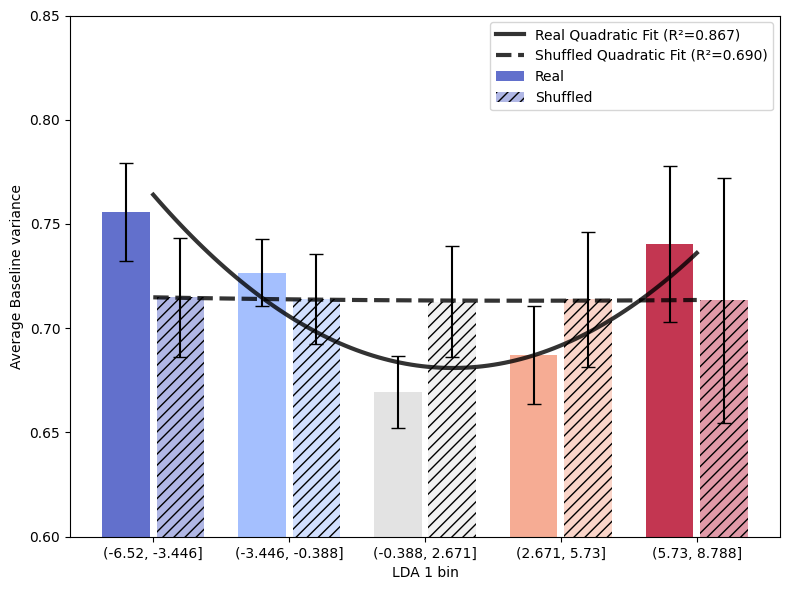

Real data quadratic fit:
y = 0.0171x² + -0.0754x + 0.7640
R² = 0.8672

Shuffled control quadratic fit:
y = 0.0002x² + -0.0012x + 0.7148
R² = 0.6902

U-shape test (positive coefficient for x²):
Real data: U-shape (coeff = 0.0171)
Shuffled: U-shape (coeff = 0.0002)


In [231]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

# Set parameters
n_shuffles = 1000
results_real = []
results_shuffled = []
use_var = 'baseline'
# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

for i in range(n_shuffles):
    # Subsample sessions (same fraction as before, or adjust as needed)
    sampled_sessions = np.random.choice(available_sessions, 
                                       size=min(len(lda_eid), len(available_sessions)), 
                                       replace=False)
    
    # Get the subsampled data
    subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
    merged_subsample = summary_df.merge(subsample_lda[['binned1', 'session']], on='session')
    
    # Real data: calculate mean baseline per binned1 category
    real_means = merged_subsample.groupby('binned1')[use_var].mean()
    results_real.append(real_means)
    
    # Shuffled control: shuffle binned1 labels at SESSION level
    # Get unique session-binned1 mapping
    session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
    
    # Shuffle the binned1 values while keeping sessions intact
    shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
    session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))
    
    # Apply shuffled mapping
    merged_shuffled = merged_subsample.copy()
    merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
    
    shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
    results_shuffled.append(shuffled_means)

# Convert to DataFrames and calculate averages
real_df = pd.DataFrame(results_real)
shuffled_df = pd.DataFrame(results_shuffled)

avg_real = real_df.mean().sort_index()
avg_shuffled = shuffled_df.mean().sort_index()

# Prepare data for quadratic fitting
binned1_categories = avg_real.index
x_numeric = np.arange(len(binned1_categories))  # Convert categories to numeric

# Fit quadratic polynomials
real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)

# Generate smooth curves for plotting
x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
real_fit = np.polyval(real_coeffs, x_smooth)
shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)

# Calculate R-squared values
real_predicted = np.polyval(real_coeffs, x_numeric)
shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
real_r2 = r2_score(avg_real.values, real_predicted)
shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)

# Reshape data for plotting with hue
plot_data = []

# Add real data
for binned1_cat in real_df.columns:
    for value in real_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            use_var: value,
            'condition': 'Real'
        })

# Add shuffled data
for binned1_cat in shuffled_df.columns:
    for value in shuffled_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            use_var: value,
            'condition': 'Shuffled'
        })

plot_df = pd.DataFrame(plot_data)

# Create the plot with simple coloring
plt.figure(figsize=(8, 6))

# Create separate plots for real and shuffled with different alphas
ax = plt.gca()

# Get viridis colors for each binned1 category
n_categories = len(binned1_categories)
viridis_colors = plt.cm.viridis(np.linspace(0, 1, n_categories))
viridis_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

# Plot real data (solid bars)
real_data = plot_df[plot_df['condition'] == 'Real']
for i, cat in enumerate(binned1_categories):
    cat_data = real_data[real_data['binned1'] == cat][use_var]
    x_pos = i - 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.8, 
           width=0.35,
           label='Real' if i == 0 else "",
           capsize=5)

# Plot shuffled data (hatched bars)
shuffled_data = plot_df[plot_df['condition'] == 'Shuffled']
for i, cat in enumerate(binned1_categories):
    cat_data = shuffled_data[shuffled_data['binned1'] == cat][use_var]
    x_pos = i + 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.4, 
           width=0.35,
           hatch='///',
           label='Shuffled' if i == 0 else "",
           capsize=5)

# Add quadratic fit lines
plt.plot(x_smooth, real_fit, 'black', linewidth=3, alpha=0.8, 
         label=f'Real Quadratic Fit (R²={real_r2:.3f})')
plt.plot(x_smooth, shuffled_fit, 'black', linewidth=3, alpha=0.8, linestyle='--',
         label=f'Shuffled Quadratic Fit (R²={shuffled_r2:.3f})')

plt.xlabel('LDA 1 bin')
plt.ylabel('Average Baseline variance')
plt.xticks(range(len(binned1_categories)), binned1_categories)
plt.legend()
plt.ylim([0.6, .85])
plt.tight_layout()
plt.show()

# Print quadratic equations and statistics
print("Real data quadratic fit:")
print(f"y = {real_coeffs[0]:.4f}x² + {real_coeffs[1]:.4f}x + {real_coeffs[2]:.4f}")
print(f"R² = {real_r2:.4f}")

print(f"\nShuffled control quadratic fit:")
print(f"y = {shuffled_coeffs[0]:.4f}x² + {shuffled_coeffs[1]:.4f}x + {shuffled_coeffs[2]:.4f}")
print(f"R² = {shuffled_r2:.4f}")

# Test for u-shape: positive second derivative means u-shape
print(f"\nU-shape test (positive coefficient for x²):")
print(f"Real data: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {real_coeffs[0]:.4f})")
print(f"Shuffled: {'U-shape' if shuffled_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {shuffled_coeffs[0]:.4f})")

## Per brain region

In [ ]:
filtered.loc[filtered['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
filtered.loc[filtered['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

# Extract baseline (timesteps 20-30) and average
baseline_cols = [f'time_{i}' for i in range(20, 31)]  # time_20 to time_30
post_cols = [f'time_{i}' for i in range(40, 61)]  # time_20 to time_30
filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
filtered['post'] = filtered[post_cols].mean(axis=1)
filtered['diff'] =  filtered[post_cols].mean(axis=1) -  filtered[baseline_cols].mean(axis=1)

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['baseline'] = filtered[baseline_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['post'] = filtered[post_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/4238793934.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1033707090.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain 

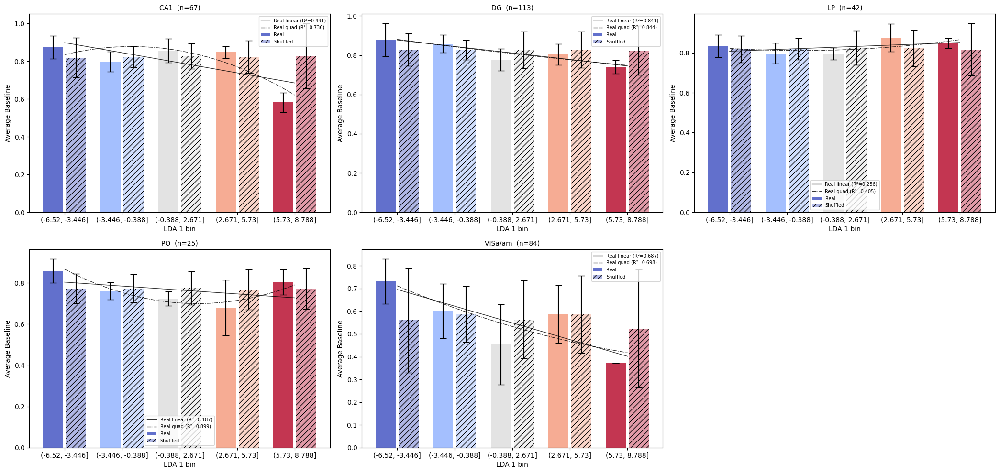

In [ ]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

use_var = 'baseline'
n_shuffles = 1000
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
axes = axes.flatten()

for reg_idx, region in enumerate(regions):
    ax = axes[reg_idx]
    region_summary = filtered[filtered['beryl_acronym'] == region]

    results_real = []
    results_shuffled = []

    for i in range(n_shuffles):
        sampled_sessions = np.random.choice(available_sessions,
                                            size=int(len(available_sessions)/2),
                                            replace=False)
        subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
        merged_subsample = region_summary.merge(subsample_lda[['binned1', 'session']], on='session')

        if merged_subsample.empty:
            continue

        real_means = merged_subsample.groupby('binned1')[use_var].mean()
        results_real.append(real_means)

        session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
        shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
        session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))

        merged_shuffled = merged_subsample.copy()
        merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
        shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
        results_shuffled.append(shuffled_means)

    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    binned1_categories = avg_real.index
    x_numeric = np.arange(len(binned1_categories))

    # Quadratic fits
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    # Linear fits
    real_coeffs_lin = np.polyfit(x_numeric, avg_real.values, 1)
    shuffled_coeffs_lin = np.polyfit(x_numeric, avg_shuffled.values, 1)

    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)
    real_fit_lin = np.polyval(real_coeffs_lin, x_smooth)
    shuffled_fit_lin = np.polyval(shuffled_coeffs_lin, x_smooth)

    real_r2 = r2_score(avg_real.values, np.polyval(real_coeffs, x_numeric))
    shuffled_r2 = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs, x_numeric))
    real_r2_lin = r2_score(avg_real.values, np.polyval(real_coeffs_lin, x_numeric))
    shuffled_r2_lin = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs_lin, x_numeric))

    n_categories = len(binned1_categories)
    cmap_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Sample counts per bin
    merged_all = region_summary.merge(lda[['binned1', 'session']], on='session')
    counts = merged_all.groupby('binned1')['session'].count().sort_index()
    n_total = len(merged_all)

    # Bar plots
    for i, cat in enumerate(binned1_categories):
        # Real
        cat_data = real_df[cat].dropna()
        ax.bar(i - 0.2, cat_data.mean(), yerr=cat_data.std(),
               color=cmap_colors[i], alpha=0.8, width=0.35,
               label='Real' if i == 0 else "", capsize=5)
        # Shuffled
        cat_data_s = shuffled_df[cat].dropna()
        ax.bar(i + 0.2, cat_data_s.mean(), yerr=cat_data_s.std(),
               color=cmap_colors[i], alpha=0.4, width=0.35, hatch='///',
               label='Shuffled' if i == 0 else "", capsize=5)
        
    ax.plot(x_smooth, real_fit_lin, 'black', linewidth=1, alpha=0.8,
            label=f'Real linear (R²={real_r2_lin:.3f})')
    ax.plot(x_smooth, real_fit, 'black', linewidth=1, alpha=0.8, linestyle='-.',
            label=f'Real quad (R²={real_r2:.3f})')
    # ax.plot(x_smooth, shuffled_fit_lin, 'gray', linewidth=1, alpha=0.8, linestyle='--',
    #         label=f'Shuf linear (R²={shuffled_r2_lin:.3f})')
    # ax.plot(x_smooth, shuffled_fit, 'gray', linewidth=1, alpha=0.8, linestyle=':',
    #         label=f'Shuf quad (R²={shuffled_r2:.3f})')

    count_str = ', '.join([f'B{b}:{c}' for b, c in counts.items()])
    ax.set_title(f'{region}  (n={n_total})', fontsize=10)
    # ax.set_title(f'{region}  (n={n_total})\n{count_str}', fontsize=10)
    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel(f'Average {use_var.capitalize()}')
    ax.set_xticks(range(len(binned1_categories)))
    ax.set_xticklabels(binned1_categories)
    ax.legend(fontsize=7)

for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

## Test different binnings


Processing 3 bins...


/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (3 bins):
y = 0.0515x² + -0.1270x + 0.7549
R² = 1.0000
Shuffled control quadratic fit (3 bins):
y = -0.0002x² + 0.0010x + 0.7133
R² = 1.0000
U-shape test (3 bins):
Real data: U-shape (coeff = 0.0515)
Shuffled: Inverted U-shape (coeff = -0.0002)

Processing 5 bins...


/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (5 bins):
y = 0.0176x² + -0.0771x + 0.7647
R² = 0.8648
Shuffled control quadratic fit (5 bins):
y = -0.0000x² + -0.0001x + 0.7142
R² = 0.6576
U-shape test (5 bins):
Real data: U-shape (coeff = 0.0176)
Shuffled: Inverted U-shape (coeff = -0.0000)

Processing 7 bins...


/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
/tmp/ipykernel_65183/4170289647.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_s

Real data quadratic fit (7 bins):
y = 0.0083x² + -0.0595x + 0.7896
R² = 0.7760
Shuffled control quadratic fit (7 bins):
y = -0.0000x² + -0.0001x + 0.7147
R² = 0.1333
U-shape test (7 bins):
Real data: U-shape (coeff = 0.0083)
Shuffled: Inverted U-shape (coeff = -0.0000)


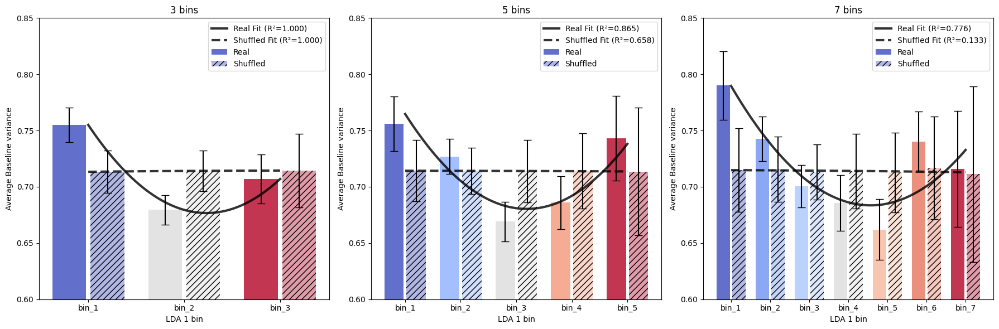


SUMMARY COMPARISON ACROSS BIN NUMBERS

3 bins:
  Real R² = 1.0000, Quadratic coeff = 0.0515
  Shuffled R² = 1.0000, Quadratic coeff = -0.0002
  Real shape: U-shape

5 bins:
  Real R² = 0.8648, Quadratic coeff = 0.0176
  Shuffled R² = 0.6576, Quadratic coeff = -0.0000
  Real shape: U-shape

7 bins:
  Real R² = 0.7760, Quadratic coeff = 0.0083
  Shuffled R² = 0.1333, Quadratic coeff = -0.0000
  Real shape: U-shape


In [234]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

# Set parameters
n_shuffles = 1000
use_var = 'baseline'
bin_numbers = [3, 5, 7]

# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

# Create subplots for each bin number
fig, axes = plt.subplots(1, len(bin_numbers), figsize=(6 * len(bin_numbers), 6))
if len(bin_numbers) == 1:
    axes = [axes]

all_results = {}

for bin_idx, n_bins in enumerate(bin_numbers):
    print(f"\nProcessing {n_bins} bins...")
    
    # Create bins for this iteration
    lda_with_bins = lda.copy()
    lda_with_bins[f'binned_{n_bins}'] = pd.cut(lda_with_bins[0], 
                                               bins=n_bins, 
                                               labels=[f'bin_{i+1}' for i in range(n_bins)])
    
    results_real = []
    results_shuffled = []
    
    for i in range(n_shuffles):
        # Subsample sessions
        sampled_sessions = np.random.choice(available_sessions, 
                                           size=min(len(lda_eid), len(available_sessions)), 
                                           replace=False)
        
        # Get the subsampled data
        subsample_lda = lda_with_bins.loc[lda_with_bins['session'].isin(sampled_sessions)]
        merged_subsample = summary_df.merge(subsample_lda[[f'binned_{n_bins}', 'session']], on='session')
        
        # Real data: calculate mean baseline per binned category
        real_means = merged_subsample.groupby(f'binned_{n_bins}')[use_var].mean()
        results_real.append(real_means)
        
        # Shuffled control: shuffle binned labels at SESSION level
        session_binned = merged_subsample[['session', f'binned_{n_bins}']].drop_duplicates()
        
        # Shuffle the binned values while keeping sessions intact
        shuffled_binned = np.random.permutation(session_binned[f'binned_{n_bins}'].values)
        session_shuffle_map = dict(zip(session_binned['session'], shuffled_binned))
        
        # Apply shuffled mapping
        merged_shuffled = merged_subsample.copy()
        merged_shuffled[f'binned_{n_bins}'] = merged_shuffled['session'].map(session_shuffle_map)
        
        shuffled_means = merged_shuffled.groupby(f'binned_{n_bins}')[use_var].mean()
        results_shuffled.append(shuffled_means)

    # Convert to DataFrames and calculate averages
    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    # Store results for summary
    all_results[n_bins] = {
        'real_df': real_df,
        'shuffled_df': shuffled_df,
        'avg_real': avg_real,
        'avg_shuffled': avg_shuffled
    }

    # Prepare data for quadratic fitting
    binned_categories = avg_real.index
    x_numeric = np.arange(len(binned_categories))  # Convert categories to numeric

    # Fit quadratic polynomials
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)

    # Generate smooth curves for plotting
    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)

    # Calculate R-squared values
    real_predicted = np.polyval(real_coeffs, x_numeric)
    shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
    real_r2 = r2_score(avg_real.values, real_predicted)
    shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)

    # Plot for this bin number
    ax = axes[bin_idx]
    
    # Get colors for each category
    n_categories = len(binned_categories)
    colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Plot real data (solid bars)
    for i, cat in enumerate(binned_categories):
        cat_data = real_df[cat]
        x_pos = i - 0.2  # Offset for side-by-side bars
        ax.bar(x_pos, cat_data.mean(), 
               yerr=cat_data.std(),
               color=colors[i], 
               alpha=0.8, 
               width=0.35,
               label='Real' if i == 0 else "",
               capsize=5)

    # Plot shuffled data (hatched bars)
    for i, cat in enumerate(binned_categories):
        cat_data = shuffled_df[cat]
        x_pos = i + 0.2  # Offset for side-by-side bars
        ax.bar(x_pos, cat_data.mean(), 
               yerr=cat_data.std(),
               color=colors[i], 
               alpha=0.4, 
               width=0.35,
               hatch='///',
               label='Shuffled' if i == 0 else "",
               capsize=5)

    # Add quadratic fit lines
    ax.plot(x_smooth, real_fit, 'black', linewidth=3, alpha=0.8, 
            label=f'Real Fit (R²={real_r2:.3f})')
    ax.plot(x_smooth, shuffled_fit, 'black', linewidth=3, alpha=0.8, linestyle='--',
            label=f'Shuffled Fit (R²={shuffled_r2:.3f})')

    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel('Average Baseline variance')
    ax.set_xticks(range(len(binned_categories)))
    ax.set_xticklabels(binned_categories)
    ax.legend()
    ax.set_ylim([0.6, .85])
    ax.set_title(f'{n_bins} bins')

    # Print results for this bin number
    print(f"Real data quadratic fit ({n_bins} bins):")
    print(f"y = {real_coeffs[0]:.4f}x² + {real_coeffs[1]:.4f}x + {real_coeffs[2]:.4f}")
    print(f"R² = {real_r2:.4f}")

    print(f"Shuffled control quadratic fit ({n_bins} bins):")
    print(f"y = {shuffled_coeffs[0]:.4f}x² + {shuffled_coeffs[1]:.4f}x + {shuffled_coeffs[2]:.4f}")
    print(f"R² = {shuffled_r2:.4f}")

    print(f"U-shape test ({n_bins} bins):")
    print(f"Real data: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {real_coeffs[0]:.4f})")
    print(f"Shuffled: {'U-shape' if shuffled_coeffs[0] > 0 else 'Inverted U-shape'} (coeff = {shuffled_coeffs[0]:.4f})")

plt.tight_layout()
plt.show()

# Summary comparison across bin numbers
print("\n" + "="*50)
print("SUMMARY COMPARISON ACROSS BIN NUMBERS")
print("="*50)

for n_bins in bin_numbers:
    real_df = all_results[n_bins]['real_df']
    shuffled_df = all_results[n_bins]['shuffled_df']
    avg_real = all_results[n_bins]['avg_real']
    avg_shuffled = all_results[n_bins]['avg_shuffled']
    
    # Recalculate coefficients for summary
    x_numeric = np.arange(len(avg_real))
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    
    real_predicted = np.polyval(real_coeffs, x_numeric)
    shuffled_predicted = np.polyval(shuffled_coeffs, x_numeric)
    real_r2 = r2_score(avg_real.values, real_predicted)
    shuffled_r2 = r2_score(avg_shuffled.values, shuffled_predicted)
    
    print(f"\n{n_bins} bins:")
    print(f"  Real R² = {real_r2:.4f}, Quadratic coeff = {real_coeffs[0]:.4f}")
    print(f"  Shuffled R² = {shuffled_r2:.4f}, Quadratic coeff = {shuffled_coeffs[0]:.4f}")
    print(f"  Real shape: {'U-shape' if real_coeffs[0] > 0 else 'Inverted U-shape'}")

## Linear mixed models

In [94]:
merged_df = summary_df.merge(lda[['mouse_name', 'session', 0, 1, 2, 3, 'binned1']], on='session', how='left')

In [300]:
import statsmodels.formula.api as smf
use_component = 0
var = 'ff_before_mean'
var = 'pop_sync'
# var = 'ff_after_mean'
var = 'ff_before_mean'
merged_df['quad_1'] = merged_df[0]**2
region_baseline = merged_df.groupby(['mouse_name', 'session', 'area',  0, 1, 2, 3])[var].mean().reset_index() #'brain_region', 
region_baseline = region_baseline.rename(columns={0:'lda_1'})
region_baseline = region_baseline.rename(columns={1:'lda_2'})
region_baseline = region_baseline.rename(columns={2:'lda_3'})
region_baseline = region_baseline.rename(columns={3:'lda_4'})

# 2. Define the model
groups = pd.Series(np.zeros(len(region_baseline)))  # dummy
# groups = region_baseline['mouse_name']
model = smf.mixedlm(
    "ff_before_mean ~ lda_1+lda_2+lda_3+lda_4", 
    region_baseline, 
    groups=groups, 
    re_formula="~1", 
    #vc_formula={"session": "0 + C(eid)"}
)
# 3. Fit the model
result = model.fit()

# 4. View the results
print(result.summary())

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: ff_before_mean
No. Observations: 105     Method:             REML          
No. Groups:       1       Scale:              0.0494        
Min. group size:  105     Log-Likelihood:     -6.3715       
Max. group size:  105     Converged:          Yes           
Mean group size:  105.0                                     
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept      0.833     0.223   3.728  0.000   0.395   1.271
lda_1         -0.012     0.006  -1.831  0.067  -0.024   0.001
lda_2         -0.010     0.009  -1.155  0.248  -0.028   0.007
lda_3         -0.018     0.010  -1.728  0.084  -0.038   0.002
lda_4          0.007     0.016   0.463  0.643  -0.024   0.038
Group Var      0.049                                         



/opt/anaconda3/envs/iblenv/lib/python3.10/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [304]:
# Step 1: Aggregate to the lowest level that varies (Area + Mouse)
region_baseline = merged_df.groupby(['mouse_name', 'session', 'area',  0, 1, 2, 3])[var].mean().reset_index() #'brain_region', 
grouped_data = region_baseline.rename(columns={0:'lda_1'})
grouped_data = grouped_data.rename(columns={1:'lda_2'})
grouped_data = grouped_data.rename(columns={2:'lda_3'})
grouped_data = grouped_data.rename(columns={3:'lda_4'})
# grouped_data = region_baseline.groupby(['mouse_name', 'area', 'lda_1']).mean().reset_index()

# Step 2: Use OLS with Cluster-Robust Standard Errors
# This accounts for the nesting without needing to solve complex random effects
model = smf.ols("ff_before_mean ~ lda_1 + lda_2 + lda_3 + lda_4 + C(area)", data=grouped_data)
results = model.fit(cov_type='cluster', cov_kwds={'groups': grouped_data['mouse_name']})

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:         ff_before_mean   R-squared:                       0.275
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     7.625
Date:                Sat, 25 Apr 2026   Prob (F-statistic):           1.45e-05
Time:                        11:48:27   Log-Likelihood:                 23.897
No. Observations:                 105   AIC:                            -27.79
Df Residuals:                      95   BIC:                            -1.254
Df Model:                           9                                         
Covariance Type:              cluster                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.8234      0.047  

# Single neuron PETH

In [208]:
# Initialize a list to hold the session-level PSTH data
all_session_mean = pd.DataFrame()
counter = 0
for filepath in filepaths:
    try:
        session_mean = pd.DataFrame()
        with open(filepath, 'rb') as f:
            state_with_spikes = pickle.load(f).dropna(subset=['Bin', 'most_likely_states'])
        state_with_spikes = state_with_spikes.loc[(state_with_spikes['Bin']> state_with_spikes['Bin'].min()+600) & 
                                                  (state_with_spikes['Bin']< state_with_spikes['Bin'].min()+900)]
        new_df = state_with_spikes.reset_index(drop=True)
        session_name = state_with_spikes['session'].iloc[0]
        spike_columns = [col for col in new_df.columns if '_spike_count' in col]
        area_names = np.unique([col.split('_neuron_')[0] for col in spike_columns])
        events = np.array(new_df['goCueTrigger_times'].unique())

        for area in area_names:
            area_cols = [c for c in spike_columns if area in c]
            
            # 1. Get PSTH: (n_trials, n_time_bins, n_neurons_in_area)
            area_psths = [get_psth(new_df, col, events, pre=.5, post=1.5) for col in area_cols]
            area_psths = np.stack(area_psths, axis=-1) 

            area_baseline = area_psths[:, 20:30, :]
            area_baseline = area_baseline[:np.shape(area_psths)[0], :, :] # Keep only same number of trials as area_psth
            area_baseline = area_baseline.mean(axis=1)

            baseline_subtracted_psths = (area_psths - area_baseline[:, np.newaxis, :]) / (area_baseline[:, np.newaxis, :]+0.01)

            # 2. Compute Statistics ACROSS TRIALS (axis=0)
            mean_across_trials = baseline_subtracted_psths.mean(axis=0)# (time, neurons)
            
            # mean_across_trials = area_psths.mean(axis=0)# (time, neurons)

            # 7. Append to summary
            session_mean = pd.DataFrame(mean_across_trials.T)
            session_mean['session'] = session_name
            session_mean['area'] = area

            all_session_mean = pd.concat([all_session_mean, session_mean], ignore_index=True)
            
        counter = counter+1
        print(f"Processing file: {counter}")  # Add this line to track progress

    except Exception as e:
        print(f"Error: {e}")


Processing file: 1
Processing file: 2
Processing file: 3
Processing file: 4
Processing file: 5
Processing file: 6
Processing file: 7
Processing file: 8
Processing file: 9
Processing file: 10
Processing file: 11
Processing file: 12
Processing file: 13
Processing file: 14
Processing file: 15
Processing file: 16
Processing file: 17
Processing file: 18
Processing file: 19
Processing file: 20
Processing file: 21
Processing file: 22
Processing file: 23
Processing file: 24
Processing file: 25
Processing file: 26
Processing file: 27
Processing file: 28
Processing file: 29
Processing file: 30
Processing file: 31
Processing file: 32
Processing file: 33
Processing file: 34
Processing file: 35
Processing file: 36
Processing file: 37
Processing file: 38
Processing file: 39
Processing file: 40
Processing file: 41
Processing file: 42
Processing file: 43
Processing file: 44
Processing file: 45
Processing file: 46
Processing file: 47
Processing file: 48
Processing file: 49
Processing file: 50
Processin

KeyboardInterrupt: 

In [37]:
save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
all_session_mean.to_pickle(save_path+'psths_for_pca')

In [11]:
import sys
# If you're on NumPy 1.x, loading a pickle from NumPy 2.x:
sys.modules['numpy._core'] = np.core
sys.modules['numpy._core.numeric'] = np.core.numeric

save_path = prefix + 'representation_learning_variability/paper-individuality/4_mice/'
with open(save_path+'psths_for_pca_no_baseline', 'rb') as f:
    all_session_mean = pickle.load(f)

In [ ]:
with open(save_path+'psths_for_pca', 'rb') as f:
    all_session_mean = pickle.load(f)

In [331]:
with open(save_path+'psths_fanofactor', 'rb') as f:
    all_session_mean = pickle.load(f)

In [457]:
# Identify time-bin columns (numeric, not 'session'/'area')
time_cols = [col for col in all_session_mean.columns if isinstance(col, (int, np.integer))]

# Define baseline columns (same bins 20:30 as in original code)
baseline_cols = list(range(15, 30))

# Compute mean baseline per neuron (mean across baseline time bins)
baseline = all_session_mean[baseline_cols].mean(axis=1)

# Baseline-subtract and divide: (x - baseline) / (baseline + 0.01)
all_session_mean_norm = all_session_mean.copy()
all_session_mean_norm[time_cols] = (
    all_session_mean[time_cols]
    .subtract(baseline, axis=0)
    
) #     .div(baseline + 0.01, axis=0)

In [458]:
all_session_mean = all_session_mean_norm

In [12]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')

# lda = pd.read_pickle(data_path+'mouse_LDA_3_bins_cut')
# lda = pd.read_pickle(data_path+'mouse_LDA_quadrants')
# lda = pd.read_pickle(data_path+'reaction_PLS_5_bins')
lda_eid = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session']
lda_pid = bwm_df.loc[bwm_df['eid'].isin(lda_eid), 'pid']

In [13]:
lda = lda.rename(columns={0:'lda_1'})
lda = lda.rename(columns={1:'lda_2'})
# lda['binned1'] = np.random.permutation(lda['binned1'].values)
merged_data = all_session_mean.merge(lda[['session', 'lda_1', 'lda_2', 'binned1', 'binned2']], on='session', how='left')


## Visualizing the PSTHs

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_86057/3700620150.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_86057/3700620150.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean


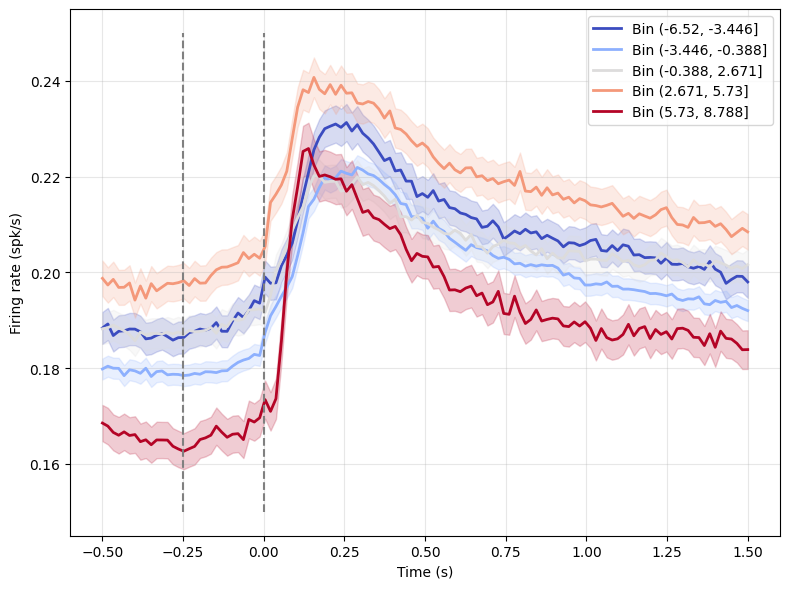

Number of sessions per bin:
binned1
(-6.52, -3.446]      9771
(-3.446, -0.388]    21723
(-0.388, 2.671]     12455
(2.671, 5.73]       10188
(5.73, 8.788]        4823
Name: session, dtype: int64


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_86057/3700620150.py:77: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(merged_df.groupby('binned1')['session'].count().sort_index())


In [14]:
# BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']  # Reproducible ephys regions

# filtered = summary_df.loc[summary_df['area'].isin(BRAIN_REGIONS)]
# merged_df = filtered.merge(lda[['binned1', 'session']], on='session')
# merged_df = summary_df.merge(lda[['binned1', 'session']], on='session')
merged_df = merged_data.copy()

# Assuming your timestep data is in columns (if not, we may need to reshape)
# Get the column names that represent timesteps (excluding metadata columns)
timestep_cols = [col for col in merged_df.columns if col not in ['session', 'binned1', 'area', 'pid']]
timestep_cols = np.arange(0, 120, 1)
# Group by binned1 and calculate mean and standard error across sessions for each timestep
averaged_by_bin = merged_df.groupby('binned1')[timestep_cols].mean()
stderr_by_bin = merged_df.groupby('binned1')[timestep_cols].sem()  # standard error of the mean

# Sort bins by their values
sorted_bins = sorted(averaged_by_bin.index)

# Create gradient color palette
colors = plt.cm.viridis(np.linspace(0, 1, len(sorted_bins)))
colors = plt.cm.coolwarm(np.linspace(0, 1, len(sorted_bins)))
# colors = vigor_colors_5

# Create the plot
plt.figure(figsize=(8, 6))
x_values = range(len(timestep_cols))
time_in_seconds = np.linspace(-0.5, 1.5, len(timestep_cols))

# Plot each bin as a separate line with error bands
for i, bin_value in enumerate(sorted_bins):
    mean_values = averaged_by_bin.loc[bin_value]
    error_values = stderr_by_bin.loc[bin_value]
    
    # Plot the main line
    plt.plot(time_in_seconds, mean_values, 
             label=f'Bin {bin_value}', 
             linewidth=2,
             color=colors[i])
    
    # Add error bands (mean ± standard error)
    plt.fill_between(time_in_seconds,
                     mean_values - error_values,
                     mean_values + error_values,
                     alpha=0.2,
                     color=colors[i])
plt.vlines(0, .15, 0.25, color='gray', linestyle='--')
plt.vlines(-.25, .15, 0.25, color='gray', linestyle='--')
# # Plot each bin as a separate line with error bands
# for i, bin_value in enumerate(sorted_bins):
#     mean_values = averaged_by_bin.loc[bin_value]
#     error_values = stderr_by_bin.loc[bin_value]
    
#     # Plot the main line
#     plt.plot(x_values, mean_values, 
#              label=f'Bin {bin_value}', 
#              linewidth=2,
#              color=colors[i])
    
#     # Add error bands (mean ± standard error)
#     plt.fill_between(x_values,
#                      mean_values - error_values,
#                      mean_values + error_values,
#                      alpha=0.2,
#                      color=colors[i])
# plt.ylim([0.6, .9])
plt.xlabel('Time (s)')
plt.ylabel('Baseline-normalized firing rate')
plt.ylabel('Baseline-subtracted firing rate (spk/s)')
plt.ylabel('Firing rate (spk/s)')
# plt.title('Average Time Series by Binned1 Groups (with Standard Error)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()
# Optional: Display summary statistics
print("Number of sessions per bin:")
print(merged_df.groupby('binned1')['session'].count().sort_index())

## Smoothed derivative

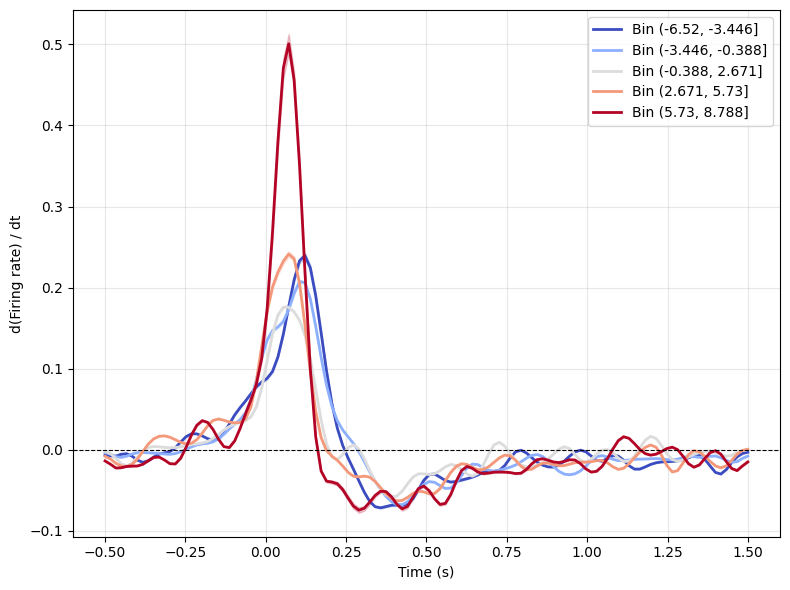

In [468]:
from scipy.ndimage import gaussian_filter1d

sigma = 2
dt = time_in_seconds[1] - time_in_seconds[0]

plt.figure(figsize=(8, 6))

for i, bin_value in enumerate(sorted_bins):
    smoothed_mean = gaussian_filter1d(averaged_by_bin.loc[bin_value].values, sigma=sigma)
    smoothed_upper = gaussian_filter1d((averaged_by_bin.loc[bin_value] + stderr_by_bin.loc[bin_value]).values, sigma=sigma)
    smoothed_lower = gaussian_filter1d((averaged_by_bin.loc[bin_value] - stderr_by_bin.loc[bin_value]).values, sigma=sigma)

    deriv_mean = np.gradient(smoothed_mean, dt)
    deriv_upper = np.gradient(smoothed_upper, dt)
    deriv_lower = np.gradient(smoothed_lower, dt)

    plt.plot(time_in_seconds, deriv_mean,
             label=f'Bin {bin_value}', linewidth=2, color=colors[i])
    plt.fill_between(time_in_seconds, deriv_lower, deriv_upper,
                     alpha=0.2, color=colors[i])

plt.axhline(0, color='k', linewidth=0.8, linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('d(Firing rate) / dt')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Post-stimulus response

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/67371073.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/67371073.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/67371073.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain curren

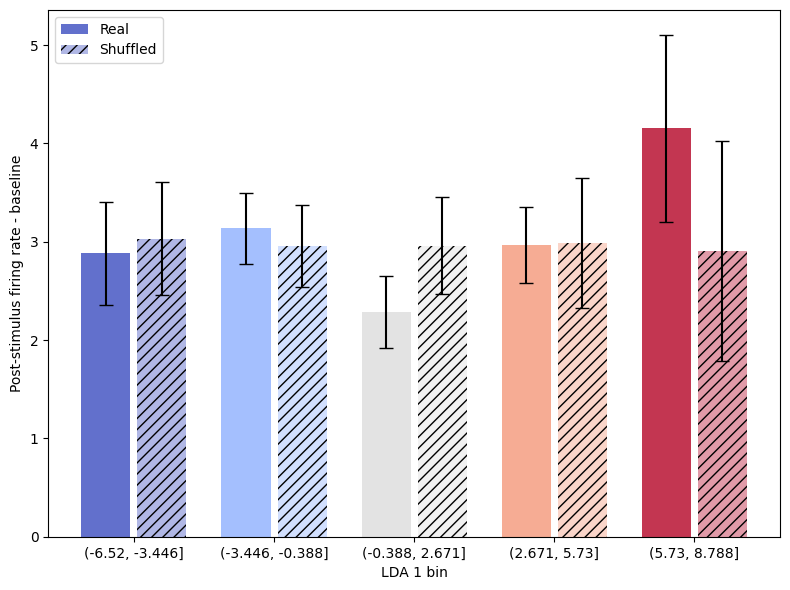

In [277]:
summary_df = all_session_mean.copy()
post_cols = np.arange(51, 70, 1)  
post_cols = np.arange(30, 60, 1)  
pre_cols = np.arange(0, 20, 1)  

summary_df['post'] = summary_df[post_cols].mean(axis=1)
summary_df['pre'] = summary_df[pre_cols].mean(axis=1)

from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

# Set parameters
n_shuffles = 100
results_real = []
results_shuffled = []
use_var = 'post'
# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()
sample_size = int(len(available_sessions)/2)
for i in range(n_shuffles):
    # Subsample sessions (same fraction as before, or adjust as needed)
    sampled_sessions = np.random.choice(available_sessions, 
                                       size=sample_size, 
                                       replace=False)
    
    # Get the subsampled data
    subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
    merged_subsample = summary_df.merge(subsample_lda[['binned1', 'session']], on='session')
    
    # Real data: calculate mean baseline per binned1 category
    real_means = merged_subsample.groupby('binned1')[use_var].mean()
    results_real.append(real_means)
    
    # Shuffled control: shuffle binned1 labels at SESSION level
    # Get unique session-binned1 mapping
    session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
    
    # Shuffle the binned1 values while keeping sessions intact
    shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
    session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))
    
    # Apply shuffled mapping
    merged_shuffled = merged_subsample.copy()
    merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
    
    shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
    results_shuffled.append(shuffled_means)

# Convert to DataFrames and calculate averages
real_df = pd.DataFrame(results_real)
shuffled_df = pd.DataFrame(results_shuffled)

avg_real = real_df.mean().sort_index()
avg_shuffled = shuffled_df.mean().sort_index()

# Reshape data for plotting with hue
plot_data = []

# Add real data
for binned1_cat in real_df.columns:
    for value in real_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            use_var: value,
            'condition': 'Real'
        })

# Add shuffled data
for binned1_cat in shuffled_df.columns:
    for value in shuffled_df[binned1_cat]:
        plot_data.append({
            'binned1': binned1_cat,
            use_var: value,
            'condition': 'Shuffled'
        })

plot_df = pd.DataFrame(plot_data)

# Create the plot with simple coloring
plt.figure(figsize=(8, 6))

# Create separate plots for real and shuffled with different alphas
ax = plt.gca()

# Get viridis colors for each binned1 category
n_categories = len(binned1_categories)
viridis_colors = plt.cm.viridis(np.linspace(0, 1, n_categories))
viridis_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))


# Plot real data (solid bars)
real_data = plot_df[plot_df['condition'] == 'Real']
for i, cat in enumerate(binned1_categories):
    cat_data = real_data[real_data['binned1'] == cat][use_var]
    x_pos = i - 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.8, 
           width=0.35,
           label='Real' if i == 0 else "",
           capsize=5)

# Plot shuffled dat(np.linspace(0, 1, len(sorted_bins)))a (hatched bars)
shuffled_data = plot_df[plot_df['condition'] == 'Shuffled']
for i, cat in enumerate(binned1_categories):
    cat_data = shuffled_data[shuffled_data['binned1'] == cat][use_var]
    x_pos = i + 0.2  # Offset for side-by-side bars
    plt.bar(x_pos, cat_data.mean(), 
           yerr=cat_data.std(),
           color=viridis_colors[i], 
           alpha=0.4, 
           width=0.35,
           hatch='///',
           label='Shuffled' if i == 0 else "",
           capsize=5)


plt.xlabel('LDA 1 bin')
plt.ylabel('Post-stimulus firing rate - baseline')
plt.xticks(range(len(binned1_categories)), binned1_categories)
plt.legend()
# plt.ylim([0.6, .85])
plt.tight_layout()
plt.show()


## Multiple bin sizes

Processing 3 bins...
Processing 5 bins...
Processing 7 bins...
Processing 9 bins...


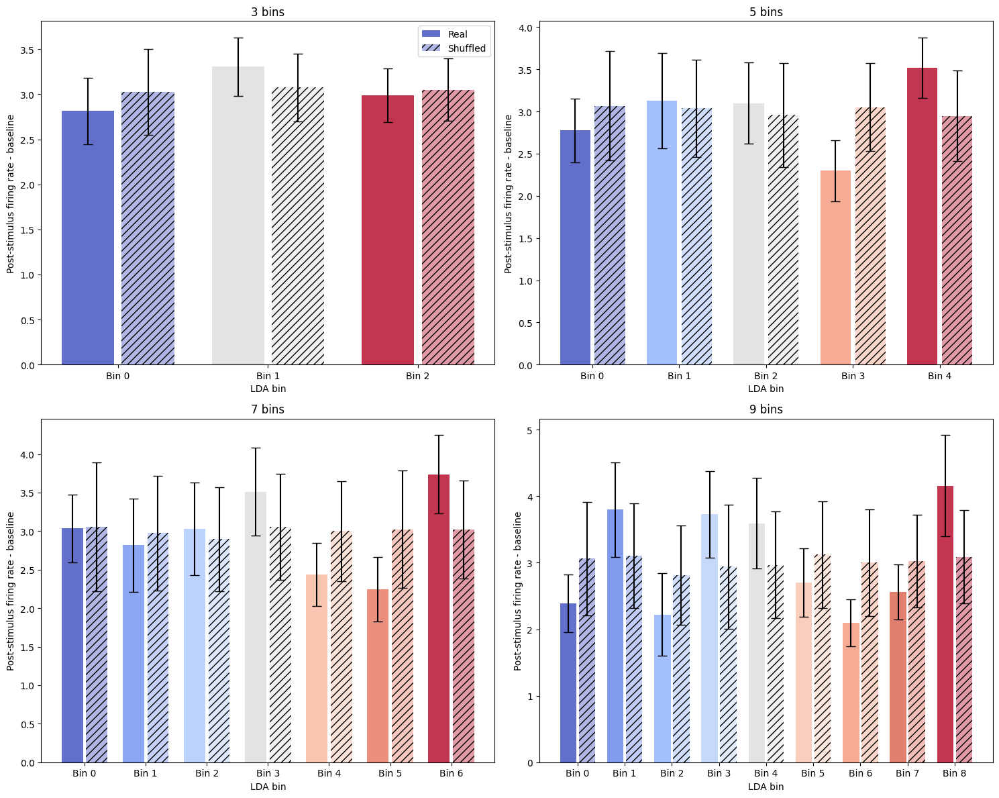

In [276]:
summary_df = all_session_mean.copy()
post_cols = np.arange(31, 50, 1)  
pre_cols = np.arange(0, 25, 1)  

summary_df['post'] = summary_df[post_cols].mean(axis=1)
summary_df['pre'] = summary_df[pre_cols].mean(axis=1)

from sklearn.metrics import r2_score
import matplotlib.colors as mcolors
import pandas as pd

# Set parameters
n_shuffles = 100
use_var = 'post'
bin_sizes = [3, 5, 7, 9]
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()
sample_size = int(len(available_sessions)/2)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for plot_idx, n_bins in enumerate(bin_sizes):
    print(f"Processing {n_bins} bins...")
    
    # Create bins from column 0 (LDA values)
    lda_values = lda['lda_1']  # Column 0 contains the LDA values
    bin_edges = np.percentile(lda_values, np.linspace(0, 100, n_bins + 1))
    
    # Create binned categories
    lda_temp = lda.copy()
    lda_temp['binned_lda'] = pd.cut(lda_temp['lda_1'], bins=bin_edges, labels=False, include_lowest=True)
    
    # Get bin categories for this iteration
    current_categories = sorted(lda_temp['binned_lda'].dropna().unique())
    
    results_real = []
    results_shuffled = []
    
    for i in range(n_shuffles):
        # Subsample sessions
        sampled_sessions = np.random.choice(available_sessions, 
                                           size=sample_size, 
                                           replace=False)
        
        # Get the subsampled data
        subsample_lda = lda_temp.loc[lda_temp['session'].isin(sampled_sessions)]
        merged_subsample = summary_df.merge(subsample_lda[['binned_lda', 'session']], on='session')
        
        # Remove any NaN values from binning
        merged_subsample = merged_subsample.dropna(subset=['binned_lda'])
        
        # Real data: calculate mean baseline per binned category
        real_means = merged_subsample.groupby('binned_lda')[use_var].mean()
        results_real.append(real_means)
        
        # Shuffled control: shuffle binned_lda labels at SESSION level
        session_binned = merged_subsample[['session', 'binned_lda']].drop_duplicates()
        
        # Shuffle the binned values while keeping sessions intact
        shuffled_binned = np.random.permutation(session_binned['binned_lda'].values)
        session_shuffle_map = dict(zip(session_binned['session'], shuffled_binned))
        
        # Apply shuffled mapping
        merged_shuffled = merged_subsample.copy()
        merged_shuffled['binned_lda'] = merged_shuffled['session'].map(session_shuffle_map)
        
        shuffled_means = merged_shuffled.groupby('binned_lda')[use_var].mean()
        results_shuffled.append(shuffled_means)
    
    # Convert to DataFrames and calculate averages
    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)
    
    # Create the subplot
    ax = axes[plot_idx]
    
    # Get colors for each category
    n_categories = len(current_categories)
    viridis_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))
    
    # Plot real data (solid bars)
    for i, cat in enumerate(current_categories):
        if cat in real_df.columns:
            cat_data = real_df[cat]
            x_pos = i - 0.2
            ax.bar(x_pos, cat_data.mean(), 
                   yerr=cat_data.std(),
                   color=viridis_colors[i], 
                   alpha=0.8, 
                   width=0.35,
                   label='Real' if i == 0 else "",
                   capsize=5)
    
    # Plot shuffled data (hatched bars)
    for i, cat in enumerate(current_categories):
        if cat in shuffled_df.columns:
            cat_data = shuffled_df[cat]
            x_pos = i + 0.2
            ax.bar(x_pos, cat_data.mean(), 
                   yerr=cat_data.std(),
                   color=viridis_colors[i], 
                   alpha=0.4, 
                   width=0.35,
                   hatch='///',
                   label='Shuffled' if i == 0 else "",
                   capsize=5)
    
    ax.set_xlabel('LDA bin')
    ax.set_ylabel('Post-stimulus firing rate - baseline')
    ax.set_title(f'{n_bins} bins')
    ax.set_xticks(range(len(current_categories)))
    ax.set_xticklabels([f'Bin {int(cat)}' for cat in current_categories])
    if plot_idx == 0:  # Only show legend on first subplot
        ax.legend()

plt.tight_layout()
plt.show()

## Per brain region

In [343]:
regions = BrainRegions()
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']
summary_df = all_session_mean.copy()
summary_df = summary_df.dropna(subset=['area']).copy()

# Acronyms → Allen IDs → Beryl IDs → Beryl acronyms
allen_ids = regions.acronym2id(summary_df['area'].values)
beryl_ids = regions.remap(allen_ids, source_map='Allen', target_map='Beryl')
summary_df['beryl_acronym'] = regions.id2acronym(beryl_ids)

filtered = summary_df[summary_df['beryl_acronym'].isin(BRAIN_REGIONS)]

In [344]:
filtered.loc[filtered['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
filtered.loc[filtered['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

# Extract baseline (timesteps 20-30) and average
# baseline_cols = np.arange(20, 31)  # time_20 to time_30
# post_cols = np.arange(40, 61)  # time_40 to time_60
post_cols = np.arange(35, 55, 1)  
baseline_cols = np.arange(0, 25, 1)  

filtered['baseline'] = filtered.iloc[:, baseline_cols].mean(axis=1)
filtered['post'] = filtered.iloc[:, post_cols].mean(axis=1)
filtered['diff'] = filtered['post'] - filtered['baseline']

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/56896412.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['baseline'] = filtered.iloc[:, baseline_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/56896412.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['post'] = filtered.iloc[:, post_cols].mean(axis=1)
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/56896412.py:12: SettingWithCopyWarning: 
A value is trying to be set

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2699171194.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2699171194.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  real_means = merged_subsample.groupby('binned1')[use_var].mean()
/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/2699171194.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain 

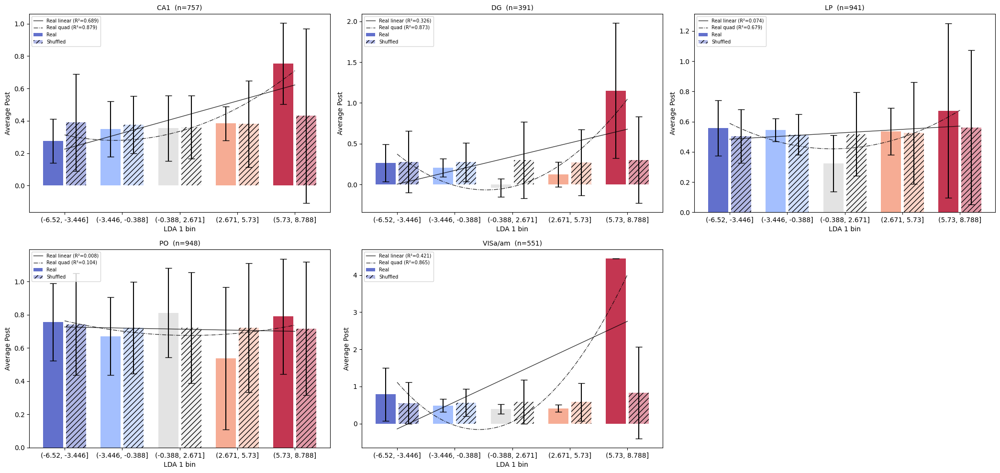

In [336]:
from sklearn.metrics import r2_score
import matplotlib.colors as mcolors

use_var = 'post'
n_shuffles = 1000
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(7 * ncols, 5 * nrows))
axes = axes.flatten()

for reg_idx, region in enumerate(regions):
    ax = axes[reg_idx]
    region_summary = filtered[filtered['beryl_acronym'] == region]

    results_real = []
    results_shuffled = []

    for i in range(n_shuffles):
        sampled_sessions = np.random.choice(available_sessions,
                                            size=int(len(available_sessions)/2),
                                            replace=False)
        subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
        merged_subsample = region_summary.merge(subsample_lda[['binned1', 'session']], on='session')

        if merged_subsample.empty:
            continue

        real_means = merged_subsample.groupby('binned1')[use_var].mean()
        results_real.append(real_means)

        session_binned1 = merged_subsample[['session', 'binned1']].drop_duplicates()
        shuffled_binned1 = np.random.permutation(session_binned1['binned1'].values)
        session_shuffle_map = dict(zip(session_binned1['session'], shuffled_binned1))

        merged_shuffled = merged_subsample.copy()
        merged_shuffled['binned1'] = merged_shuffled['session'].map(session_shuffle_map)
        shuffled_means = merged_shuffled.groupby('binned1')[use_var].mean()
        results_shuffled.append(shuffled_means)

    real_df = pd.DataFrame(results_real)
    shuffled_df = pd.DataFrame(results_shuffled)

    avg_real = real_df.mean().sort_index()
    avg_shuffled = shuffled_df.mean().sort_index()

    binned1_categories = avg_real.index
    x_numeric = np.arange(len(binned1_categories))

    # Quadratic fits
    real_coeffs = np.polyfit(x_numeric, avg_real.values, 2)
    shuffled_coeffs = np.polyfit(x_numeric, avg_shuffled.values, 2)
    # Linear fits
    real_coeffs_lin = np.polyfit(x_numeric, avg_real.values, 1)
    shuffled_coeffs_lin = np.polyfit(x_numeric, avg_shuffled.values, 1)

    x_smooth = np.linspace(x_numeric.min(), x_numeric.max(), 100)
    real_fit = np.polyval(real_coeffs, x_smooth)
    shuffled_fit = np.polyval(shuffled_coeffs, x_smooth)
    real_fit_lin = np.polyval(real_coeffs_lin, x_smooth)
    shuffled_fit_lin = np.polyval(shuffled_coeffs_lin, x_smooth)

    real_r2 = r2_score(avg_real.values, np.polyval(real_coeffs, x_numeric))
    shuffled_r2 = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs, x_numeric))
    real_r2_lin = r2_score(avg_real.values, np.polyval(real_coeffs_lin, x_numeric))
    shuffled_r2_lin = r2_score(avg_shuffled.values, np.polyval(shuffled_coeffs_lin, x_numeric))

    n_categories = len(binned1_categories)
    cmap_colors = plt.cm.coolwarm(np.linspace(0, 1, n_categories))

    # Sample counts per bin
    merged_all = region_summary.merge(lda[['binned1', 'session']], on='session')
    counts = merged_all.groupby('binned1')['session'].count().sort_index()
    n_total = len(merged_all)

    # Bar plots
    for i, cat in enumerate(binned1_categories):
        # Real
        cat_data = real_df[cat].dropna()
        ax.bar(i - 0.2, cat_data.mean(), yerr=cat_data.std(),
               color=cmap_colors[i], alpha=0.8, width=0.35,
               label='Real' if i == 0 else "", capsize=5)
        # Shuffled
        cat_data_s = shuffled_df[cat].dropna()
        ax.bar(i + 0.2, cat_data_s.mean(), yerr=cat_data_s.std(),
               color=cmap_colors[i], alpha=0.4, width=0.35, hatch='///',
               label='Shuffled' if i == 0 else "", capsize=5)
        
    ax.plot(x_smooth, real_fit_lin, 'black', linewidth=1, alpha=0.8,
            label=f'Real linear (R²={real_r2_lin:.3f})')
    ax.plot(x_smooth, real_fit, 'black', linewidth=1, alpha=0.8, linestyle='-.',
            label=f'Real quad (R²={real_r2:.3f})')
    # ax.plot(x_smooth, shuffled_fit_lin, 'gray', linewidth=1, alpha=0.8, linestyle='--',
    #         label=f'Shuf linear (R²={shuffled_r2_lin:.3f})')
    # ax.plot(x_smooth, shuffled_fit, 'gray', linewidth=1, alpha=0.8, linestyle=':',
    #         label=f'Shuf quad (R²={shuffled_r2:.3f})')

    count_str = ', '.join([f'B{b}:{c}' for b, c in counts.items()])
    ax.set_title(f'{region}  (n={n_total})', fontsize=10)
    # ax.set_title(f'{region}  (n={n_total})\n{count_str}', fontsize=10)
    ax.set_xlabel('LDA 1 bin')
    ax.set_ylabel(f'Average {use_var.capitalize()}')
    ax.set_xticks(range(len(binned1_categories)))
    ax.set_xticklabels(binned1_categories)
    ax.legend(fontsize=7)

for idx in range(len(regions), len(axes)):
    axes[idx].set_visible(False)

fig.tight_layout()
plt.show()

## PLS

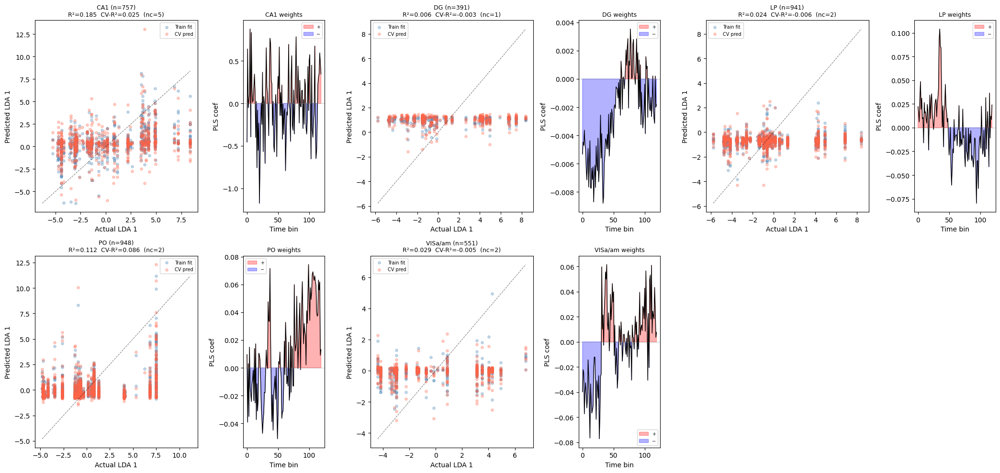

,region,n,best_n_components,r2_full,r2_cv
3,PO,948,2,0.112059,0.085551
0,CA1,757,5,0.185307,0.024649
1,DG,391,1,0.005780,-0.003072
4,VISa/am,551,2,0.028528,-0.004601
2,LP,941,2,0.023805,-0.006056


In [345]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
import warnings

time_cols = [f'time_{i}' for i in range(90)]
time_cols = np.arange(0, 120, 1)
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

n_cv_folds = 5
max_components = 10  # search up to this many PLS components

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(7 * ncols, 5 * nrows),
                         gridspec_kw={'width_ratios': [2, 1] * ncols})

pls_results = []

for reg_idx, region in enumerate(regions):
    ax_pred = axes.flatten()[(reg_idx % ncols) * 2 + (reg_idx // ncols) * ncols * 2]
    ax_wt   = axes.flatten()[(reg_idx % ncols) * 2 + 1 + (reg_idx // ncols) * ncols * 2]

    region_summary = filtered[filtered['beryl_acronym'] == region]
    merged = region_summary.merge(lda[['lda_1', 'session']], on='session')

    if merged.empty or len(merged) < max_components + 2:
        ax_pred.set_visible(False)
        ax_wt.set_visible(False)
        continue

    X = merged[time_cols].values
    y = merged['lda_1'].values

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # --- Select n_components via CV ---
    kf = KFold(n_splits=n_cv_folds, shuffle=True, random_state=42)
    best_nc, best_r2_cv = 1, -np.inf

    cv_scores = []
    for nc in range(1, min(max_components + 1, X_scaled.shape[1], X_scaled.shape[0] // n_cv_folds)):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            y_cv = cross_val_predict(PLSRegression(n_components=nc, scale=False),
                                     X_scaled, y, cv=kf)
        r2_cv = r2_score(y, y_cv)
        cv_scores.append((nc, r2_cv))
        if r2_cv > best_r2_cv:
            best_r2_cv = r2_cv
            best_nc = nc

    # --- Fit final model with best n_components ---
    pls = PLSRegression(n_components=best_nc, scale=False)
    pls.fit(X_scaled, y)
    y_fit = pls.predict(X_scaled).ravel()
    r2_full = r2_score(y, y_fit)

    y_cv_best = cross_val_predict(PLSRegression(n_components=best_nc, scale=False),
                                  X_scaled, y, cv=kf)
    r2_cv_best = r2_score(y, y_cv_best)

    # PLS weights (first component for visualization, full model weights)
    weights = pls.coef_.ravel()  # regression coefficients over time bins

    pls_results.append({
        'region': region,
        'n': len(merged),
        'best_n_components': best_nc,
        'r2_full': r2_full,
        'r2_cv': r2_cv_best,
        'weights': weights,
        'cv_scores': cv_scores,
    })

    # --- Left panel: predicted vs actual ---
    ax_pred.scatter(y, y_fit, alpha=0.3, s=15, color='steelblue', label='Train fit')
    ax_pred.scatter(y, y_cv_best, alpha=0.3, s=15, color='tomato', label='CV pred')
    lims = [min(y.min(), y_fit.min()), max(y.max(), y_fit.max())]
    ax_pred.plot(lims, lims, 'k--', linewidth=0.8, alpha=0.5)
    ax_pred.set_xlabel('Actual LDA 1')
    ax_pred.set_ylabel('Predicted LDA 1')
    ax_pred.set_title(f'{region} (n={len(merged)})\n'
                      f'R²={r2_full:.3f}  CV-R²={r2_cv_best:.3f}  (nc={best_nc})',
                      fontsize=9)
    ax_pred.legend(fontsize=7)

    # --- Right panel: PLS regression weights over time ---
    ax_wt.plot(np.arange(len(time_cols)), weights, color='black', linewidth=1)
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights > 0, color='red', label='+')
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights < 0, color='blue', label='−')
    ax_wt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    ax_wt.set_xlabel('Time bin')
    ax_wt.set_ylabel('PLS coef')
    ax_wt.set_title(f'{region} weights', fontsize=9)
    ax_wt.legend(fontsize=7)

for idx in range(len(regions) * 2, len(axes.flatten())):
    axes.flatten()[idx].set_visible(False)

fig.tight_layout()
plt.show()

# --- Summary table ---
pls_df = pd.DataFrame([{k: v for k, v in r.items() if k not in ['weights', 'cv_scores']}
                        for r in pls_results])
pls_df = pls_df.sort_values('r2_cv', ascending=False)
display(pls_df)

# Regression

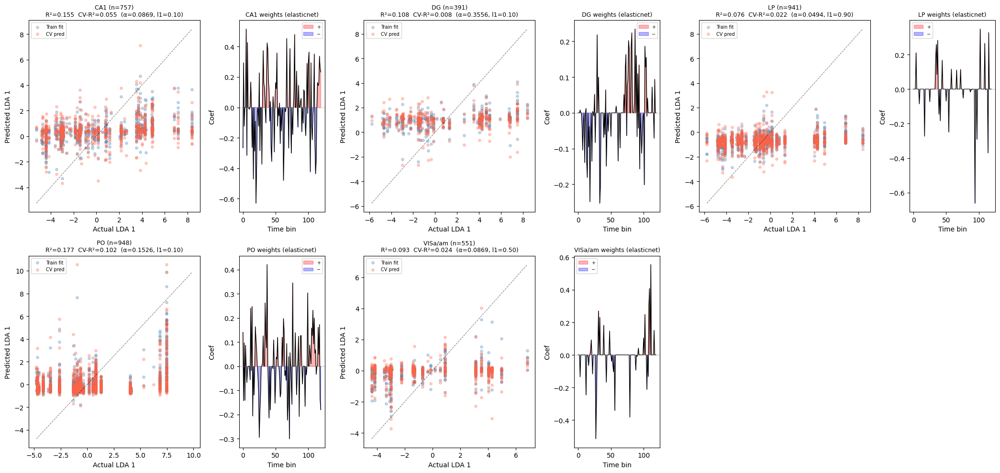

,region,n,alpha,r2_full,r2_cv,l1_ratio
3,PO,948,0.152642,0.177274,0.102084,0.1
0,CA1,757,0.086851,0.155457,0.054728,0.1
4,VISa/am,551,0.086851,0.093001,0.023732,0.5
2,LP,941,0.049417,0.075725,0.021502,0.9
1,DG,391,0.355648,0.108357,0.008241,0.1


In [353]:
from sklearn.linear_model import ElasticNetCV, RidgeCV
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import warnings

time_cols = np.arange(0, 120, 1)
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

n_cv_folds = 5
# Choose one: 'elasticnet' or 'ridge'
METHOD = 'elasticnet'

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(7 * ncols, 5 * nrows),
                         gridspec_kw={'width_ratios': [2, 1] * ncols})

reg_results = []

for reg_idx, region in enumerate(regions):
    ax_pred = axes.flatten()[(reg_idx % ncols) * 2 + (reg_idx // ncols) * ncols * 2]
    ax_wt   = axes.flatten()[(reg_idx % ncols) * 2 + 1 + (reg_idx // ncols) * ncols * 2]

    region_summary = filtered[filtered['beryl_acronym'] == region]
    merged = region_summary.merge(lda[['lda_1', 'session']], on='session')

    if merged.empty or len(merged) < n_cv_folds + 2:
        ax_pred.set_visible(False)
        ax_wt.set_visible(False)
        continue

    X = merged[time_cols].values
    y = merged['lda_1'].values

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    kf = KFold(n_splits=n_cv_folds, shuffle=True, random_state=42)

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        if METHOD == 'elasticnet':
            # ElasticNetCV searches over alpha and l1_ratio via internal CV
            model = ElasticNetCV(
                l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 1.0],  # 1.0 = Lasso, small = Ridge-like
                alphas=np.logspace(-4, 2, 50),
                cv=kf,
                max_iter=10000,
                random_state=42,
            )
        else:  # ridge
            model = RidgeCV(
                alphas=np.logspace(-4, 4, 50),
                cv=kf,
            )

        model.fit(X_scaled, y)
        y_fit = model.predict(X_scaled)

        # CV predictions with the selected hyperparameters
        if METHOD == 'elasticnet':
            from sklearn.linear_model import ElasticNet
            final_model = ElasticNet(
                alpha=model.alpha_, l1_ratio=model.l1_ratio_,
                max_iter=10000,
            )
        else:
            from sklearn.linear_model import Ridge
            final_model = Ridge(alpha=model.alpha_)

        y_cv = cross_val_predict(final_model, X_scaled, y, cv=kf)

    r2_full = r2_score(y, y_fit)
    r2_cv = r2_score(y, y_cv)
    weights = model.coef_.ravel()

    result = {
        'region': region,
        'n': len(merged),
        'alpha': model.alpha_,
        'r2_full': r2_full,
        'r2_cv': r2_cv,
        'weights': weights,
    }
    if METHOD == 'elasticnet':
        result['l1_ratio'] = model.l1_ratio_
    reg_results.append(result)

    # --- Left panel: predicted vs actual ---
    ax_pred.scatter(y, y_fit, alpha=0.3, s=15, color='steelblue', label='Train fit')
    ax_pred.scatter(y, y_cv, alpha=0.3, s=15, color='tomato', label='CV pred')
    lims = [min(y.min(), y_fit.min()), max(y.max(), y_fit.max())]
    ax_pred.plot(lims, lims, 'k--', linewidth=0.8, alpha=0.5)
    ax_pred.set_xlabel('Actual LDA 1')
    ax_pred.set_ylabel('Predicted LDA 1')
    hp_str = f'α={model.alpha_:.4f}'
    if METHOD == 'elasticnet':
        hp_str += f', l1={model.l1_ratio_:.2f}'
    ax_pred.set_title(f'{region} (n={len(merged)})\n'
                      f'R²={r2_full:.3f}  CV-R²={r2_cv:.3f}  ({hp_str})',
                      fontsize=9)
    ax_pred.legend(fontsize=7)

    # --- Right panel: regression weights over time ---
    ax_wt.plot(np.arange(len(time_cols)), weights, color='black', linewidth=1)
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights > 0, color='red', label='+')
    ax_wt.fill_between(np.arange(len(time_cols)), weights, alpha=0.3,
                       where=weights < 0, color='blue', label='−')
    ax_wt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    ax_wt.set_xlabel('Time bin')
    ax_wt.set_ylabel('Coef')
    ax_wt.set_title(f'{region} weights ({METHOD})', fontsize=9)
    ax_wt.legend(fontsize=7)

for idx in range(len(regions) * 2, len(axes.flatten())):
    axes.flatten()[idx].set_visible(False)

fig.tight_layout()
plt.show()

# --- Summary table ---
reg_df = pd.DataFrame([{k: v for k, v in r.items() if k != 'weights'}
                        for r in reg_results])
reg_df = reg_df.sort_values('r2_cv', ascending=False)
display(reg_df)

# Multiple models

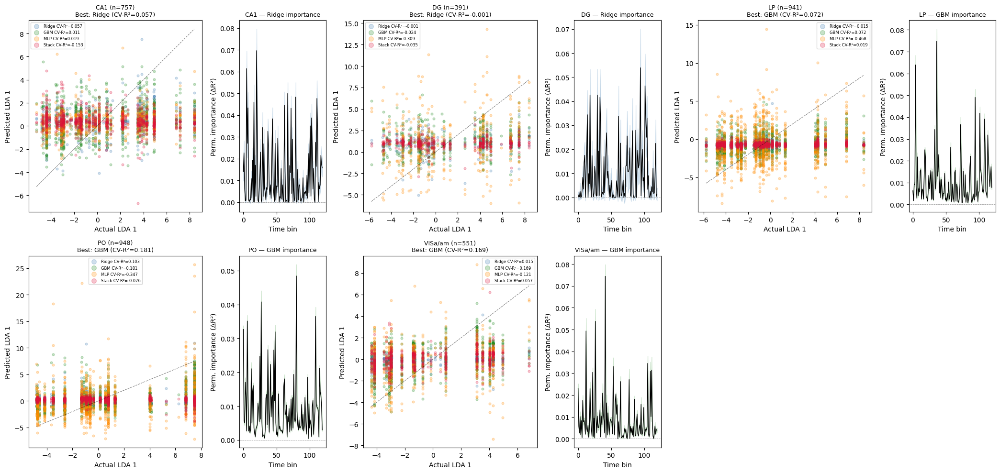

,region,n,r2cv_Ridge,r2cv_GBM,r2cv_MLP,r2cv_Stack,best_model,best_r2cv
3,PO,948,0.102587,0.180952,-0.346940,-0.076054,GBM,0.180952
4,VISa/am,551,0.014828,0.169340,-0.121122,0.057003,GBM,0.169340
2,LP,941,0.014807,0.071672,-0.467617,0.019212,GBM,0.071672
0,CA1,757,0.057474,0.010604,0.018820,-0.153206,Ridge,0.057474
1,DG,391,-0.001167,-0.024233,-0.308985,-0.034826,Ridge,-0.001167


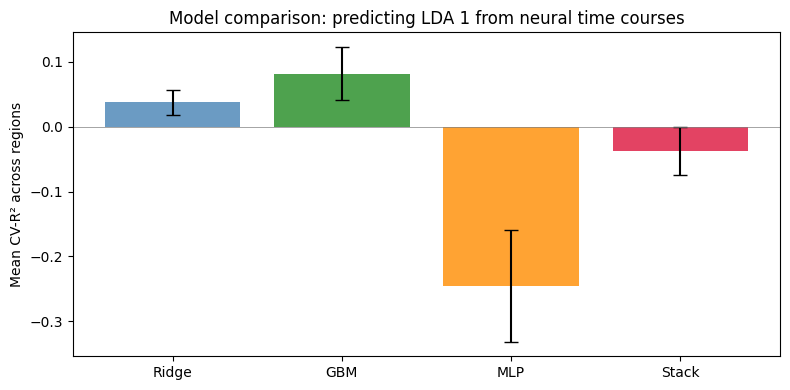

In [ ]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import RidgeCV
from sklearn.ensemble import HistGradientBoostingRegressor, StackingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import cross_val_predict, KFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.metrics import r2_score
import warnings

# time_cols = [f'time_{i}' for i in range(90)]
time_cols = np.arange(0, 120, 1)
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

regions = sorted(filtered['beryl_acronym'].unique())
n_regions = len(regions)
ncols = 3
nrows = int(np.ceil(n_regions / ncols))

n_cv_folds = 5
kf = KFold(n_splits=n_cv_folds, shuffle=True, random_state=42)

# --- Define models ---
models = {
    'Ridge': Pipeline([
        ('scaler', StandardScaler()),
        ('model', RidgeCV(alphas=np.logspace(-3, 3, 20)))
    ]),
    'GBM': HistGradientBoostingRegressor(
        max_iter=300, max_depth=4, learning_rate=0.05,
        min_samples_leaf=10, random_state=42
    ),
    'MLP': Pipeline([
        ('scaler', StandardScaler()),
        ('model', MLPRegressor(
            hidden_layer_sizes=(128, 64, 32), max_iter=2000,
            early_stopping=True, validation_fraction=0.15,
            learning_rate='adaptive', random_state=42
        ))
    ]),
    'Stack': Pipeline([
        ('scaler', StandardScaler()),
        ('model', StackingRegressor(
            estimators=[
                ('ridge', RidgeCV(alphas=np.logspace(-3, 3, 20))),
                ('gbm', HistGradientBoostingRegressor(
                    max_iter=200, max_depth=4, learning_rate=0.05,
                    min_samples_leaf=10, random_state=42)),
                ('mlp', MLPRegressor(
                    hidden_layer_sizes=(64, 32), max_iter=800,
                    early_stopping=True, random_state=42)),
            ],
            final_estimator=RidgeCV(),
            cv=3, n_jobs=-1
        ))
    ]),
}

model_colors = {'Ridge': 'steelblue', 'GBM': 'forestgreen',
                'MLP': 'darkorange', 'Stack': 'crimson'}

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(7 * ncols, 5 * nrows),
                         gridspec_kw={'width_ratios': [2, 1] * ncols})
axes_flat = axes.flatten()

all_results = []

for reg_idx, region in enumerate(regions):
    ax_pred = axes_flat[(reg_idx % ncols) * 2 + (reg_idx // ncols) * ncols * 2]
    ax_imp  = axes_flat[(reg_idx % ncols) * 2 + 1 + (reg_idx // ncols) * ncols * 2]

    region_summary = filtered[filtered['beryl_acronym'] == region]
    merged = region_summary.merge(lda[['lda_1', 'session']], on='session')

    if merged.empty or len(merged) < 20:
        ax_pred.set_visible(False)
        ax_imp.set_visible(False)
        continue

    X = merged[time_cols].values
    y = merged['lda_1'].values

    # --- Cross-validated predictions for each model ---
    best_name, best_r2 = None, -np.inf
    region_results = {'region': region, 'n': len(merged)}

    for name, model in models.items():
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            y_cv = cross_val_predict(model, X, y, cv=kf)
        r2_cv = r2_score(y, y_cv)
        region_results[f'r2cv_{name}'] = r2_cv

        ax_pred.scatter(y, y_cv, alpha=0.25, s=12, color=model_colors[name],
                        label=f'{name} CV-R²={r2_cv:.3f}')

        if r2_cv > best_r2:
            best_r2 = r2_cv
            best_name = name

    region_results['best_model'] = best_name
    region_results['best_r2cv'] = best_r2
    all_results.append(region_results)

    # Identity line
    lims = [y.min(), y.max()]
    ax_pred.plot(lims, lims, 'k--', linewidth=0.8, alpha=0.5)
    ax_pred.set_xlabel('Actual LDA 1')
    ax_pred.set_ylabel('Predicted LDA 1')
    ax_pred.set_title(f'{region} (n={len(merged)})\nBest: {best_name} (CV-R²={best_r2:.3f})',
                      fontsize=9)
    ax_pred.legend(fontsize=6, markerscale=2)

    # --- Permutation importance for best model (right panel) ---
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        best_model = models[best_name]
        best_model_clone = type(best_model)(**best_model.get_params()) if not isinstance(best_model, Pipeline) \
            else Pipeline([(n, type(s)(**s.get_params())) for n, s in best_model.steps])
        best_model.fit(X, y)
        perm = permutation_importance(best_model, X, y, n_repeats=10,
                                      random_state=42, scoring='r2')

    imp_mean = perm.importances_mean
    imp_std = perm.importances_std

    ax_imp.plot(np.arange(120), imp_mean, color='black', linewidth=1)
    ax_imp.fill_between(np.arange(120), imp_mean - imp_std, imp_mean + imp_std,
                        alpha=0.2, color=model_colors[best_name])
    ax_imp.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    ax_imp.set_xlabel('Time bin')
    ax_imp.set_ylabel('Perm. importance (ΔR²)')
    ax_imp.set_title(f'{region} — {best_name} importance', fontsize=9)

for idx in range(len(regions) * 2, len(axes_flat)):
    axes_flat[idx].set_visible(False)

fig.tight_layout()
plt.show()

# --- Summary table ---
res_df = pd.DataFrame(all_results).sort_values('best_r2cv', ascending=False)
display(res_df)

# --- Overall model comparison ---
r2_cols = [c for c in res_df.columns if c.startswith('r2cv_')]
fig2, ax2 = plt.subplots(figsize=(8, 4))
model_means = res_df[r2_cols].mean()
model_sems = res_df[r2_cols].sem()
names = [c.replace('r2cv_', '') for c in r2_cols]
colors = [model_colors[n] for n in names]
ax2.bar(names, model_means, yerr=model_sems, color=colors, alpha=0.8, capsize=5)
ax2.set_ylabel('Mean CV-R² across regions')
ax2.set_title('Model comparison: predicting LDA 1 from neural time courses')
ax2.axhline(0, color='gray', linewidth=0.5)
fig2.tight_layout()
plt.show()

### Correlation test

Real correlation: -0.2179 ± 0.0000
Shuffled correlation: -0.0091 ± 0.0690
Two-sided P-value: 0.0000


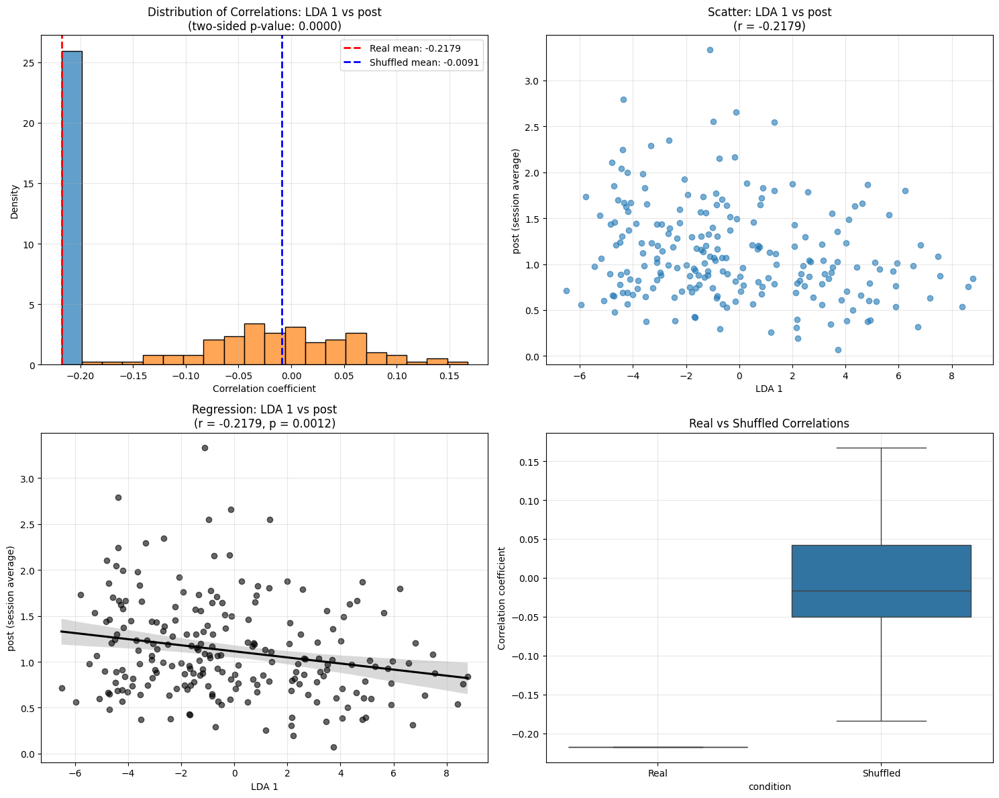


Actual data from last iteration:
Correlation: -0.2179
P-value (parametric): 0.0012
Number of sessions: 217


In [161]:
summary_df = all_session_mean.copy()
post_cols = np.arange(51, 70, 1)  
summary_df['post'] = summary_df[post_cols].mean(axis=1)

# Average post values per session BEFORE all calculations
summary_df_session = summary_df.groupby('session')['post'].mean().reset_index()

from sklearn.metrics import r2_score
import matplotlib.colors as mcolors
from scipy.stats import pearsonr

# Set parameters
n_shuffles = 100
results_real = []
results_shuffled = []
use_var = 'post'
# Get available sessions for subsampling
available_sessions = lda.loc[lda['session'].isin(list(bwm_df.eid)), 'session'].unique()

for i in range(n_shuffles):
    # Subsample sessions (same fraction as before, or adjust as needed)
    sampled_sessions = np.random.choice(available_sessions, 
                                       size=min(len(lda_eid), len(available_sessions)), 
                                       replace=False)
    
    # Get the subsampled data
    subsample_lda = lda.loc[lda['session'].isin(sampled_sessions)]
    merged_subsample = summary_df_session.merge(subsample_lda[['lda_1', 'session']], on='session')
    
    # Real data: calculate correlation between lda_1 and post
    real_corr, real_p = pearsonr(merged_subsample['lda_1'], merged_subsample[use_var])
    results_real.append(real_corr)
    
    # Shuffled control: shuffle lda_1 values (each session gets a different session's lda_1 value)
    shuffled_lda1 = np.random.permutation(merged_subsample['lda_1'].values)
    merged_shuffled = merged_subsample.copy()
    merged_shuffled['lda_1'] = shuffled_lda1
    
    shuffled_corr, shuffled_p = pearsonr(merged_shuffled['lda_1'], merged_shuffled[use_var])
    results_shuffled.append(shuffled_corr)

# Calculate statistics
real_mean = np.mean(results_real)
shuffled_mean = np.mean(results_shuffled)
real_std = np.std(results_real)
shuffled_std = np.std(results_shuffled)

print(f"Real correlation: {real_mean:.4f} ± {real_std:.4f}")
print(f"Shuffled correlation: {shuffled_mean:.4f} ± {shuffled_std:.4f}")

# Calculate two-sided p-value
p_value = np.mean(np.abs(results_shuffled) >= np.abs(real_mean))
print(f"Two-sided P-value: {p_value:.4f}")

# Create plot data for histogram
plot_data = []

# Add real data
for corr in results_real:
    plot_data.append({
        'correlation': corr,
        'condition': 'Real'
    })

# Add shuffled data
for corr in results_shuffled:
    plot_data.append({
        'correlation': corr,
        'condition': 'Shuffled'
    })

plot_df = pd.DataFrame(plot_data)

# Create figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Histogram of correlations
sns.histplot(data=plot_df, x='correlation', hue='condition', 
             alpha=0.7, bins=20, stat='density', ax=axes[0,0])
axes[0,0].axvline(real_mean, color='red', linestyle='--', linewidth=2, label=f'Real mean: {real_mean:.4f}')
axes[0,0].axvline(shuffled_mean, color='blue', linestyle='--', linewidth=2, label=f'Shuffled mean: {shuffled_mean:.4f}')
axes[0,0].set_xlabel('Correlation coefficient')
axes[0,0].set_ylabel('Density')
axes[0,0].set_title(f'Distribution of Correlations: LDA 1 vs {use_var}\n(two-sided p-value: {p_value:.4f})')
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

# 2. Scatter plot of actual data (from last iteration)
axes[0,1].scatter(merged_subsample['lda_1'], merged_subsample[use_var], alpha=0.6)
axes[0,1].set_xlabel('LDA 1')
axes[0,1].set_ylabel(f'{use_var} (session average)')
axes[0,1].set_title(f'Scatter: LDA 1 vs {use_var}\n(r = {real_corr:.4f})')
axes[0,1].grid(True, alpha=0.3)

# 3. Regression plot
sns.regplot(data=merged_subsample, x='lda_1', y=use_var, 
           scatter_kws={'alpha':0.6}, ax=axes[1,0], color='black')
axes[1,0].set_xlabel('LDA 1')
axes[1,0].set_ylabel(f'{use_var} (session average)')
axes[1,0].set_title(f'Regression: LDA 1 vs {use_var}\n(r = {real_corr:.4f}, p = {real_p:.4f})')
axes[1,0].grid(True, alpha=0.3)

# 4. Box plot comparing real vs shuffled distributions
sns.boxplot(data=plot_df, x='condition', y='correlation', ax=axes[1,1])
axes[1,1].set_ylabel('Correlation coefficient')
axes[1,1].set_title('Real vs Shuffled Correlations')
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print additional statistics
print(f"\nActual data from last iteration:")
print(f"Correlation: {real_corr:.4f}")
print(f"P-value (parametric): {real_p:.4f}")
print(f"Number of sessions: {len(merged_subsample)}")

# PCA analyses

In [166]:
regions = BrainRegions()
BRAIN_REGIONS = ['VISa', 'VISam', 'CA1', 'DG', 'LP', 'PO']
summary_df = all_session_mean.copy()
summary_df = summary_df.dropna(subset=['area']).copy()

# Acronyms → Allen IDs → Beryl IDs → Beryl acronyms
allen_ids = regions.acronym2id(summary_df['area'].values)
beryl_ids = regions.remap(allen_ids, source_map='Allen', target_map='Beryl')
summary_df['beryl_acronym'] = regions.id2acronym(beryl_ids)

filtered = summary_df[summary_df['beryl_acronym'].isin(BRAIN_REGIONS)]

In [199]:
filtered = summary_df.copy()

In [200]:
filtered.loc[filtered['beryl_acronym'] == 'VISa', 'beryl_acronym'] = 'VISa/am'
filtered.loc[filtered['beryl_acronym'] == 'VISam', 'beryl_acronym'] = 'VISa/am' 

# Extract baseline (timesteps 20-30) and average
# baseline_cols = np.arange(20, 31)  # time_20 to time_30
# post_cols = np.arange(40, 61)  # time_40 to time_60
post_cols = np.arange(41, 60, 1)  
baseline_cols = np.arange(0, 20, 1)  

filtered['baseline'] = filtered.iloc[:, baseline_cols].mean(axis=1)
filtered['post'] = filtered.iloc[:, post_cols].mean(axis=1)
filtered['diff'] = filtered['post'] - filtered['baseline']

In [201]:
data_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
# session_cluster = pd.read_parquet(data_path+'cluster_per_session')
# lda = pd.read_pickle(data_path+'extended_mouse_LDA_5_bins_cut')
lda = pd.read_pickle(data_path+'mouse_LDA_5_bins_cut')


In [202]:
# lda.rename(columns={0: 'lda_1'})
merged_data = filtered.merge(lda[['binned1', 'session']], on='session')


In [203]:
region_colors = ['#008B8B', '#228B22', '#006400', "#FF6976", '#E70E56']       # Pink tones


/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1841130268.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


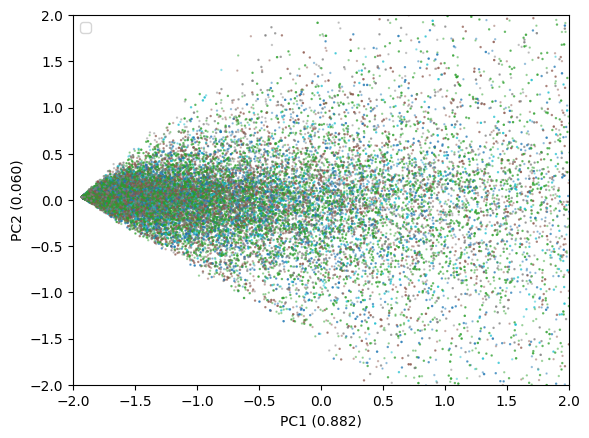

In [204]:
# 1. Select data and drop NaNs safely
subset = merged_data.copy()

subset_labels = subset['binned1']
# subset_labels = subset['beryl_acronym']
# subset_lda1 = subset['lda_1']
subset = subset[np.arange(0, 90, 1)] 
subset = subset.dropna() # This drops rows with NaNs in the relevant columns

# 2. Check if we have data left
X = subset.values
transformed = X
pca = PCA()
pca_data = pca.fit_transform(transformed)
area_colors = subset_labels.astype('category').cat.codes
cmap = 'tab10'  # You can choose any colormap you like

# Plot PCA scatter (first two components)
plt.scatter(pca_data[:, 0], pca_data[:, 1], 
                            alpha=.4, s=.5, c=area_colors, 
                            cmap=cmap)
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.3f})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.3f})')
plt.xlim([-40, 50])
plt.ylim([-50, 50])
plt.ylim(-2, 2)
plt.xlim(-2, 2)
plt.legend()

/var/folders/nt/d2j3zp9d1xzb8wgfrw81j0c40000gn/T/ipykernel_1771/1389302971.py:41: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


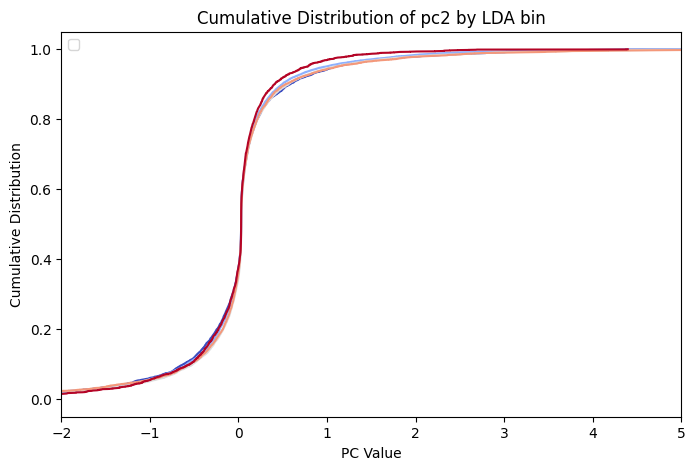

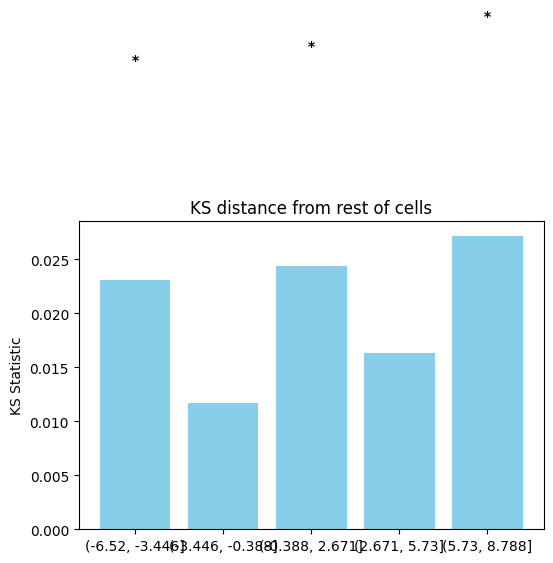

In [206]:
from scipy.stats import ks_2samp
use_pc = 'pc2'

# 1. Prepare Data
pca_df = pd.DataFrame(pca_data, columns=[f'pc{i+1}' for i in range(pca_data.shape[1])])
pca_df['beryl_acronym'] = subset_labels.values
pca_df = pca_df.dropna(subset=['beryl_acronym',use_pc])  # Ensure no NaNs in the relevant columns
pca_df['beryl_acronym'] = pca_df['beryl_acronym'].astype(str)
areas = pca_df['beryl_acronym'].unique()
areas = ['(-8.861, -5.732]', '(-5.732, -2.619]','(-2.619, 0.495]', 
       '(0.495, 3.608]', '(3.608, 6.722]']
areas = ['(-6.52, -3.446]', '(-3.446, -0.388]',
         '(-0.388, 2.671]', '(2.671, 5.73]', '(5.73, 8.788]']

plt.figure(figsize=(8, 5))
ks_results = {}

colors = plt.cm.coolwarm(np.linspace(0, 1, len(areas)))

for i, area in enumerate(areas):
    # Get PC1 values for current area and "rest of the brain"
    area_vals = pca_df[pca_df['beryl_acronym'] == area][use_pc].values
    rest_vals = pca_df[pca_df['beryl_acronym'] != area][use_pc].values
    
    # 2. Compute KS Statistic
    stat, p_val = ks_2samp(area_vals, rest_vals)
    ks_results[area] = {'stat': stat, 'p': p_val}
    
    # 3. Plot CDF
    # Sort values to create the CDF
    sorted_data = np.sort(area_vals)
    cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    # plt.plot(sorted_data, cdf, label=f"{area} (KS={stat:.2f})", color=colors[i])
    plt.plot(sorted_data, cdf, color=colors[i])
plt.xlim([-10, 50])
plt.xlim([-2, 5])
plt.xlabel('PC Value')
plt.ylabel('Cumulative Distribution')
plt.title('Cumulative Distribution of '+use_pc+' by LDA bin')
plt.legend()
plt.show()

# 4. Create the Inset Plot for KS Statistics
fig, ax = plt.subplots(figsize=(6, 4))
# Bar plot of KS statistics
areas_list = list(ks_results.keys())
stats = [ks_results[a]['stat'] for a in areas_list]
p_vals = [ks_results[a]['p'] for a in areas_list]

bars = ax.bar(areas_list, stats, color='skyblue')

# Add asterisks for p < 0.01
for i, p in enumerate(p_vals):
    if p < 0.01:
        ax.text(i, stats[i] + 0.02, '*', ha='center', fontweight='bold')
ax.set_ylabel('KS Statistic')
ax.set_title('KS distance from rest of cells')
plt.show()

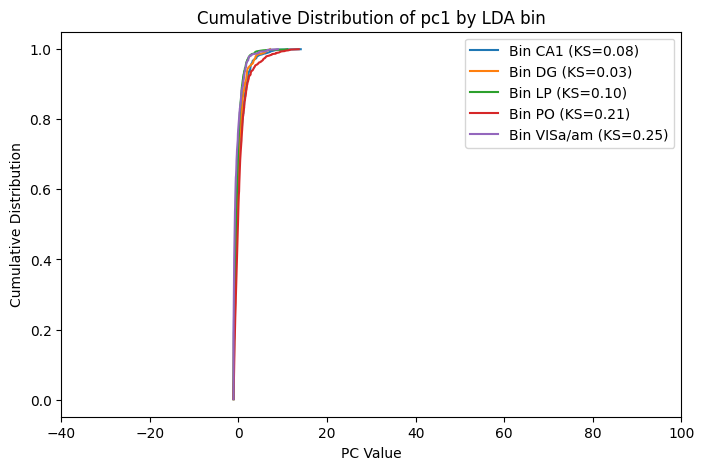

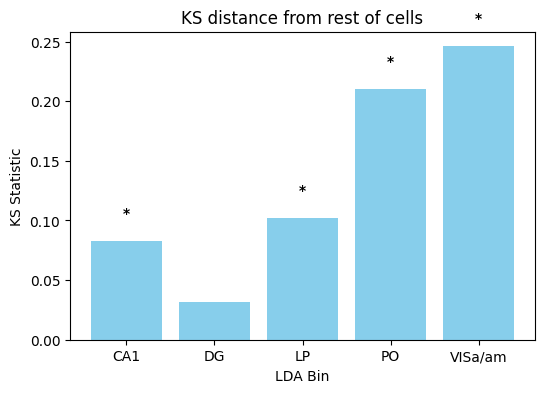

In [191]:
from scipy.stats import ks_2samp
use_pc = 'pc1'

# 1. Prepare Data
pca_df = pd.DataFrame(pca_data, columns=[f'pc{i+1}' for i in range(pca_data.shape[1])])
pca_df['area'] = subset_labels.values
pca_df = pca_df.dropna(subset=['area',use_pc])  # Ensure no NaNs in the relevant columns
pca_df['area'] = pca_df['area'].astype(str)

# Sort areas to maintain consistent ordering
areas = sorted(pca_df['area'].unique(), key=lambda x: int(x) if x.isdigit() else x)

plt.figure(figsize=(8, 5))
ks_results = {}

for area in areas:
    # Get PC1 values for current area and "rest of the brain"
    area_vals = pca_df[pca_df['area'] == area][use_pc].values
    rest_vals = pca_df[pca_df['area'] != area][use_pc].values
    
    # 2. Compute KS Statistic
    stat, p_val = ks_2samp(area_vals, rest_vals)
    ks_results[area] = {'stat': stat, 'p': p_val}
    
    # 3. Plot CDF
    # Sort values to create the CDF
    sorted_data = np.sort(area_vals)
    cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    plt.plot(sorted_data, cdf, label=f"Bin {area} (KS={stat:.2f})")

plt.xlim([-40, 100])
plt.xlabel('PC Value')
plt.ylabel('Cumulative Distribution')
plt.title('Cumulative Distribution of '+use_pc+' by LDA bin')
plt.legend()
plt.show()

# 4. Create the Inset Plot for KS Statistics
fig, ax = plt.subplots(figsize=(6, 4))
# Bar plot of KS statistics - maintain the same order
stats = [ks_results[a]['stat'] for a in areas]
p_vals = [ks_results[a]['p'] for a in areas]

bars = ax.bar(areas, stats, color='skyblue')

# Add asterisks for p < 0.01
for i, p in enumerate(p_vals):
    if p < 0.01:
        ax.text(i, stats[i] + 0.02, '*', ha='center', fontweight='bold')

ax.set_ylabel('KS Statistic')
ax.set_xlabel('LDA Bin')
ax.set_title('KS distance from rest of cells')
plt.show()

In [327]:
from scipy.stats import ks_2samp
use_pc = 'pc1'

# 1. Prepare Data
pca_df = pd.DataFrame(pca_data, columns=[f'pc{i+1}' for i in range(pca_data.shape[1])])
subset_labels = subset['binned1']
pca_df['area'] = subset_labels.values
pca_df = pca_df.dropna(subset=['area',use_pc])  # Ensure no NaNs in the relevant columns
pca_df['area'] = pca_df['area'].astype(str)

# Sort areas to maintain consistent ordering
areas = sorted(pca_df['area'].unique(), key=lambda x: int(x) if x.isdigit() else x)

plt.figure(figsize=(8, 5))
ks_results = {}

for area in areas:
    # Get PC1 values for current area and "rest of the brain"
    area_vals = pca_df[pca_df['area'] == area][use_pc].values
    rest_vals = pca_df[pca_df['area'] != area][use_pc].values
    
    # 2. Compute KS Statistic
    stat, p_val = ks_2samp(area_vals, rest_vals)
    ks_results[area] = {'stat': stat, 'p': p_val}
    
    # 3. Plot CDF
    # Sort values to create the CDF
    sorted_data = np.sort(area_vals)
    cdf = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    
    plt.plot(sorted_data, cdf, label=f"Bin {area} (KS={stat:.2f})")

plt.xlim([-40, 100])
plt.xlabel('PC Value')
plt.ylabel('Cumulative Distribution')
plt.title('Cumulative Distribution of '+use_pc+' by LDA bin')
plt.legend()
plt.show()

# 4. Create the Inset Plot for KS Statistics
fig, ax = plt.subplots(figsize=(6, 4))
# Bar plot of KS statistics - maintain the same order
stats = [ks_results[a]['stat'] for a in areas]
p_vals = [ks_results[a]['p'] for a in areas]

bars = ax.bar(areas, stats, color='skyblue')

# Add asterisks for p < 0.01
for i, p in enumerate(p_vals):
    if p < 0.01:
        ax.text(i, stats[i] + 0.02, '*', ha='center', fontweight='bold')

ax.set_ylabel('KS Statistic')
ax.set_xlabel('LDA Bin')
ax.set_title('KS distance from rest of cells')
plt.show()

KeyError: 'binned1'

In [266]:
component = 'pca_1'

plot_df = subset.dropna().groupby(['session', 'area', 'area'])[component].mean().reset_index()
sns.regplot(x=np.array(plot_df['area']).astype(float), y=(plot_df[component]).astype(float), color='black', ci=95) 
res = stats.pearsonr(np.array(plot_df['area']).astype(float), (plot_df[component]).astype(float))
print(res)

ValueError: cannot insert area, already exists

## Neuronal trajectories

In [207]:
subset = all_session_mean.copy()
subset['pca_1'] = pca_data[:, 0]
subset['pca_2'] = pca_data[:, 1]    

ValueError: Length of values (58960) does not match length of index (74617)

In [258]:
subset['pca_1'] = subset['pca_1'].astype(float)
subset['lda_1'] = subset['lda_1'].astype(float)
subset['lda_2'] = subset['lda_2'].astype(float)

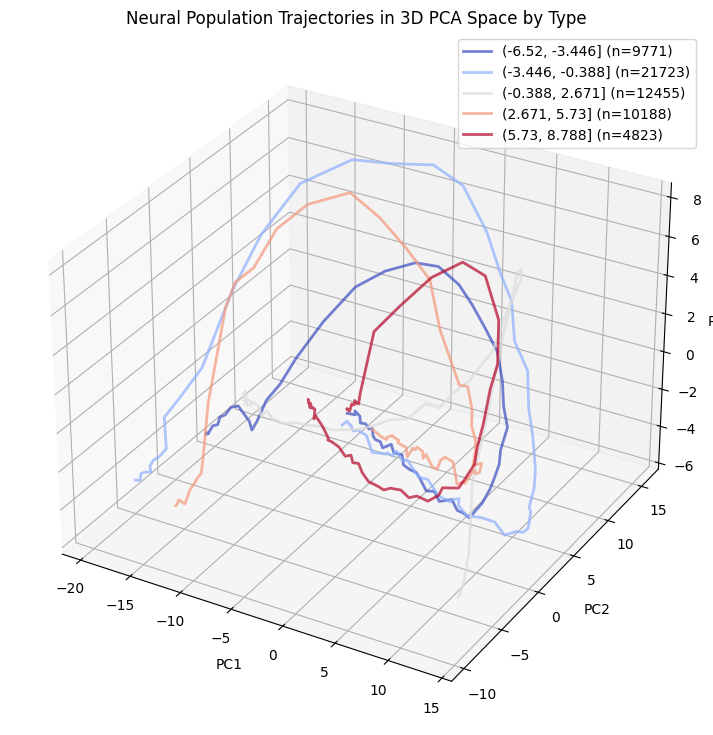

In [328]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 1. Select data and drop NaNs safely
subset = filtered_region.copy()
subset = merged_data.copy()

subset_labels = subset['binned1']
subset_lda1 = subset['lda_1']
neural_data = subset[np.arange(0, 90, 1)] 
neural_data = subset[np.arange(20, 80, 1)] 

# 2. Drop NaNs and keep track of valid indices
valid_mask = ~neural_data.isna().any(axis=1)
neural_data = neural_data[valid_mask]
subset_labels = subset_labels[valid_mask]

# 3. Get unique types
unique_types = subset_labels.unique()

# Create interactive 3D plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

unique_types = unique_types.sort_values()[:-1]
colors = plt.cm.coolwarm(np.linspace(0, 1, len(unique_types)))

# 4. Process each neuron type separately
for i, neuron_type in enumerate(unique_types):
    # Get neurons of this type
    type_mask = subset_labels == neuron_type
    type_neural_data = neural_data[type_mask]
    
    if len(type_neural_data) == 0:
        continue
        
    # Transpose: timepoints × neurons of this type
    X_type = type_neural_data.values.T
    
    # Fit PCA on this type's data
    pca_type = PCA()
    pca_data_type = pca_type.fit_transform(X_type)
    
    # Plot 3D trajectory
    ax.plot(pca_data_type[:, 0], pca_data_type[:, 1], pca_data_type[:, 2],
            alpha=0.7, color=colors[i], linewidth=2, 
            label=f'{neuron_type} (n={len(type_neural_data)})')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2') 
ax.set_zlabel('PC3')
ax.set_title('Neural Population Trajectories in 3D PCA Space by Type')
ax.legend()
ax.grid(True, alpha=0.3)

# Enable interactive rotation
plt.show()

# Optional: Set initial viewing angle
# ax.view_init(elev=20, azim=45)

In [329]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.decomposition import PCA

# 1. Select data and drop NaNs safely
subset = filtered_region.copy()
subset = merged_data.copy()

subset_labels = subset['binned1']
# subset_lda1 = subset['lda_1']
neural_data = subset[np.arange(0, 90, 1)] 
neural_data = subset[np.arange(20, 80, 1)] 

# 2. Drop NaNs and keep track of valid indices
valid_mask = ~neural_data.isna().any(axis=1)
neural_data = neural_data[valid_mask]
subset_labels = subset_labels[valid_mask]

# 3. Get unique types
unique_types = subset_labels.unique()
unique_types = unique_types.sort_values()[:-1]

# Create plotly figure
fig = go.Figure()

# Generate colors for each type
colors = px.colors.sample_colorscale('viridis', [i/(len(unique_types)-1) for i in range(len(unique_types))])

# 4. Process each neuron type separately
for i, neuron_type in enumerate(unique_types):
    # Get neurons of this type
    type_mask = subset_labels == neuron_type
    type_neural_data = neural_data[type_mask]
    
    if len(type_neural_data) == 0:
        continue
        
    # Transpose: timepoints × neurons of this type
    X_type = type_neural_data.values.T
    
    # Fit PCA on this type's data
    pca_type = PCA()
    pca_data_type = pca_type.fit_transform(X_type)
    
    # Add 3D trajectory as connected scatter plot
    fig.add_trace(go.Scatter3d(
        x=pca_data_type[:, 0],
        y=pca_data_type[:, 1], 
        z=pca_data_type[:, 2],
        mode='lines+markers',
        line=dict(color=colors[i], width=4),
        marker=dict(size=3, color=colors[i]),
        name=f'{neuron_type} (n={len(type_neural_data)})',
        hovertemplate=f'<b>{neuron_type}</b><br>' +
                      'PC1: %{x:.2f}<br>' +
                      'PC2: %{y:.2f}<br>' +
                      'PC3: %{z:.2f}<br>' +
                      'Timepoint: %{pointNumber}<extra></extra>'
    ))

# Update layout for better interactivity
fig.update_layout(
    title='Neural Population Trajectories in 3D PCA Space by Type',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
        camera=dict(
            eye=dict(x=1.2, y=1.2, z=1.2)
        )
    ),
    width=900,
    height=700,
    showlegend=True
)

# Show interactive plot
fig.show()

In [330]:
import plotly.graph_objects as go
import plotly.express as px
from sklearn.decomposition import PCA

# 1. Select data and drop NaNs safely
subset = merged_data.copy()

subset_labels = subset['binned1']
neural_data = subset[np.arange(20, 80, 1)] 

# 2. Drop NaNs and keep track of valid indices
valid_mask = ~neural_data.isna().any(axis=1)
neural_data = neural_data[valid_mask]
subset_labels = subset_labels[valid_mask]

# 3. Get unique types
unique_types = subset_labels.unique()
unique_types = unique_types.sort_values()[:-1]

# Create plotly figure
fig = go.Figure()

# Generate coolwarm colors for each type
colors = px.colors.sample_colorscale('RdBu', [i/(len(unique_types)-1) for i in range(len(unique_types))])

# 4. Process each neuron type separately
for i, neuron_type in enumerate(unique_types):
    # Get neurons of this type
    type_mask = subset_labels == neuron_type
    type_neural_data = neural_data[type_mask]
    
    if len(type_neural_data) == 0:
        continue
        
    # Transpose: timepoints × neurons of this type
    X_type = type_neural_data.values.T
    
    # Fit PCA on individual trajectories and calculate mean + error
    pca_trajectories = []
    pca_type = PCA()
    
    # For each neuron, get its PCA trajectory
    for neuron_idx in range(X_type.shape[1]):
        neuron_traj = X_type[:, neuron_idx].reshape(-1, 1)
        # Fit PCA on all neurons of this type to get consistent components
        if neuron_idx == 0:
            pca_type.fit(X_type)
        # Transform this neuron's trajectory
        pca_traj = pca_type.transform(X_type)[:, :3]  # Take first 3 components
        pca_trajectories.append(pca_traj)
    
    # Convert to array and calculate statistics
    pca_trajectories = np.array(pca_trajectories)  # neurons × timepoints × components
    
    # Calculate mean trajectory and standard error
    mean_trajectory = np.mean(pca_trajectories, axis=0)
    std_trajectory = np.std(pca_trajectories, axis=0)
    se_trajectory = std_trajectory / np.sqrt(len(pca_trajectories))
    
    # Add main trajectory with error bars
    fig.add_trace(go.Scatter3d(
        x=mean_trajectory[:, 0],
        y=mean_trajectory[:, 1], 
        z=mean_trajectory[:, 2],
        mode='lines+markers',
        line=dict(color=colors[i], width=3),
        marker=dict(size=2, color=colors[i]),
        name=f'{neuron_type} (n={len(type_neural_data)})',
        error_x=dict(type='data', array=se_trajectory[:, 0], visible=True, thickness=2),
        error_y=dict(type='data', array=se_trajectory[:, 1], visible=True, thickness=2),
        error_z=dict(type='data', array=se_trajectory[:, 2], visible=True, thickness=2),
        hovertemplate=f'<b>{neuron_type}</b><br>' +
                      'PC1: %{x:.2f}<br>' +
                      'PC2: %{y:.2f}<br>' +
                      'PC3: %{z:.2f}<br>' +
                      'Timepoint: %{pointNumber}<extra></extra>'
    ))
    
    # Mark first timepoint (timepoint 0)
    fig.add_trace(go.Scatter3d(
        x=[mean_trajectory[0, 0]],
        y=[mean_trajectory[0, 1]], 
        z=[mean_trajectory[0, 2]],
        mode='markers',
        marker=dict(size=5, color='black', symbol='diamond', 
                   line=dict(width=2, color='white')),
        name=f'{neuron_type} - Start',
        showlegend=False,
        hovertemplate=f'<b>{neuron_type} - Timepoint 0</b><br>' +
                      'PC1: %{x:.2f}<br>' +
                      'PC2: %{y:.2f}<br>' +
                      'PC3: %{z:.2f}<extra></extra>'
    ))
    
    # Mark timepoint 30 (if it exists)
    if len(mean_trajectory) > 30:
        fig.add_trace(go.Scatter3d(
            x=[mean_trajectory[30, 0]],
            y=[mean_trajectory[30, 1]], 
            z=[mean_trajectory[30, 2]],
            mode='markers',
            marker=dict(size=5, color='gold', symbol='square', 
                       line=dict(width=2, color='black')),
            name=f'{neuron_type} - T30',
            showlegend=False,
            hovertemplate=f'<b>{neuron_type} - Timepoint 30</b><br>' +
                          'PC1: %{x:.2f}<br>' +
                          'PC2: %{y:.2f}<br>' +
                          'PC3: %{z:.2f}<extra></extra>'
        ))

# Update layout for better interactivity
fig.update_layout(
    title='Neural Population Trajectories in 3D PCA Space by Type<br><sub>Black diamonds: Start (T=0), Gold squares: Timepoint 30</sub>',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
        camera=dict(
            eye=dict(x=1.2, y=1.2, z=1.2)
        )
    ),
    width=900,
    height=700,
    showlegend=True
)

# Show interactive plot
fig.show()
